# Import packages

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import tensorflow as tf
# from tensorflow import keras
# from tensorflow.keras.utils import to_categorical
# import tensorflow_datasets as tfds

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
import os
import random
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
import seaborn as sn

In [ ]:
! pip install xlsxwriter
import xlsxwriter

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 149 kB 4.1 MB/s 


# Utility functions

In [ ]:
!pip install matplotx[all]
import matplotx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 58 kB 2.7 MB/s 


In [ ]:
def plotVsRatio(exps, results_df, ds_name, x='ood_ratio', y='acc', thrs=['0.0']):
  stability_df = list()
  
  plt.figure(figsize=(20,8))
  ax = plt.gca()
  ax.set_ylim([0, 110])
  
  # colors = ['#ef5350', '#880e4f', '#7b1fa2', '#7e75c2', '#18237e', '#90caf9', '#43a047', '#ffee58', \
  #           '#827717', '#ff6f00', '#8d6e63', '#607d8b', '#76ff03', '#e040fb', '#212121', '#18ffff']

  for idx, exp in enumerate(exps):
    if 'thr' in exp:
      for thr in thrs:
        condition = (results_df['exp']==exp) & (results_df['ds']==ds_name) & (results_df['thr']==thr)
        label = f'{exp} - {thr}'
        sub_results = results_df.loc[condition]
        sub_results.plot(x=x, y=y, ax=ax, label=label ) #, color=colors[idx])
        mean = round(sub_results[y].mean(), 2)
        std = round(sub_results[y].std(), 2)
        stability_df.append([label, mean, std])
    else:
      condition = (results_df['exp']==exp) & (results_df['ds']==ds_name)
      label = exp
      sub_results = results_df.loc[condition]
      sub_results.plot(x=x, y=y, ax=ax, label=label) #, color=colors[idx])

      mean = round(sub_results[y].mean(), 2)
      std = round(sub_results[y].std(), 2)
      stability_df.append([label, mean, std])

  matplotx.line_labels()
  
  stability_df= pd.DataFrame(stability_df, columns=['exp', 'mean', 'std'])

  display(stability_df)

In [ ]:
def plotVsThr(exps, results_df, ds_name, x='thr', y='acc', ratios=['0']):
  stability_df = list()
  is_acc = 'acc' in y
  is_sens = 'sens' in y
  is_spec = 'spec' in y
  
  plt.figure(figsize=(20,8))
  ax = plt.gca()
  ax.set_ylim([0, 110])
  
  # colors = ['#ef5350', '#880e4f', '#7b1fa2', '#7e75c2', '#18237e', '#90caf9', '#43a047', '#ffee58', \
  #           '#827717', '#ff6f00', '#8d6e63', '#607d8b', '#76ff03', '#e040fb', '#212121', '#18ffff']

  for idx, exp in enumerate(exps):
    for ratio in ratios:
      if is_acc or (is_sens and ratio=='0') or (is_spec and ratio=='100'):
        condition = (results_df['exp']==exp) & (results_df['ds']==ds_name) & (results_df['ood_ratio']==ratio)
        label = f'{exp} - {ratio}'
        sub_results = results_df.loc[condition]
        sub_results.plot(x=x, y=y, ax=ax, label=label ) #, color=colors[idx])

        mean = round(sub_results[y].mean(), 2)
        std = round(sub_results[y].std(), 2)
        stability_df.append([label, mean, std])

  matplotx.line_labels()
  
  stability_df= pd.DataFrame(stability_df, columns=['exp', 'mean', 'std'])

  display(stability_df)

In [ ]:
def printDiscData(exps, results_df, ds_name, x='ratio', y='acc', ratios=['0']):
  
  is_acc = 'acc' in y
  is_sens = 'sens' in y
  is_spec = 'spec' in y

  print(f"{ds_name} {y} results")
  disc_acc = list()
  for exp in exps:
    exp_acc = [exp]
    for ratio in ratios:
      if is_acc or (is_sens and ratio=='0') or (is_spec and ratio=='100'):
        condition = (results_df['exp']==exp) & (results_df['ds']==ds_name) & (results_df['ood_ratio']==ratio)
        # label = f'{exp} - {ratio}'
        sub_results = results_df.loc[condition]
        exp_acc.append(round(sub_results[y].mean(), 2))

    disc_acc.append(exp_acc)
    
  if is_acc:
    first_header = ['exp'] + [x for _ in range(len(ratios))]
    second_header = [''] + ratios
    columns=[first_header, second_header]
  else:
    columns=['exp', y]

  disc_acc = pd.DataFrame(disc_acc, columns=columns)
  display(disc_acc)

# Algos plots & results

## load results

In [ ]:
data_file = '/content/drive/MyDrive/PhD/Szeged22_paper/Atca_Cyber_long_paper/data/all_results_df_all.pkl'
all_results = pd.read_pickle(data_file)
all_results

,exp,ds,ood_ratio,thr,acc,acc_balanced,P_macro,P_weighted,R_macro,R_weighted,...,acc_bin,acc_balanced_bin,P_macro_bin,P_weighted_bin,R_macro_bin,R_weighted_bin,F1_macro_bin,F1_weighted_bin,sensitivity,specifity
0,thr,mnist,0,0.0,94.47,92.60,94.79,94.65,92.60,94.47,...,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,NaN
1,thr,mnist,5,0.0,89.76,90.17,86.82,87.75,90.17,89.76,...,95.04,50.00,47.52,90.33,50.00,95.04,48.73,92.62,100.00,0.0
2,thr,mnist,10,0.0,85.02,90.14,84.26,81.84,90.14,85.02,...,90.02,50.00,45.01,81.04,50.00,90.02,47.37,85.29,100.00,0.0
3,thr,mnist,15,0.0,80.23,90.06,82.44,76.23,90.06,80.23,...,85.01,50.00,42.51,72.27,50.00,85.01,45.95,78.13,100.00,0.0
4,thr,mnist,20,0.0,75.49,90.04,81.00,70.93,90.04,75.49,...,80.00,50.00,40.00,64.01,50.00,80.00,44.45,71.12,100.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39746,dpmDiscOr,rnd,85,NaN,93.26,54.00,94.01,93.33,54.00,93.26,...,93.33,77.53,96.37,93.81,77.53,93.33,83.62,92.49,55.06,100.0
39747,dpmDiscOr,rnd,90,NaN,95.39,52.86,90.94,95.16,52.86,95.39,...,95.44,76.93,97.59,95.66,76.93,95.44,83.77,94.82,53.85,100.0
39748,dpmDiscOr,rnd,95,NaN,97.80,54.21,91.61,97.61,54.21,97.80,...,97.81,77.38,98.87,97.86,77.38,97.81,84.81,97.50,54.75,100.0
39749,dpmDiscOr,rnd,100,NaN,100.00,100.00,100.00,100.00,100.00,100.00,...,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,NaN,100.0


## Pick threshold

            acc
thr            
0.93  83.852362


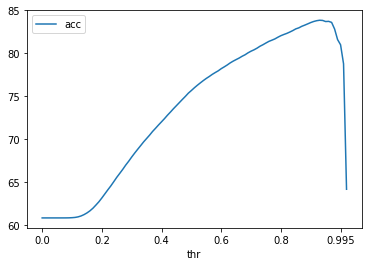

In [ ]:
subdf_mean = all_results[['exp','thr','acc']].loc[(all_results['exp'].str.contains('thr'))].groupby('thr').mean()
print(subdf_mean.loc[subdf_mean['acc']==max(subdf_mean['acc'])])
subdf_mean.plot()

           acc
thr           
0.96  9.589287
acc    10.150969
Name: 0.98, dtype: float64


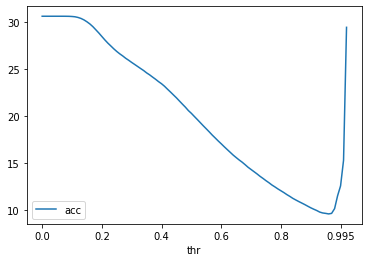

In [ ]:
subdf_std = all_results[['exp','thr','acc']].loc[(all_results['exp'].str.contains('thr'))].groupby('thr').std()
print(subdf_std.loc[subdf_std['acc']==min(subdf_std['acc'])])
print(subdf_std.iloc[98])
subdf_std.plot()

In [ ]:
print(subdf_mean.iloc[99])
print(subdf_std.iloc[99])

acc    81.600236
Name: 0.99, dtype: float64
acc    11.513747
Name: 0.99, dtype: float64


In [ ]:
print(subdf_mean.iloc[93])
print(subdf_std.iloc[93])

acc    83.852362
Name: 0.93, dtype: float64
acc    9.786183
Name: 0.93, dtype: float64


In [ ]:
print(subdf_mean.iloc[80])
print(subdf_std.iloc[80])

acc    82.053412
Name: 0.8, dtype: float64
acc    12.050103
Name: 0.8, dtype: float64


## define variables

In [ ]:
algorithms = ['thr', 'disc', 'thrDiscAnd', 'thrDiscOr', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
datasets = ['mnist', 'bmnist', 'kmnist', 'fmnist', 'num', 'rnd']
ratios = [str(n) for n in range(0, 101, 5)]
thrs = [str(i/100) for i in range(100)]
thrs.extend(['0.995', '0.999', '1'])
scores_list = ['acc', 'acc_balanced', 'P_macro', 'P_weighted', 'R_macro', 'R_weighted', 'F1_macro', 'F1_weighted', \
               'acc_bin', 'acc_balanced_bin', 'P_macro_bin', 'P_weighted_bin', 'R_macro_bin', 'R_weighted_bin', 'F1_macro_bin', 'F1_weighted_bin', \
               'sensitivity', 'specifity']

results_df = all_results.copy()

## Pivot table per dataset

In [ ]:
results_df_pivot = pd.pivot_table(results_df, values='D', index=['A', 'B'], columns=['C'], aggfunc=np.sum)

## plotting

### Plot Acc vs. ratio

In [ ]:
y = 'acc'
exps = algorithms.copy()
target_thrs = ['0.93', '0.99'] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.93,74.94,5.31
1,thr - 0.99,73.63,4.08
2,disc,90.52,5.88
3,thrDiscAnd - 0.93,80.39,8.67
4,thrDiscAnd - 0.99,85.82,3.67
5,thrDiscOr - 0.93,85.08,9.27
6,thrDiscOr - 0.99,78.34,13.48
7,dpm,67.57,1.25
8,dpmDiscAnd,80.49,7.17
9,dpmDiscOr,77.61,13.92


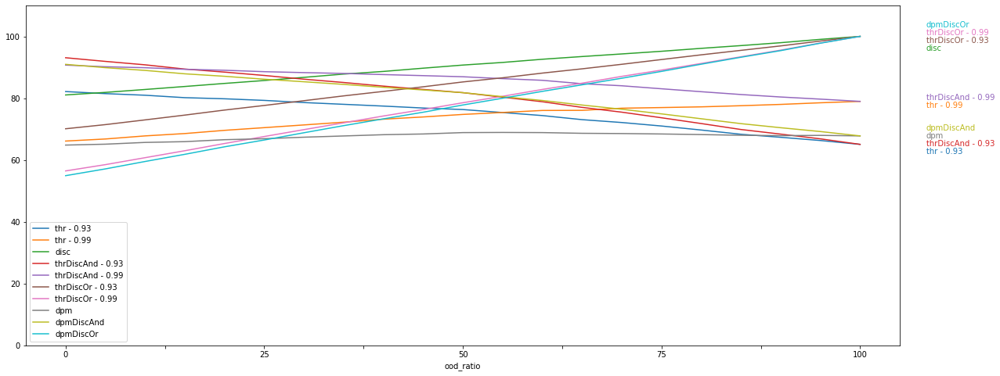

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.93,74.94,5.31
1,thr - 0.99,73.63,4.08
2,disc,90.52,5.88
3,thrDiscAnd - 0.93,80.39,8.67
4,thrDiscAnd - 0.99,85.82,3.67
5,thrDiscOr - 0.93,85.08,9.27
6,thrDiscOr - 0.99,78.34,13.48
7,dpm,67.57,1.25
8,dpmDiscAnd,80.49,7.17
9,dpmDiscOr,77.61,13.92


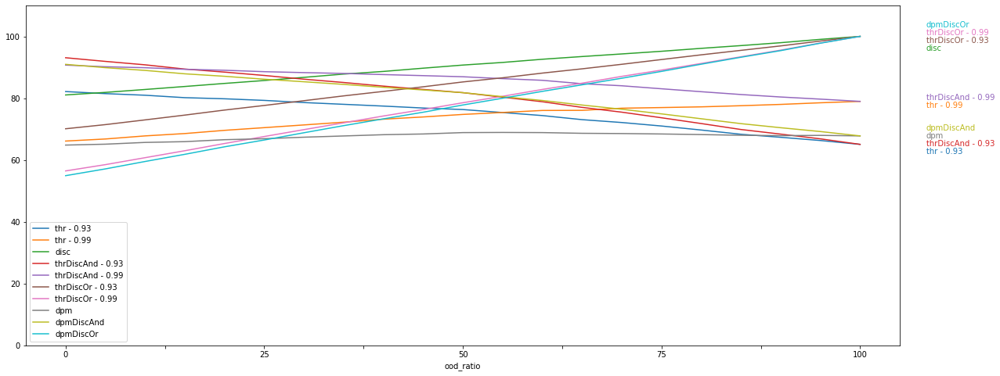

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.93,70.52,8.00
1,thr - 0.99,69.98,1.79
2,disc,90.46,5.85
3,thrDiscAnd - 0.93,75.92,11.39
4,thrDiscAnd - 0.99,82.12,6.26
5,thrDiscOr - 0.93,85.05,9.25
6,thrDiscOr - 0.99,78.32,13.47
7,dpm,63.34,2.05
8,dpmDiscAnd,76.21,9.90
9,dpmDiscOr,77.58,13.90


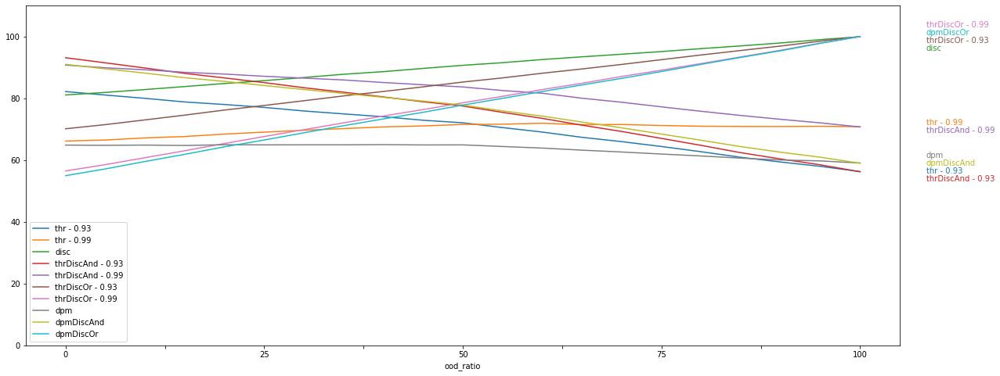

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.93,87.31,3.22
1,thr - 0.99,81.94,9.75
2,disc,90.52,5.88
3,thrDiscAnd - 0.93,92.75,0.19
4,thrDiscAnd - 0.99,94.11,2.15
5,thrDiscOr - 0.93,85.08,9.27
6,thrDiscOr - 0.99,78.35,13.47
7,dpm,76.76,7.29
8,dpmDiscAnd,89.67,0.75
9,dpmDiscOr,77.62,13.92


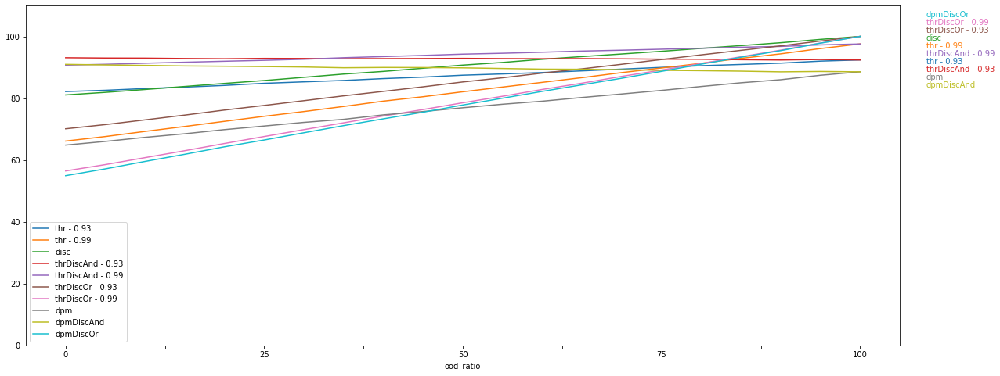

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.93,78.23,2.41
1,thr - 0.99,80.99,9.14
2,disc,90.46,5.85
3,thrDiscAnd - 0.93,83.61,5.82
4,thrDiscAnd - 0.99,93.10,1.52
5,thrDiscOr - 0.93,85.07,9.26
6,thrDiscOr - 0.99,78.35,13.47
7,dpm,71.68,4.18
8,dpmDiscAnd,84.56,3.88
9,dpmDiscOr,77.59,13.90


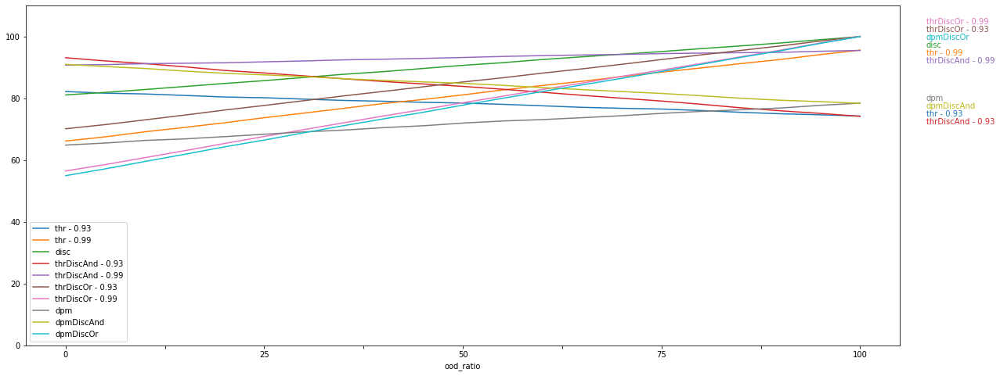

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.93,90.43,5.17
1,thr - 0.99,83.14,10.49
2,disc,72.18,5.53
3,thrDiscAnd - 0.93,77.73,9.49
4,thrDiscAnd - 0.99,76.97,8.52
5,thrDiscOr - 0.93,84.88,9.13
6,thrDiscOr - 0.99,78.35,13.47
7,dpm,73.73,5.20
8,dpmDiscAnd,71.30,12.24
9,dpmDiscOr,74.62,11.90


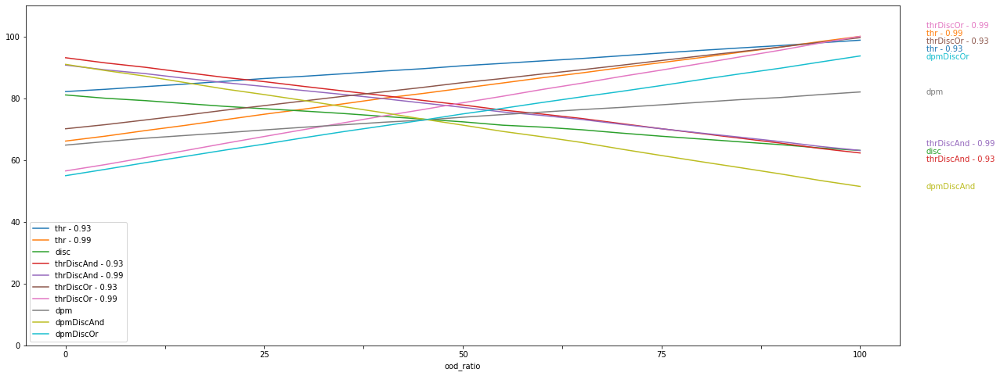

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.93,91.06,5.55
1,thr - 0.99,83.14,10.49
2,disc,90.53,5.88
3,thrDiscAnd - 0.93,96.50,2.17
4,thrDiscAnd - 0.99,95.32,2.90
5,thrDiscOr - 0.93,85.08,9.27
6,thrDiscOr - 0.99,78.35,13.47
7,dpm,82.48,10.85
8,dpmDiscAnd,95.40,2.81
9,dpmDiscOr,77.62,13.92


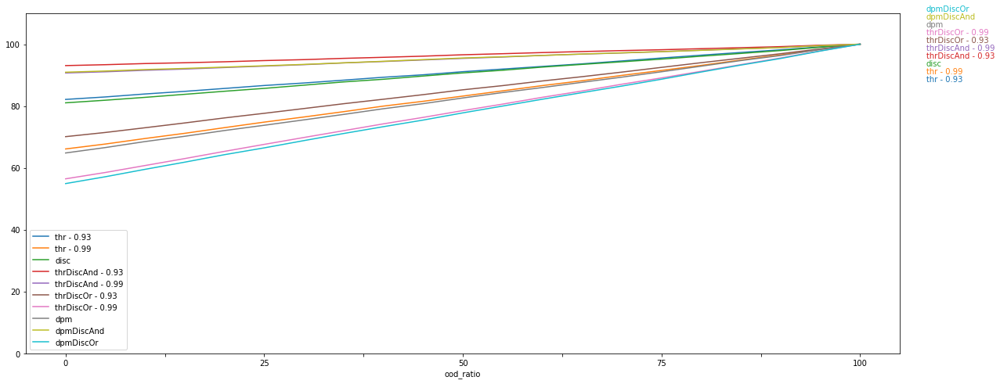

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot balanced Acc vs. ratio

In [ ]:
y = 'acc_balanced'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,62.91,3.75
1,disc,78.55,4.92
2,thrDiscAnd - 0.99,86.66,1.81
3,thrDiscOr - 0.99,54.79,10.38
4,dpm,65.14,0.98
5,dpmDiscAnd,87.17,4.46
6,dpmDiscOr,56.52,9.99


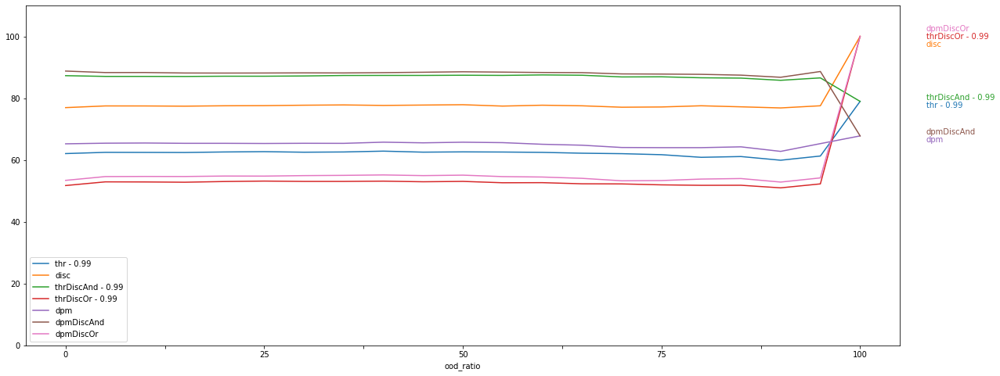

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,62.36,2.07
1,disc,78.54,4.90
2,thrDiscAnd - 0.99,86.10,3.56
3,thrDiscOr - 0.99,54.79,10.37
4,dpm,64.52,1.48
5,dpmDiscAnd,86.54,6.34
6,dpmDiscOr,56.52,9.97


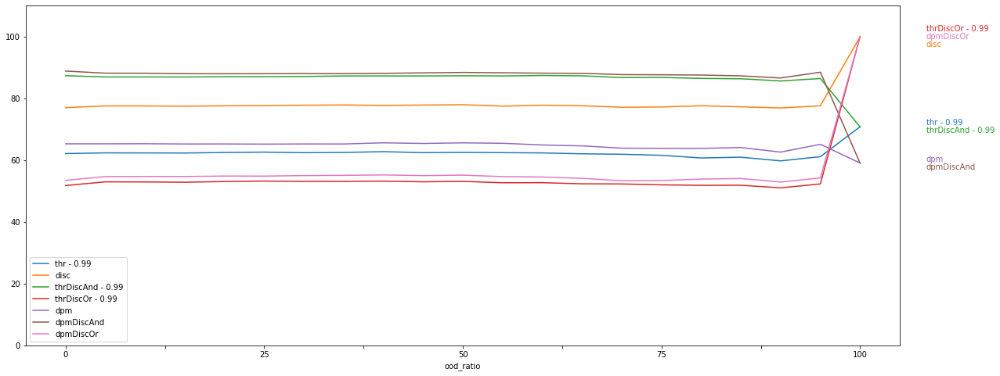

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.17,7.68
1,disc,78.55,4.92
2,thrDiscAnd - 0.99,87.92,2.24
3,thrDiscOr - 0.99,54.79,10.38
4,dpm,66.54,5.09
5,dpmDiscAnd,88.57,0.39
6,dpmDiscOr,56.52,9.99


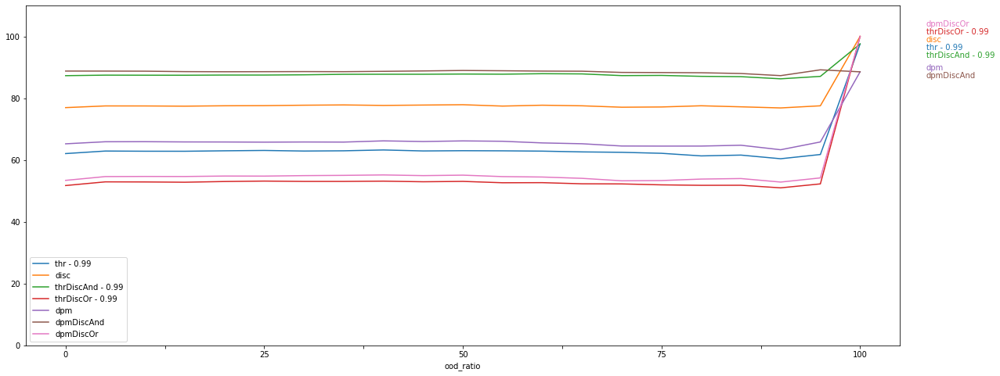

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.03,7.26
1,disc,78.54,4.90
2,thrDiscAnd - 0.99,87.78,1.80
3,thrDiscOr - 0.99,54.79,10.38
4,dpm,65.82,2.97
5,dpmDiscAnd,87.84,2.21
6,dpmDiscOr,56.52,9.97


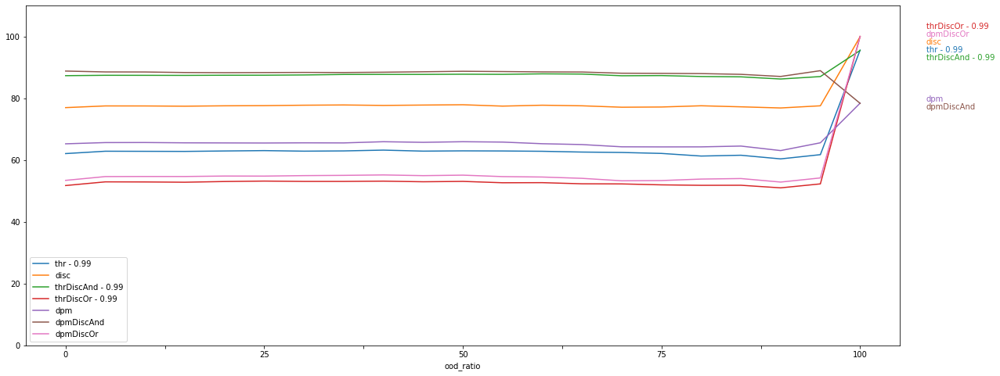

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.34,8.20
1,disc,75.92,2.95
2,thrDiscAnd - 0.99,85.47,5.14
3,thrDiscOr - 0.99,54.79,10.38
4,dpm,66.10,3.72
5,dpmDiscAnd,85.94,7.92
6,dpmDiscOr,56.09,8.64


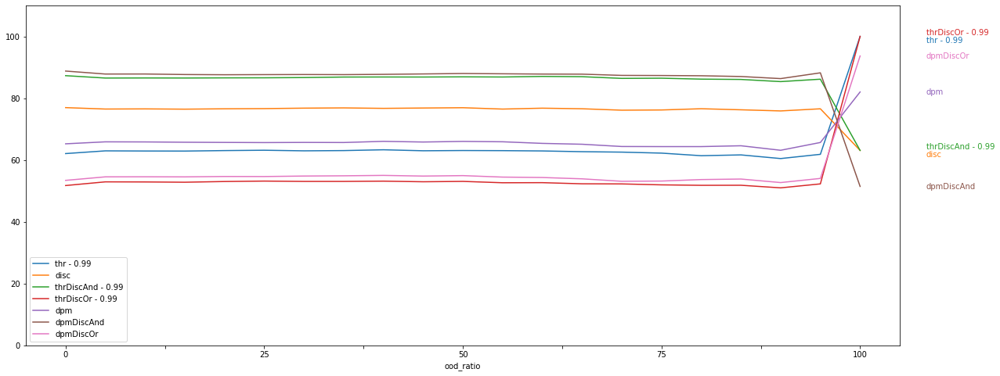

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.34,8.20
1,disc,78.55,4.92
2,thrDiscAnd - 0.99,88.10,2.75
3,thrDiscOr - 0.99,54.79,10.38
4,dpm,67.36,7.52
5,dpmDiscAnd,89.39,2.46
6,dpmDiscOr,56.52,9.99


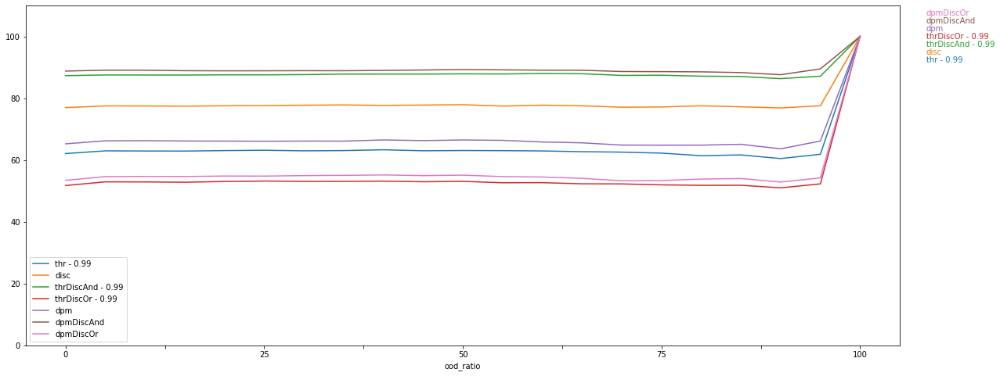

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot macro Precision vs. ratio

In [ ]:
y = 'P_macro'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,88.40,13.18
1,disc,93.32,1.85
2,thrDiscAnd - 0.99,88.30,12.70
3,thrDiscOr - 0.99,92.84,4.95
4,dpm,88.34,16.68
5,dpmDiscAnd,86.21,16.09
6,dpmDiscOr,95.80,2.08


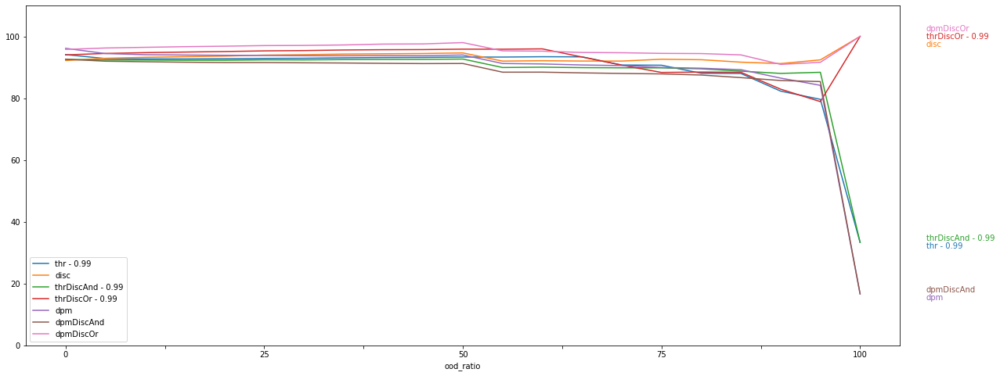

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,88.40,13.15
1,disc,88.67,15.83
2,thrDiscAnd - 0.99,87.26,16.28
3,thrDiscOr - 0.99,90.00,10.55
4,dpm,88.69,15.96
5,dpmDiscAnd,86.11,16.61
6,dpmDiscOr,92.96,10.12


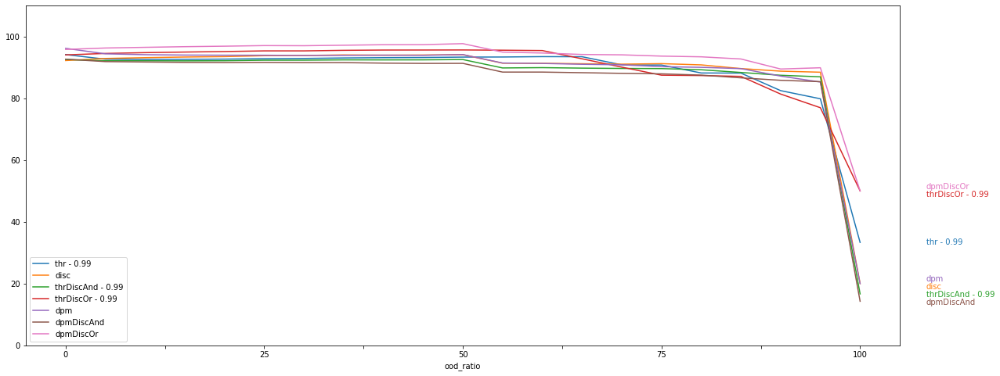

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,87.79,17.40
1,disc,90.88,9.43
2,thrDiscAnd - 0.99,87.65,16.96
3,thrDiscOr - 0.99,92.84,4.95
4,dpm,86.71,18.15
5,dpmDiscAnd,84.80,17.49
6,dpmDiscOr,95.81,2.08


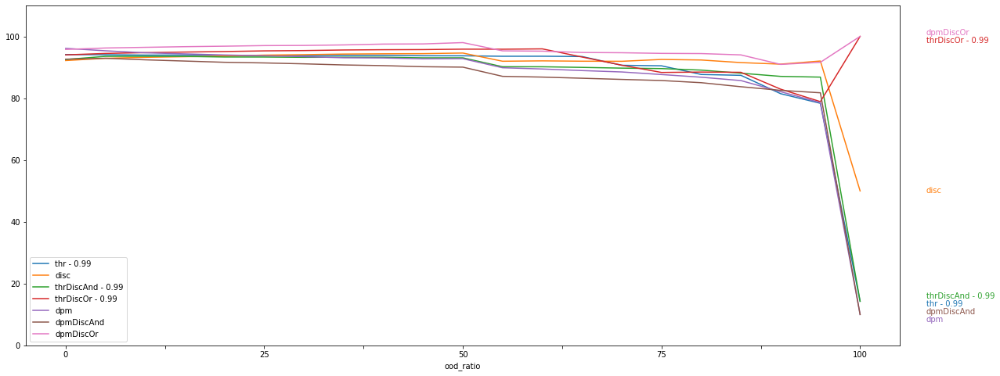

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,86.64,17.11
1,disc,88.71,17.12
2,thrDiscAnd - 0.99,86.19,17.52
3,thrDiscOr - 0.99,92.84,4.95
4,dpm,84.95,18.14
5,dpmDiscAnd,83.17,17.63
6,dpmDiscOr,92.40,13.70


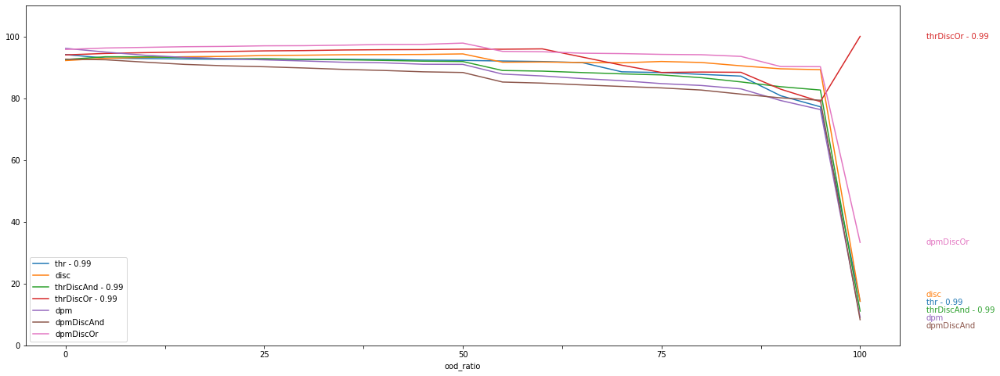

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,94.14,3.61
1,disc,84.39,15.00
2,thrDiscAnd - 0.99,85.16,15.21
3,thrDiscOr - 0.99,92.84,4.95
4,dpm,89.35,15.10
5,dpmDiscAnd,84.89,15.12
6,dpmDiscOr,89.63,15.21


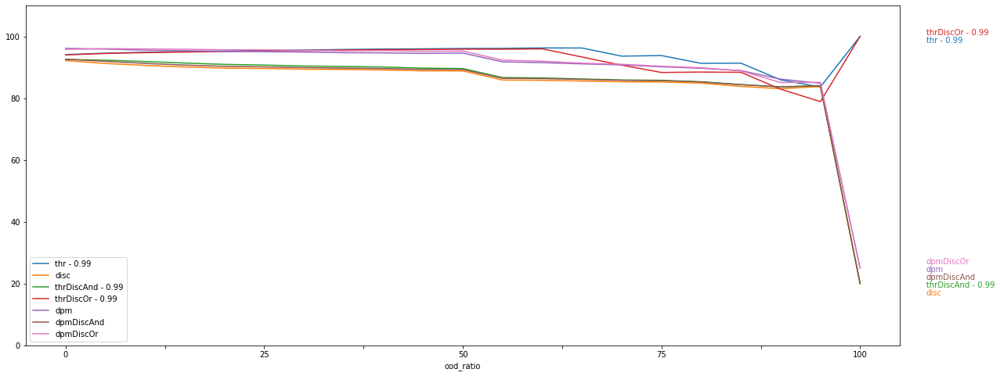

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,94.14,3.61
1,disc,93.32,1.85
2,thrDiscAnd - 0.99,93.86,1.84
3,thrDiscOr - 0.99,92.84,4.95
4,dpm,96.31,1.91
5,dpmDiscAnd,93.98,1.81
6,dpmDiscOr,95.81,2.08


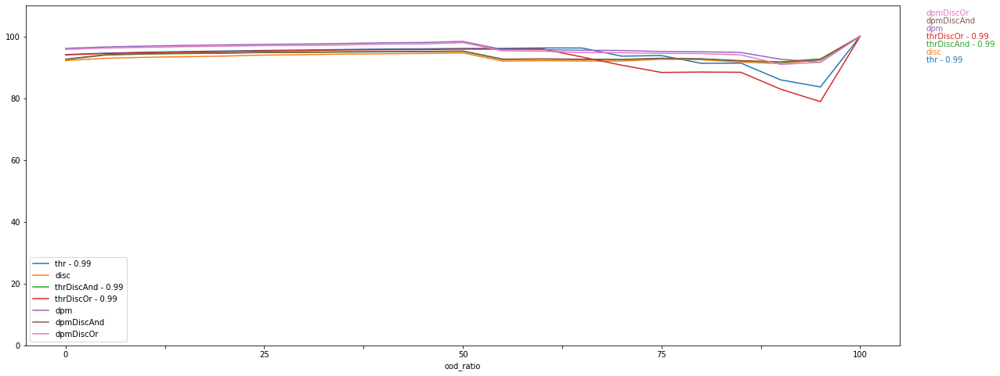

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot weighted Precision vs. ratio

In [ ]:
y = 'P_weighted'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,89.43,5.20
1,disc,92.72,3.67
2,thrDiscAnd - 0.99,94.95,2.68
3,thrDiscOr - 0.99,89.29,5.24
4,dpm,88.02,5.98
5,dpmDiscAnd,94.36,2.85
6,dpmDiscOr,89.24,5.42


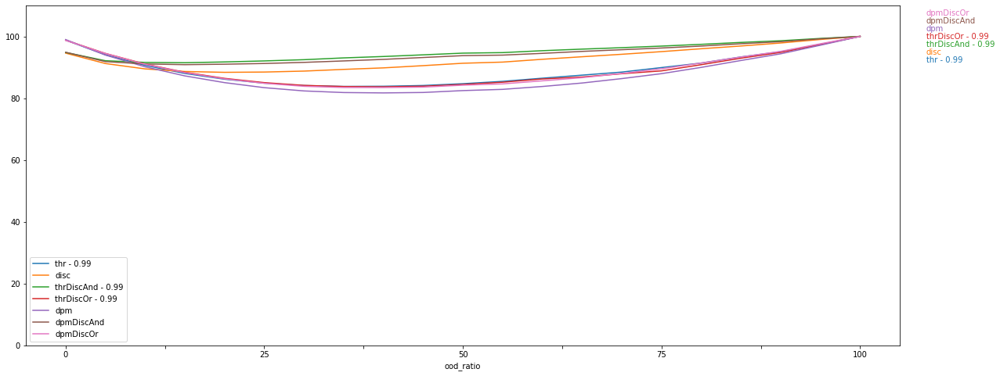

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,88.90,5.42
1,disc,92.65,3.67
2,thrDiscAnd - 0.99,94.78,2.74
3,thrDiscOr - 0.99,89.26,5.24
4,dpm,87.27,6.33
5,dpmDiscAnd,94.15,2.93
6,dpmDiscOr,89.20,5.43


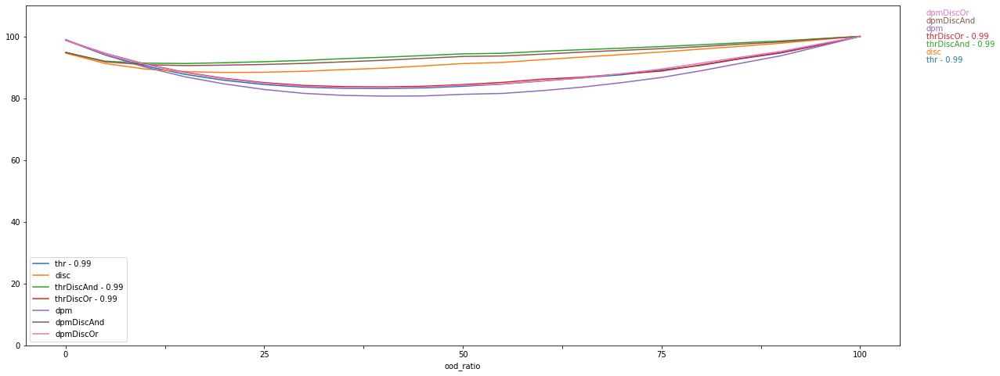

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,90.49,4.72
1,disc,92.72,3.66
2,thrDiscAnd - 0.99,95.30,2.44
3,thrDiscOr - 0.99,89.28,5.23
4,dpm,89.11,5.51
5,dpmDiscAnd,94.51,2.70
6,dpmDiscOr,89.23,5.42


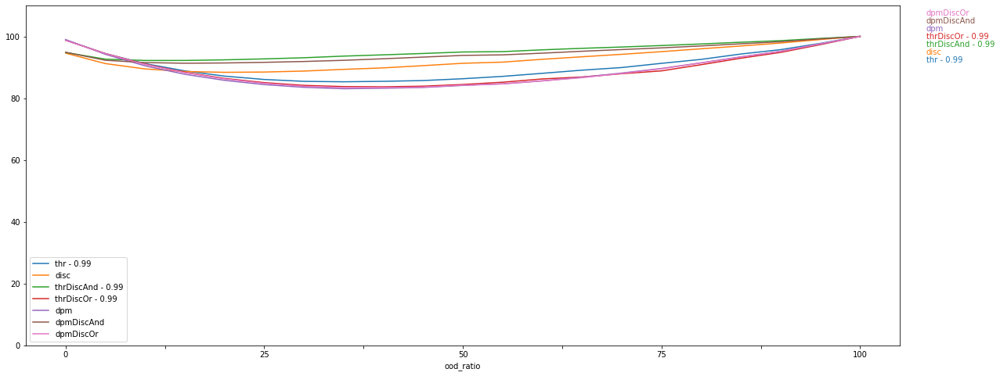

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,89.89,4.99
1,disc,92.65,3.66
2,thrDiscAnd - 0.99,94.87,2.50
3,thrDiscOr - 0.99,89.28,5.23
4,dpm,88.00,6.05
5,dpmDiscAnd,93.96,2.95
6,dpmDiscOr,89.19,5.43


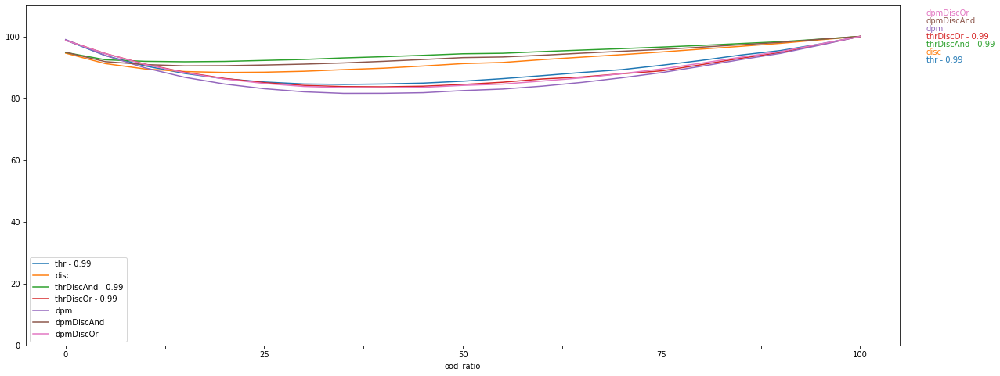

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,90.92,4.54
1,disc,89.13,5.33
2,thrDiscAnd - 0.99,93.04,3.54
3,thrDiscOr - 0.99,89.28,5.23
4,dpm,88.62,5.78
5,dpmDiscAnd,92.48,3.84
6,dpmDiscOr,88.13,5.96


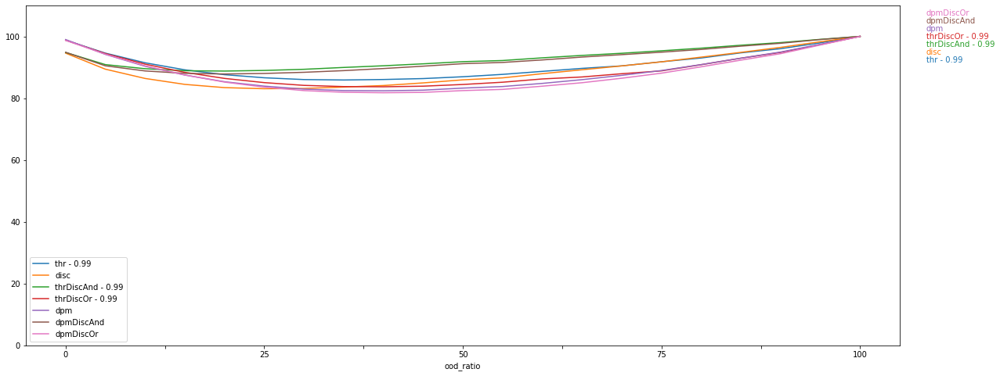

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,90.92,4.54
1,disc,92.72,3.67
2,thrDiscAnd - 0.99,95.60,2.41
3,thrDiscOr - 0.99,89.28,5.23
4,dpm,90.82,4.68
5,dpmDiscAnd,95.66,2.35
6,dpmDiscOr,89.23,5.42


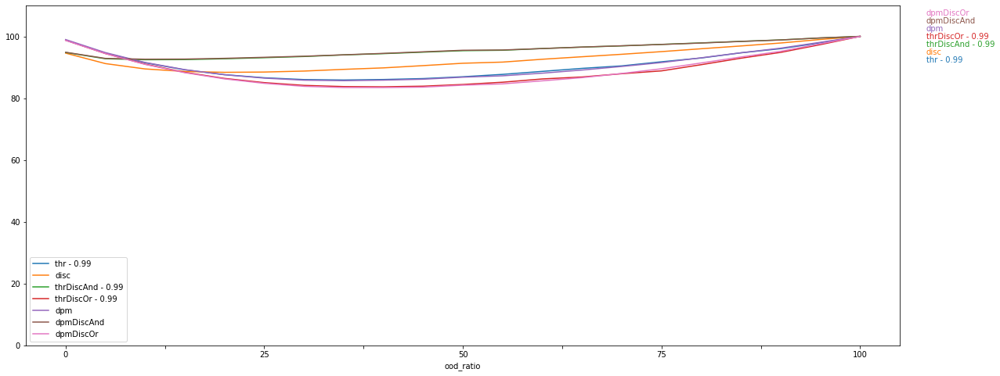

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot macro Recall vs. ratio

In [ ]:
y = 'R_macro'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,60.33,7.83
1,disc,78.45,4.98
2,thrDiscAnd - 0.99,84.05,13.24
3,thrDiscOr - 0.99,54.73,10.40
4,dpm,62.37,11.73
5,dpmDiscAnd,84.36,16.75
6,dpmDiscOr,56.45,10.01


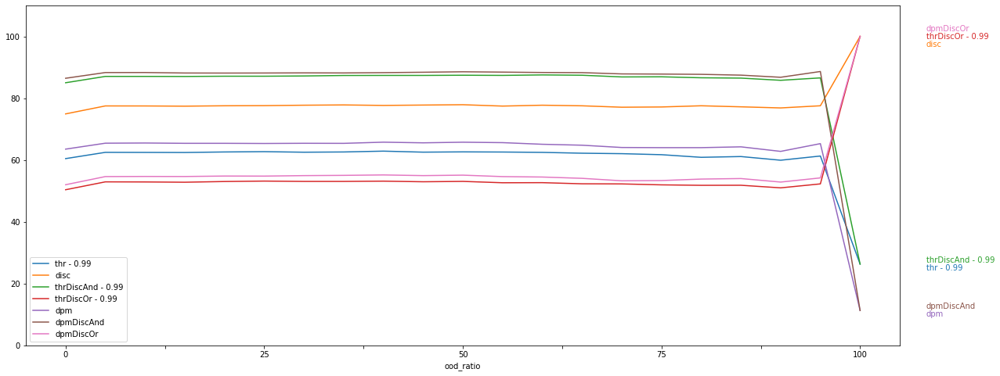

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,60.03,8.39
1,disc,74.64,12.54
2,thrDiscAnd - 0.99,83.19,16.37
3,thrDiscOr - 0.99,52.35,0.92
4,dpm,62.19,11.58
5,dpmDiscAnd,84.03,17.33
6,dpmDiscOr,54.07,1.25


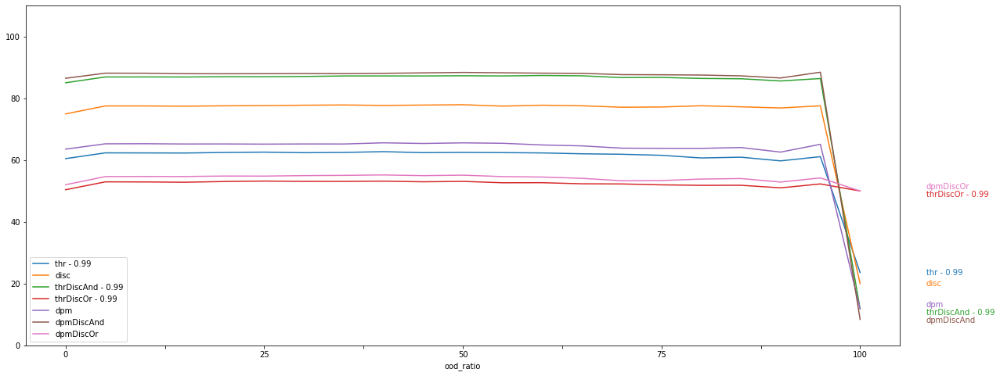

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,60.11,10.61
1,disc,76.07,6.01
2,thrDiscAnd - 0.99,83.83,16.03
3,thrDiscOr - 0.99,54.73,10.40
4,dpm,62.67,12.36
5,dpmDiscAnd,84.66,17.38
6,dpmDiscOr,56.45,10.01


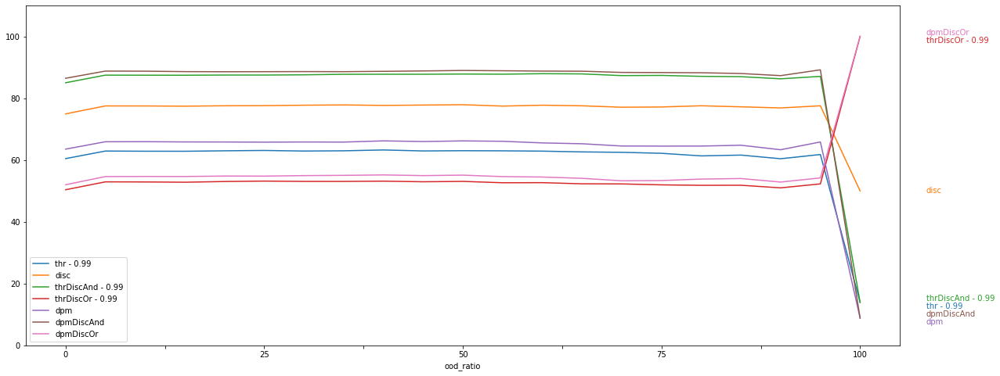

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,60.05,10.66
1,disc,74.36,13.78
2,thrDiscAnd - 0.99,83.63,16.74
3,thrDiscOr - 0.99,54.73,10.40
4,dpm,62.34,12.68
5,dpmDiscAnd,84.31,17.83
6,dpmDiscOr,53.28,4.65


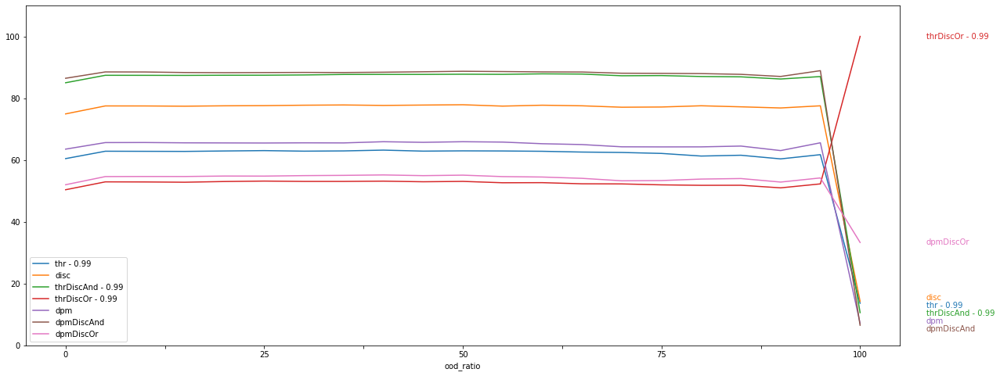

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.27,8.23
1,disc,73.42,13.94
2,thrDiscAnd - 0.99,82.95,16.12
3,thrDiscOr - 0.99,54.73,10.40
4,dpm,63.09,9.79
5,dpmDiscAnd,83.86,16.86
6,dpmDiscOr,52.67,6.75


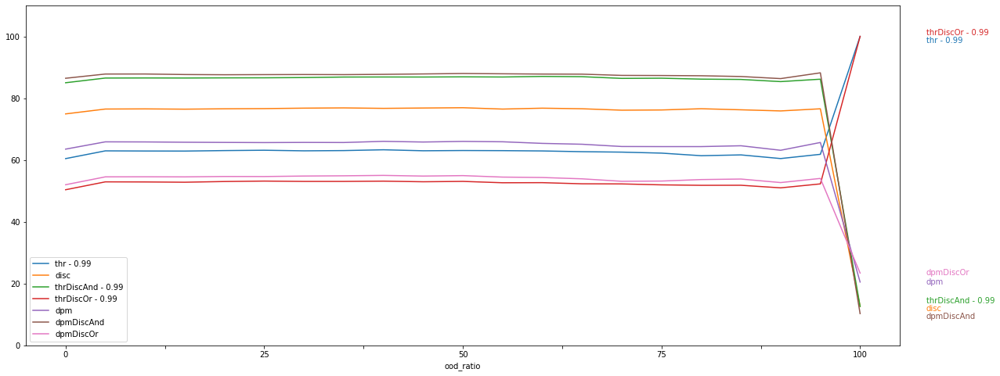

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.27,8.23
1,disc,78.45,4.98
2,thrDiscAnd - 0.99,87.99,2.83
3,thrDiscOr - 0.99,54.73,10.40
4,dpm,67.28,7.55
5,dpmDiscAnd,89.28,2.54
6,dpmDiscOr,56.45,10.01


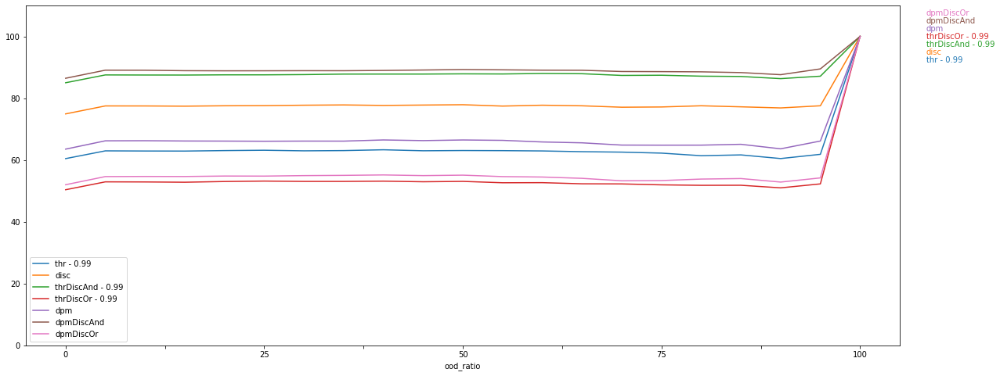

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot weighted Recall vs. ratio

In [ ]:
y = 'R_weighted'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,73.63,4.08
1,disc,90.52,5.88
2,thrDiscAnd - 0.99,85.82,3.67
3,thrDiscOr - 0.99,78.34,13.48
4,dpm,67.57,1.25
5,dpmDiscAnd,80.49,7.17
6,dpmDiscOr,77.61,13.92


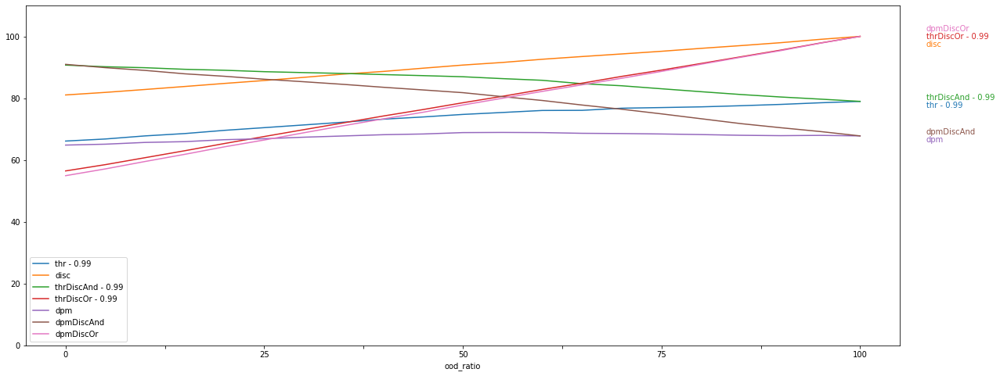

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,69.98,1.79
1,disc,90.46,5.85
2,thrDiscAnd - 0.99,82.12,6.26
3,thrDiscOr - 0.99,78.32,13.47
4,dpm,63.34,2.05
5,dpmDiscAnd,76.21,9.90
6,dpmDiscOr,77.58,13.90


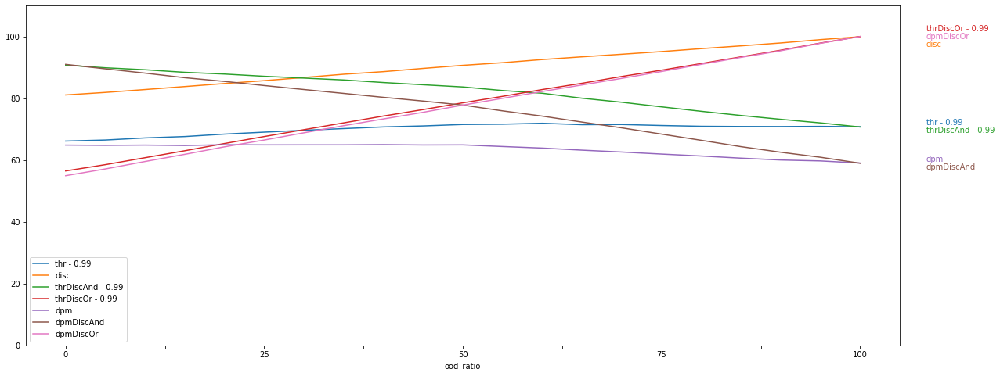

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.94,9.75
1,disc,90.52,5.88
2,thrDiscAnd - 0.99,94.11,2.15
3,thrDiscOr - 0.99,78.35,13.47
4,dpm,76.76,7.29
5,dpmDiscAnd,89.67,0.75
6,dpmDiscOr,77.62,13.92


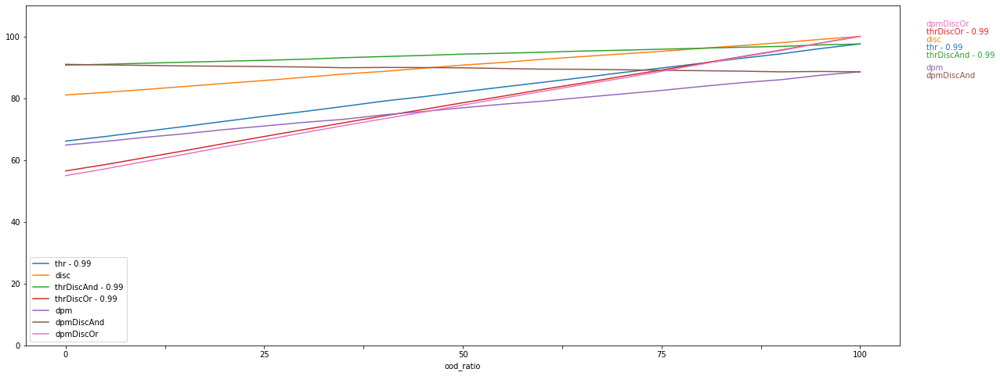

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,80.99,9.14
1,disc,90.46,5.85
2,thrDiscAnd - 0.99,93.10,1.52
3,thrDiscOr - 0.99,78.35,13.47
4,dpm,71.68,4.18
5,dpmDiscAnd,84.56,3.88
6,dpmDiscOr,77.59,13.90


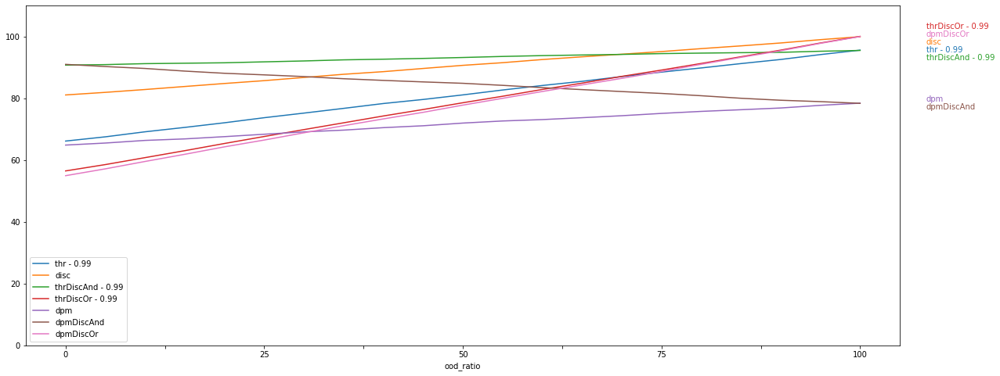

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.14,10.49
1,disc,72.18,5.53
2,thrDiscAnd - 0.99,76.97,8.52
3,thrDiscOr - 0.99,78.35,13.47
4,dpm,73.73,5.20
5,dpmDiscAnd,71.30,12.24
6,dpmDiscOr,74.62,11.90


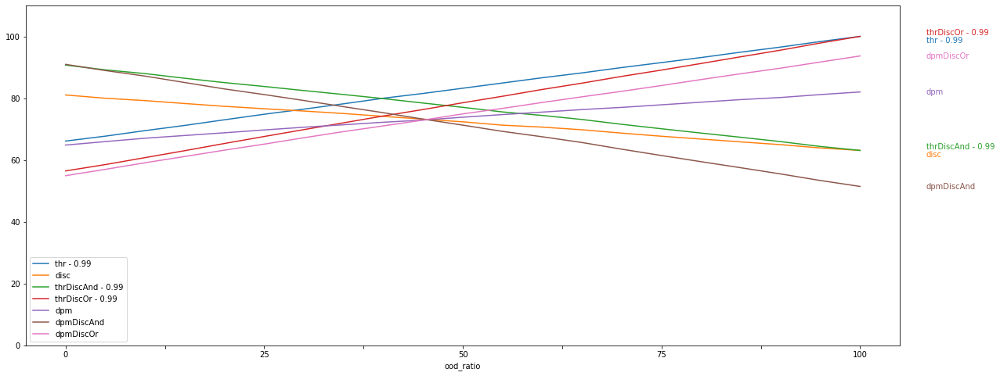

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.14,10.49
1,disc,90.53,5.88
2,thrDiscAnd - 0.99,95.32,2.90
3,thrDiscOr - 0.99,78.35,13.47
4,dpm,82.48,10.85
5,dpmDiscAnd,95.40,2.81
6,dpmDiscOr,77.62,13.92


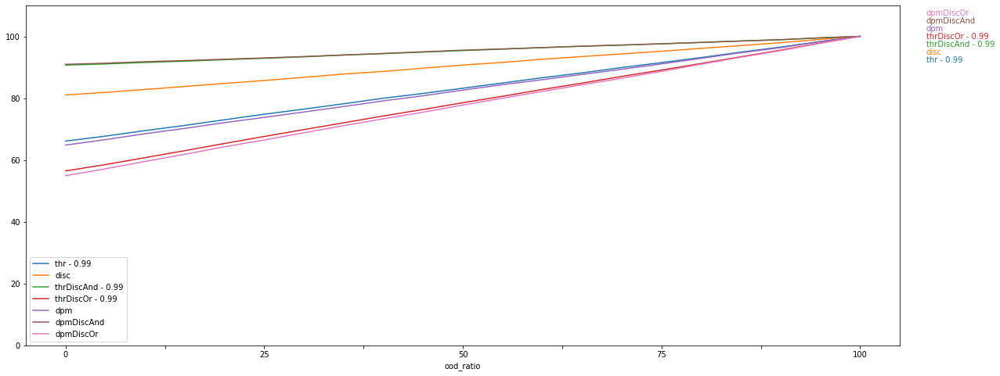

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot macro F1 vs. ratio

In [ ]:
y = 'F1_macro'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,64.90,8.18
1,disc,84.05,3.71
2,thrDiscAnd - 0.99,84.41,12.62
3,thrDiscOr - 0.99,62.85,8.54
4,dpm,66.89,12.33
5,dpmDiscAnd,83.23,16.03
6,dpmDiscOr,66.27,7.76


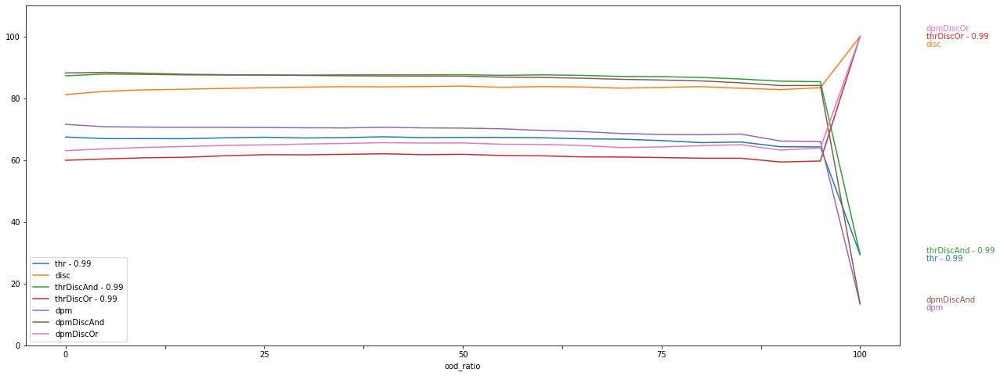

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.72,8.55
1,disc,79.92,13.75
2,thrDiscAnd - 0.99,83.43,15.97
3,thrDiscOr - 0.99,60.38,2.52
4,dpm,66.98,12.02
5,dpmDiscAnd,82.99,16.63
6,dpmDiscOr,63.74,3.26


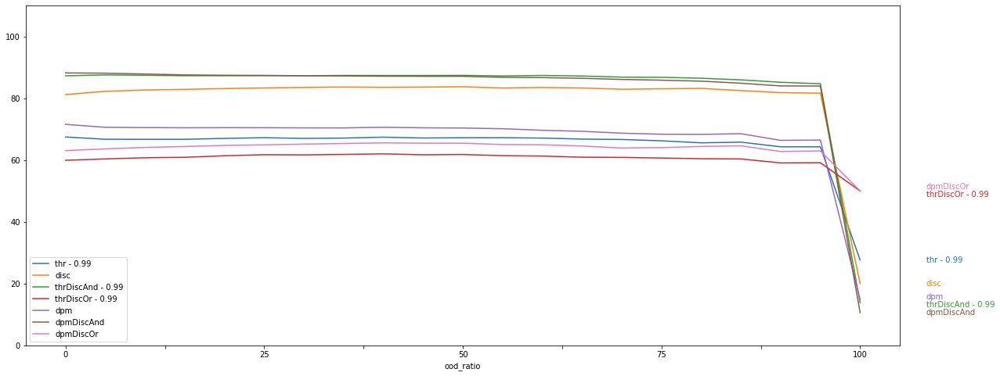

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,64.74,11.68
1,disc,81.64,7.28
2,thrDiscAnd - 0.99,84.32,16.13
3,thrDiscOr - 0.99,62.85,8.54
4,dpm,66.20,13.24
5,dpmDiscAnd,82.58,16.92
6,dpmDiscOr,66.27,7.76


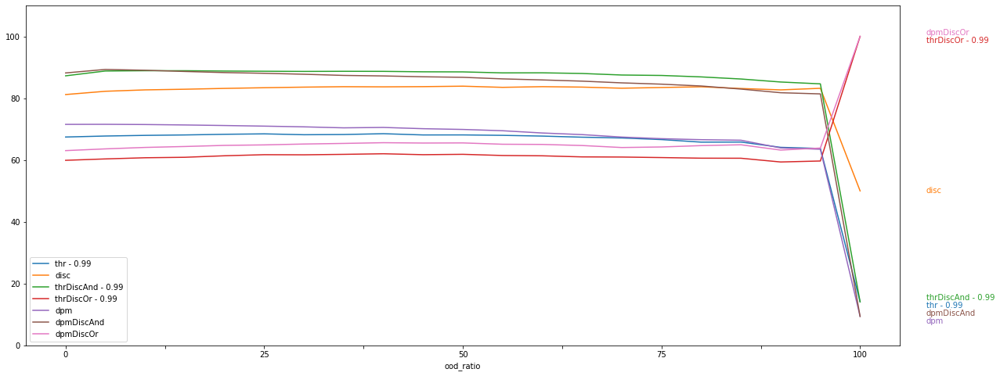

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,65.03,11.80
1,disc,79.76,15.02
2,thrDiscAnd - 0.99,83.59,16.77
3,thrDiscOr - 0.99,62.85,8.54
4,dpm,64.94,13.37
5,dpmDiscAnd,81.17,17.16
6,dpmDiscOr,63.01,6.85


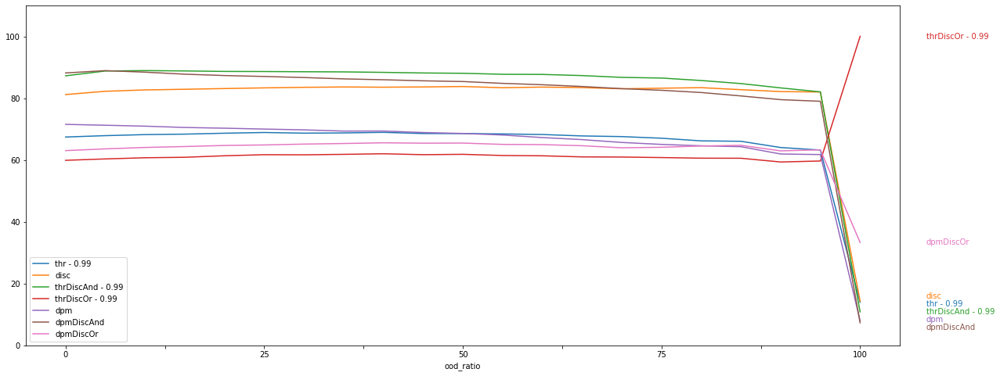

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,70.23,6.87
1,disc,75.80,13.93
2,thrDiscAnd - 0.99,81.52,15.27
3,thrDiscOr - 0.99,62.85,8.54
4,dpm,67.99,10.56
5,dpmDiscAnd,81.67,15.72
6,dpmDiscOr,60.96,8.57


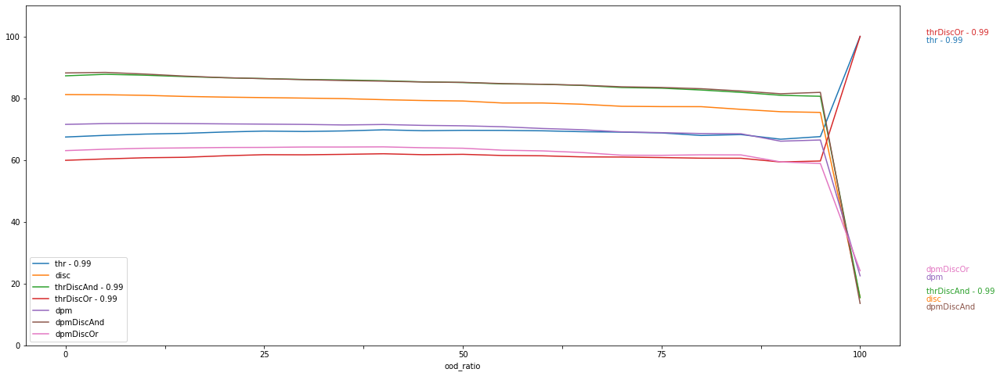

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,70.23,6.87
1,disc,84.05,3.71
2,thrDiscAnd - 0.99,89.99,2.38
3,thrDiscOr - 0.99,62.85,8.54
4,dpm,74.36,5.92
5,dpmDiscAnd,90.85,2.18
6,dpmDiscOr,66.27,7.76


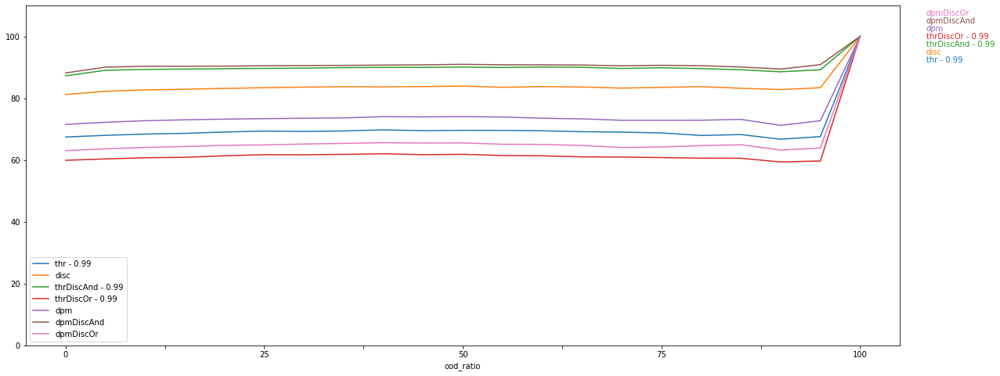

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot weighted F1 vs. ratio

In [ ]:
y = 'F1_weighted'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,76.11,6.44
1,disc,90.77,5.21
2,thrDiscAnd - 0.99,89.70,0.89
3,thrDiscOr - 0.99,77.10,12.18
4,dpm,72.48,4.21
5,dpmDiscAnd,86.01,3.15
6,dpmDiscOr,76.87,12.28


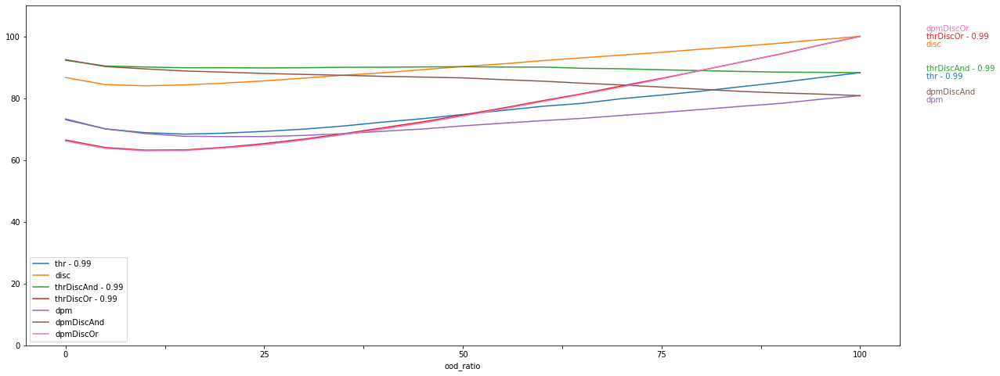

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,73.87,4.77
1,disc,90.71,5.19
2,thrDiscAnd - 0.99,87.33,2.49
3,thrDiscOr - 0.99,77.08,12.17
4,dpm,69.63,2.46
5,dpmDiscAnd,82.96,5.21
6,dpmDiscOr,76.85,12.27


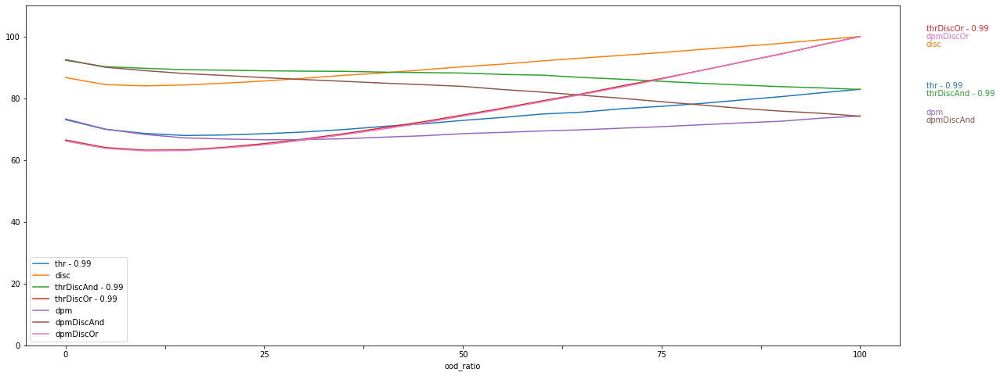

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,80.68,9.64
1,disc,90.76,5.21
2,thrDiscAnd - 0.99,94.41,2.47
3,thrDiscOr - 0.99,77.10,12.18
4,dpm,77.82,8.17
5,dpmDiscAnd,91.57,1.09
6,dpmDiscOr,76.88,12.28


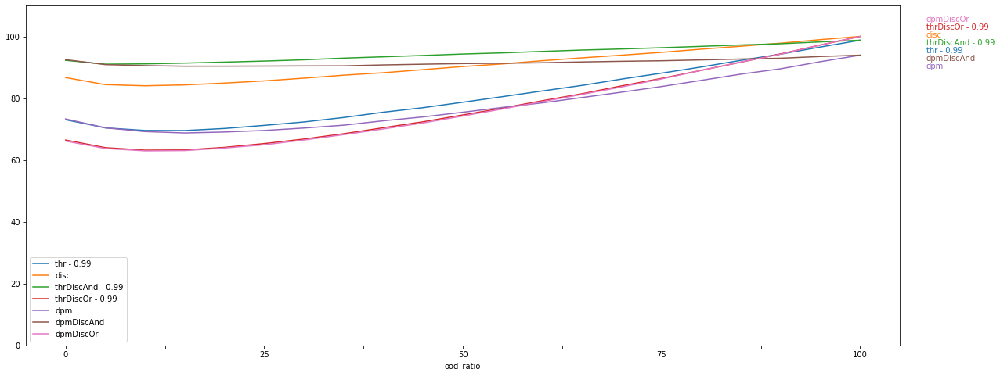

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,80.18,9.29
1,disc,90.71,5.19
2,thrDiscAnd - 0.99,93.70,2.12
3,thrDiscOr - 0.99,77.10,12.18
4,dpm,74.72,6.46
5,dpmDiscAnd,88.30,1.25
6,dpmDiscOr,76.85,12.27


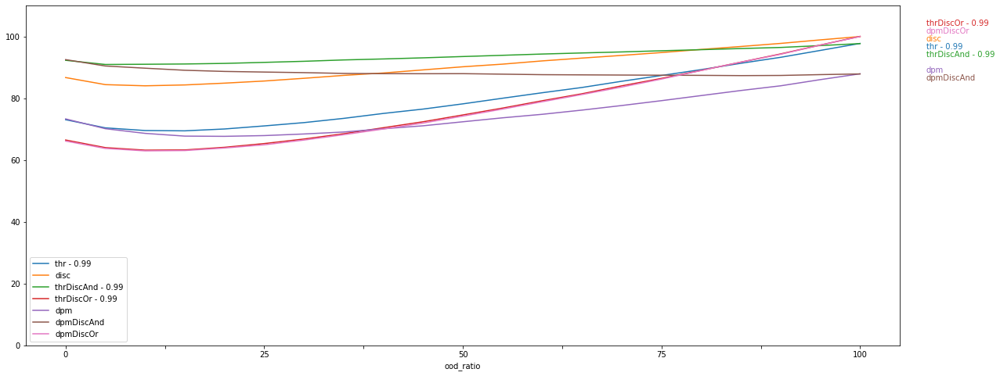

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.44,10.01
1,disc,78.41,2.45
2,thrDiscAnd - 0.99,82.64,4.10
3,thrDiscOr - 0.99,77.10,12.18
4,dpm,76.03,7.02
5,dpmDiscAnd,77.96,7.01
6,dpmDiscOr,74.93,11.25


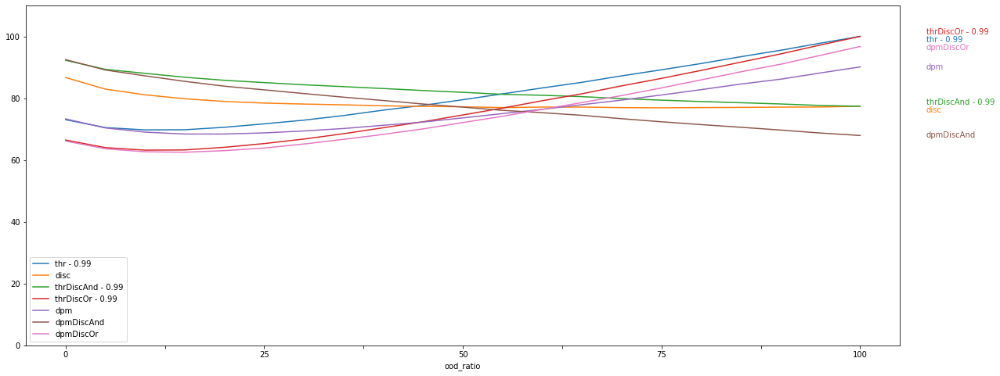

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.44,10.01
1,disc,90.77,5.21
2,thrDiscAnd - 0.99,95.20,2.85
3,thrDiscOr - 0.99,77.10,12.18
4,dpm,81.45,9.93
5,dpmDiscAnd,95.30,2.76
6,dpmDiscOr,76.88,12.28


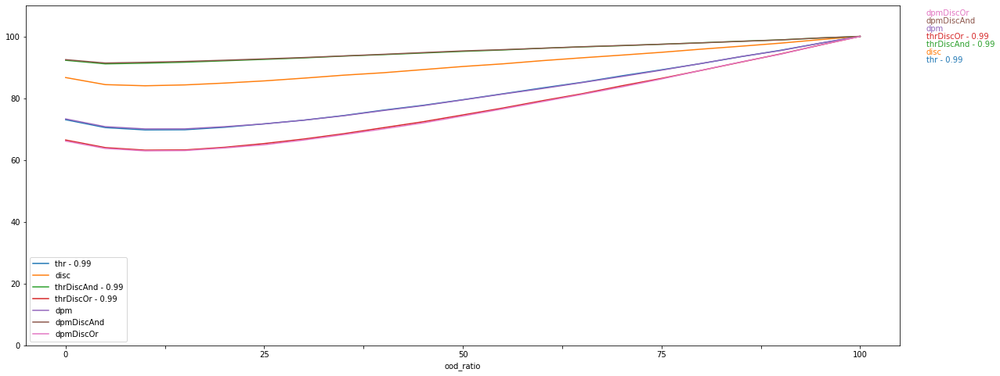

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot Acc vs. ratio (binary)

In [ ]:
y = 'acc_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,73.79,3.98
1,disc,92.96,4.37
2,thrDiscAnd - 0.99,88.29,5.17
3,thrDiscOr - 0.99,78.46,13.40
4,dpm,67.75,1.17
5,dpmDiscAnd,82.94,8.68
6,dpmDiscOr,77.77,13.83


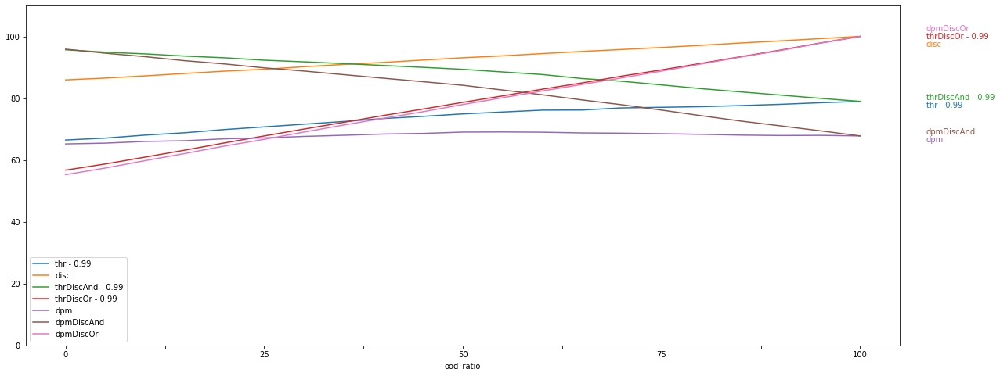

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,70.14,1.72
1,disc,92.89,4.34
2,thrDiscAnd - 0.99,84.59,7.77
3,thrDiscOr - 0.99,78.44,13.39
4,dpm,63.52,2.15
5,dpmDiscAnd,78.67,11.42
6,dpmDiscOr,77.74,13.81


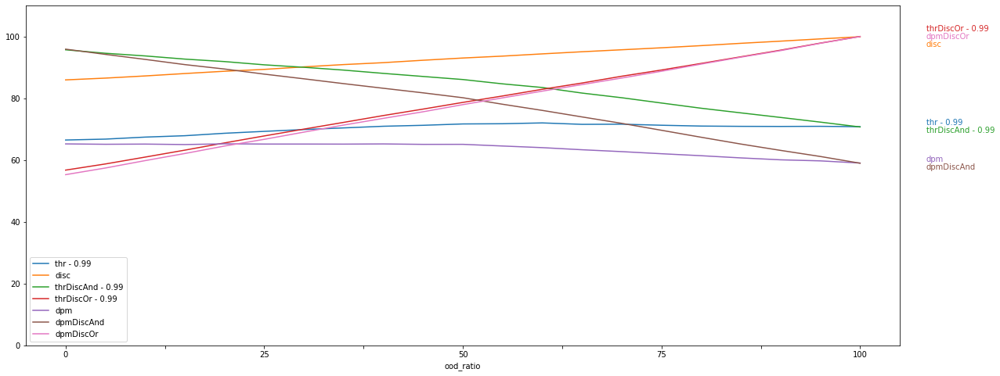

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,82.10,9.65
1,disc,92.95,4.37
2,thrDiscAnd - 0.99,96.59,0.62
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,76.94,7.18
5,dpmDiscAnd,92.12,2.28
6,dpmDiscOr,77.78,13.83


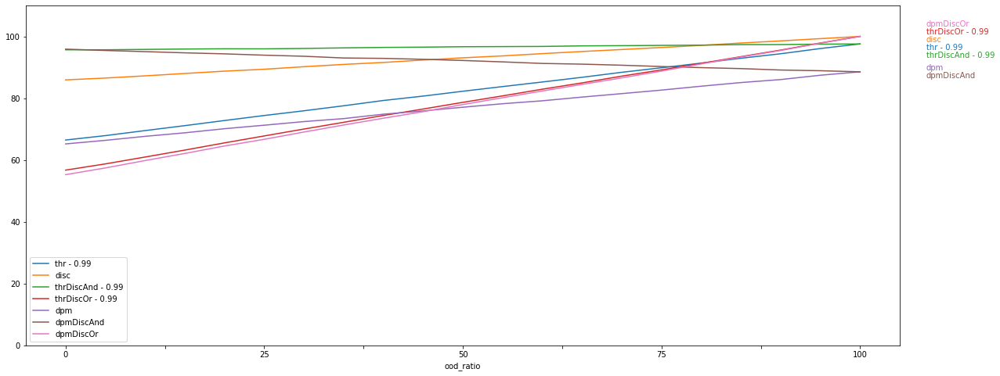

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.15,9.04
1,disc,92.89,4.34
2,thrDiscAnd - 0.99,95.57,0.08
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,71.87,4.06
5,dpmDiscAnd,87.01,5.41
6,dpmDiscOr,77.75,13.81


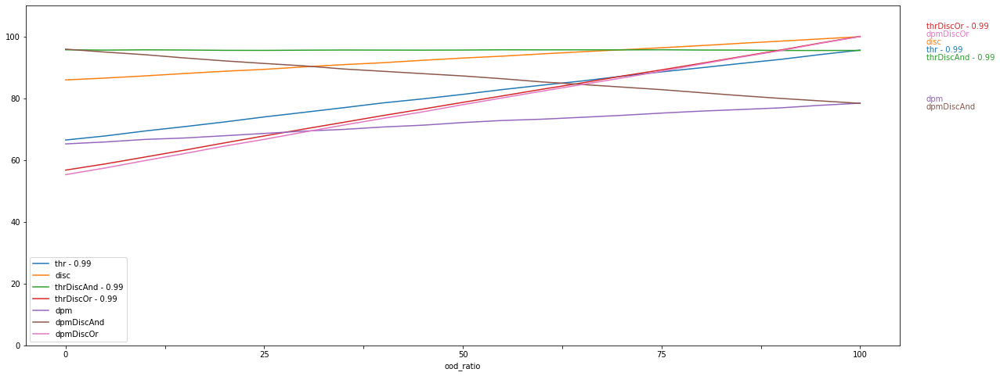

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.30,10.39
1,disc,74.61,7.04
2,thrDiscAnd - 0.99,79.44,10.05
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,73.91,5.09
5,dpmDiscAnd,73.75,13.77
6,dpmDiscOr,74.78,11.81


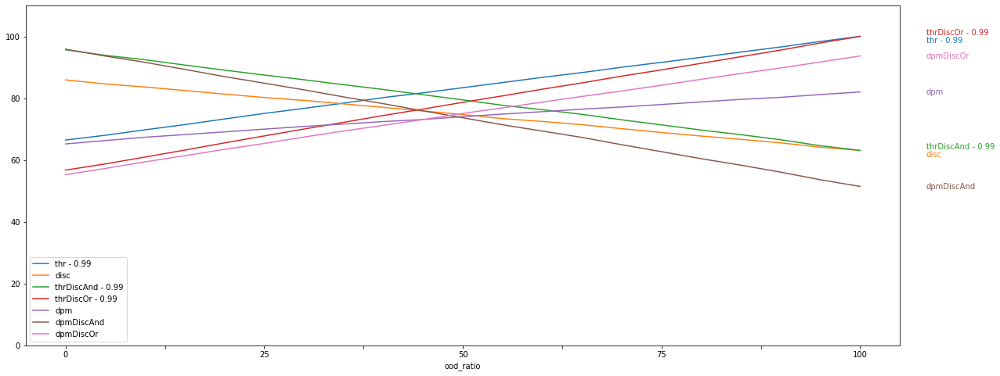

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.30,10.39
1,disc,92.96,4.37
2,thrDiscAnd - 0.99,97.79,1.36
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,82.67,10.74
5,dpmDiscAnd,97.85,1.29
6,dpmDiscOr,77.78,13.83


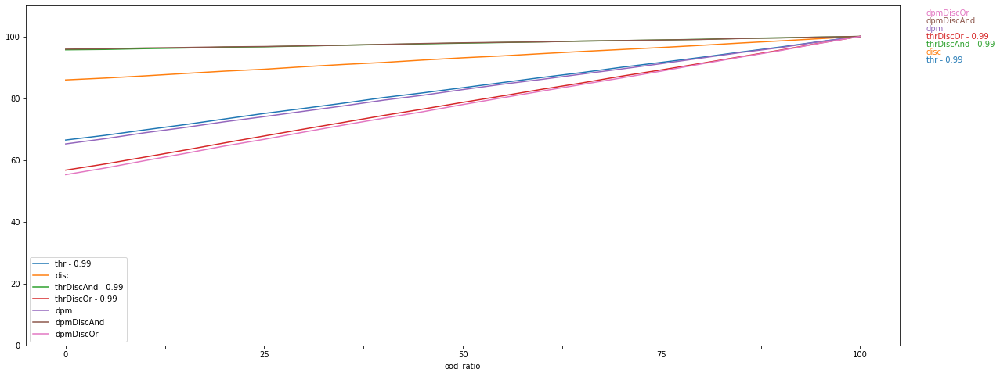

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot balanced Acc vs. ratio (binary)

In [ ]:
y = 'acc_balanced_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,74.00,2.19
1,disc,92.91,2.23
2,thrDiscAnd - 0.99,88.55,2.76
3,thrDiscOr - 0.99,78.36,6.85
4,dpm,67.97,1.14
5,dpmDiscAnd,83.20,4.54
6,dpmDiscOr,77.68,7.08


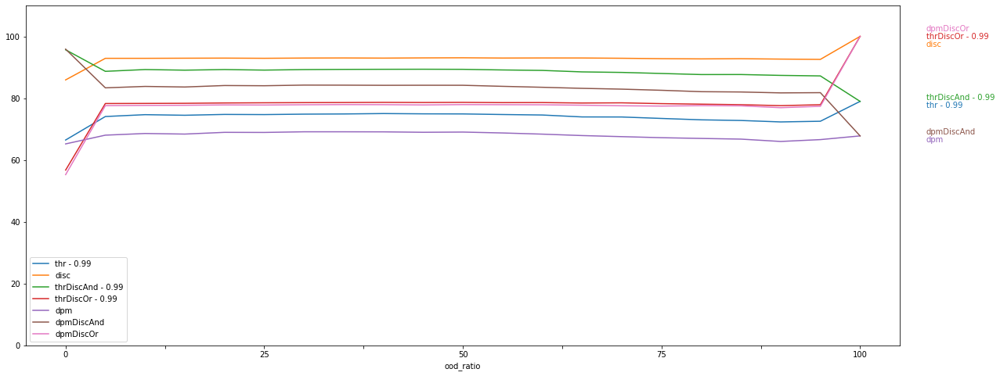

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,70.51,1.51
1,disc,92.84,2.21
2,thrDiscAnd - 0.99,85.01,4.13
3,thrDiscOr - 0.99,78.34,6.84
4,dpm,63.80,1.55
5,dpmDiscAnd,78.98,5.94
6,dpmDiscOr,77.66,7.07


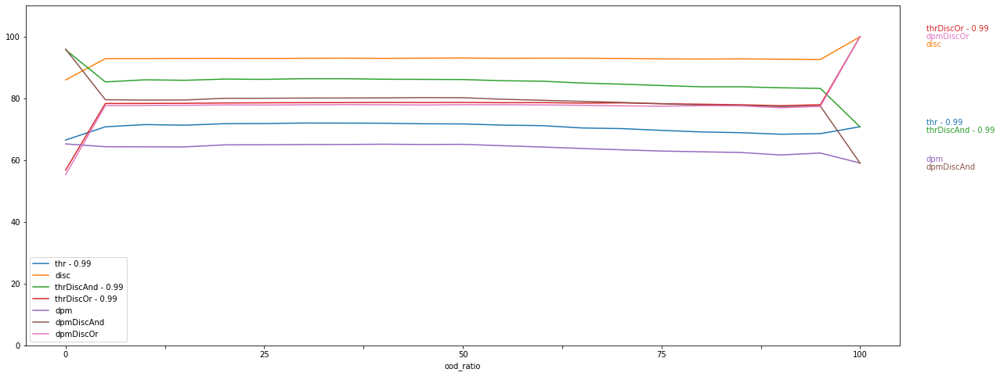

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,82.01,4.92
1,disc,92.90,2.23
2,thrDiscAnd - 0.99,96.56,0.31
3,thrDiscOr - 0.99,78.36,6.85
4,dpm,76.86,3.70
5,dpmDiscAnd,92.09,1.17
6,dpmDiscOr,77.68,7.08


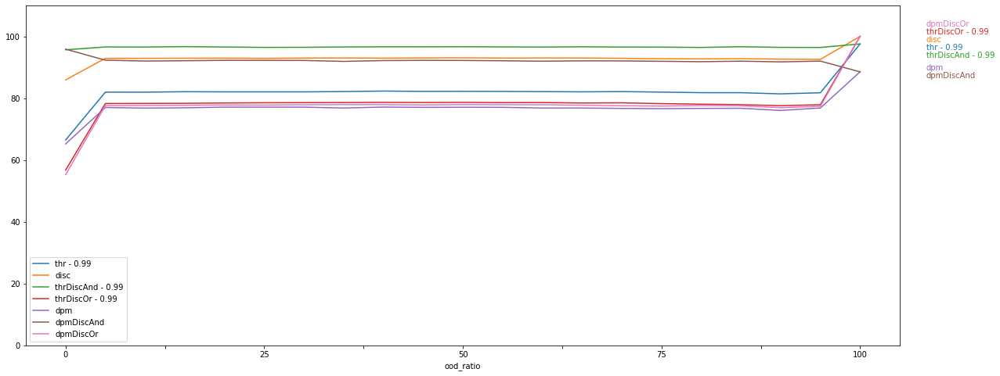

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.07,4.60
1,disc,92.84,2.21
2,thrDiscAnd - 0.99,95.56,0.12
3,thrDiscOr - 0.99,78.36,6.85
4,dpm,71.74,2.10
5,dpmDiscAnd,86.94,2.78
6,dpmDiscOr,77.65,7.07


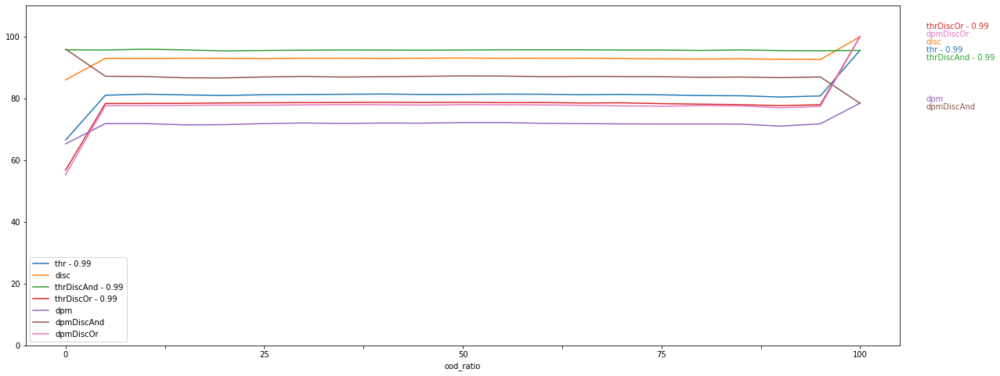

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.22,5.31
1,disc,74.57,3.62
2,thrDiscAnd - 0.99,79.43,5.15
3,thrDiscOr - 0.99,78.36,6.85
4,dpm,74.11,2.77
5,dpmDiscAnd,73.83,7.03
6,dpmDiscOr,74.85,6.09


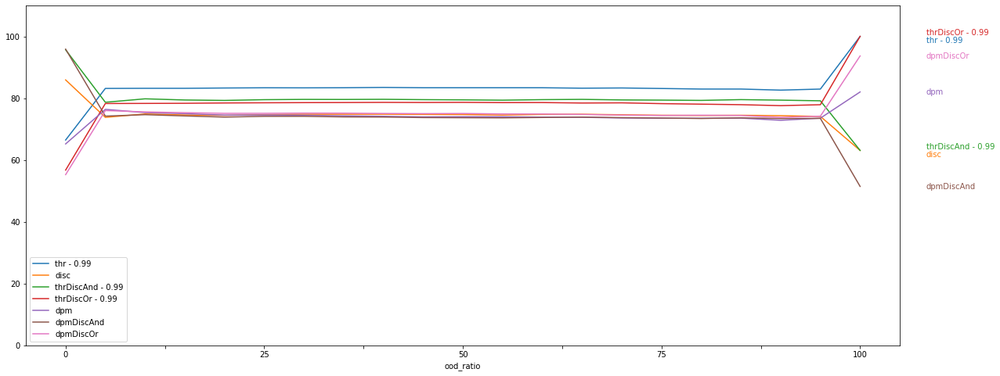

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.22,5.31
1,disc,92.91,2.23
2,thrDiscAnd - 0.99,97.77,0.69
3,thrDiscOr - 0.99,78.36,6.85
4,dpm,82.57,5.51
5,dpmDiscAnd,97.80,0.66
6,dpmDiscOr,77.68,7.08


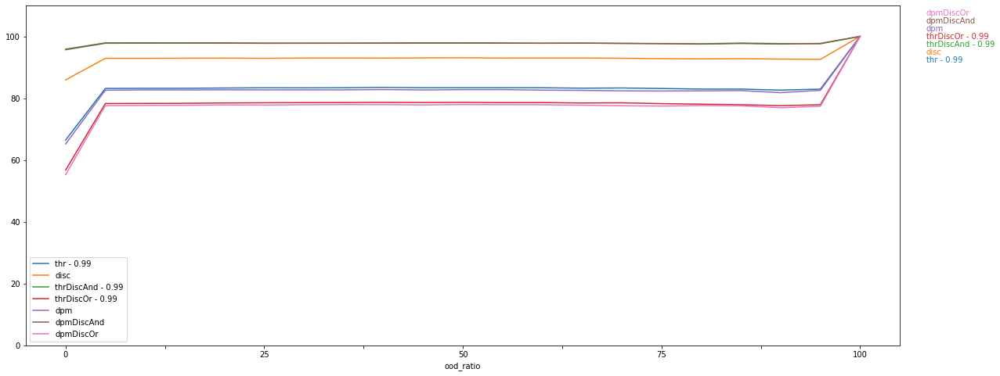

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot macro Precision vs. ratio (binary)

In [ ]:
y = 'P_macro_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,66.52,8.48
1,disc,88.74,13.23
2,thrDiscAnd - 0.99,79.79,13.25
3,thrDiscOr - 0.99,81.53,15.00
4,dpm,61.90,6.36
5,dpmDiscAnd,76.54,12.72
6,dpmDiscOr,81.29,15.04


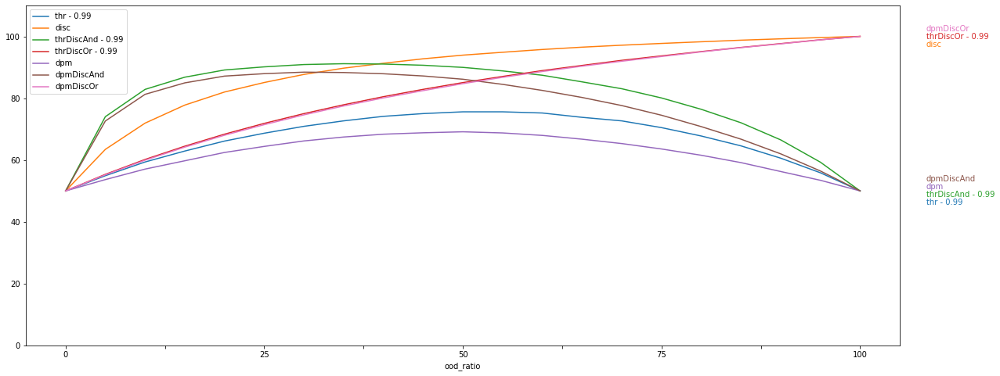

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,63.73,7.28
1,disc,86.18,15.30
2,thrDiscAnd - 0.99,77.48,12.98
3,thrDiscOr - 0.99,79.07,15.79
4,dpm,59.11,5.02
5,dpmDiscAnd,74.31,12.19
6,dpmDiscOr,78.80,15.75


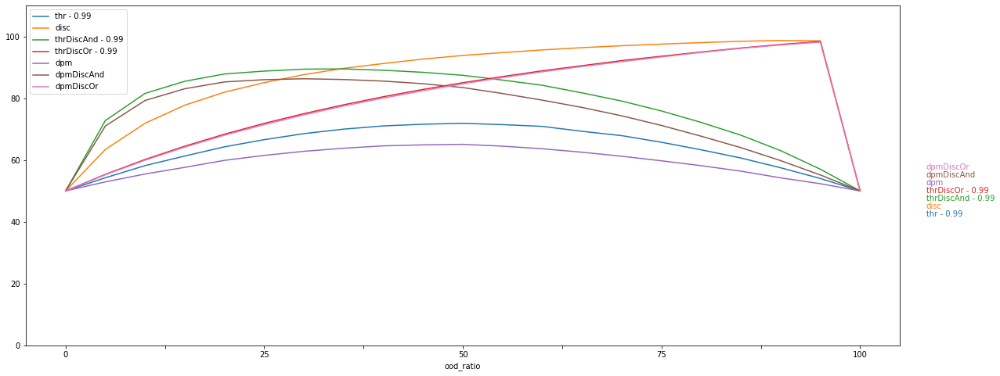

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,77.36,13.21
1,disc,86.35,15.39
2,thrDiscAnd - 0.99,88.60,13.84
3,thrDiscOr - 0.99,81.54,15.00
4,dpm,69.67,9.60
5,dpmDiscAnd,82.88,13.24
6,dpmDiscOr,81.30,15.03


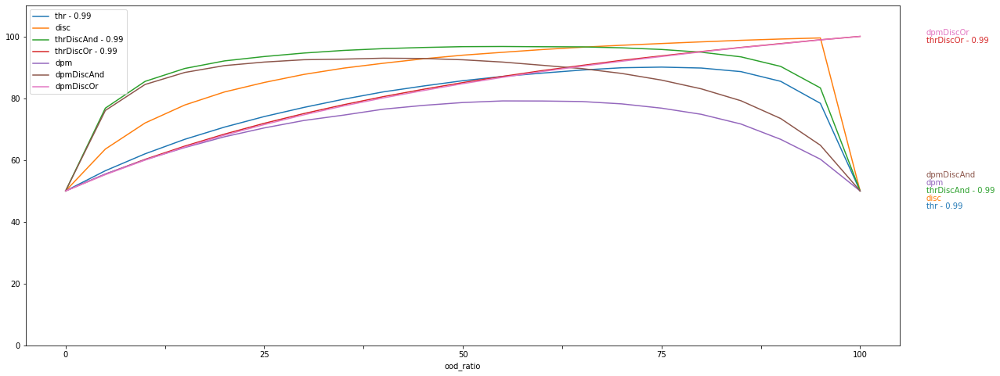

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,75.31,12.16
1,disc,86.19,15.28
2,thrDiscAnd - 0.99,86.91,13.60
3,thrDiscOr - 0.99,81.54,15.00
4,dpm,64.68,7.44
5,dpmDiscAnd,78.82,12.80
6,dpmDiscOr,78.80,15.74


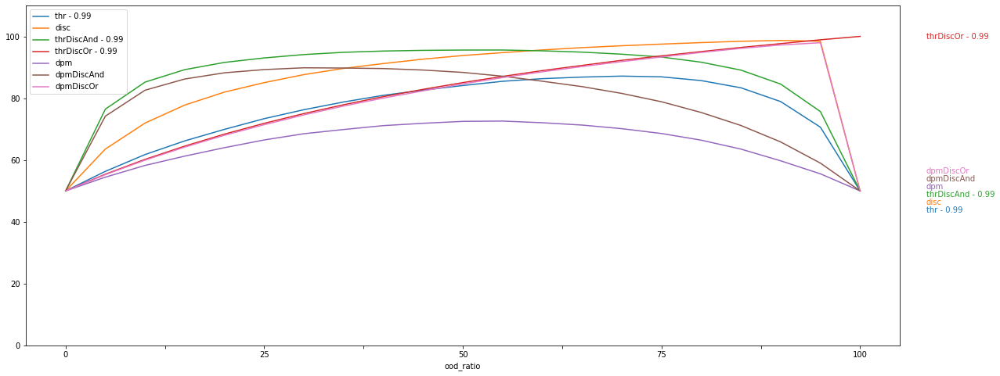

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.36,14.67
1,disc,67.62,8.79
2,thrDiscAnd - 0.99,74.35,11.89
3,thrDiscOr - 0.99,81.54,15.00
4,dpm,66.59,8.18
5,dpmDiscAnd,71.70,11.11
6,dpmDiscOr,70.87,10.41


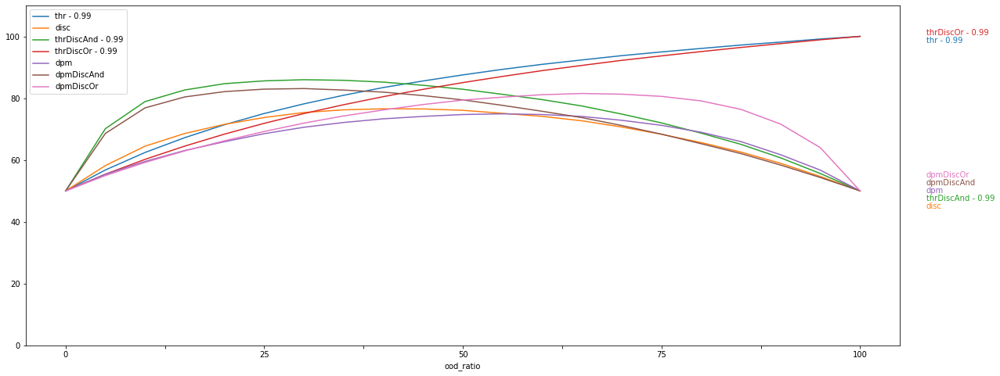

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.36,14.67
1,disc,88.75,13.21
2,thrDiscAnd - 0.99,93.62,11.46
3,thrDiscOr - 0.99,81.54,15.00
4,dpm,83.09,14.70
5,dpmDiscAnd,93.73,11.39
6,dpmDiscOr,81.30,15.03


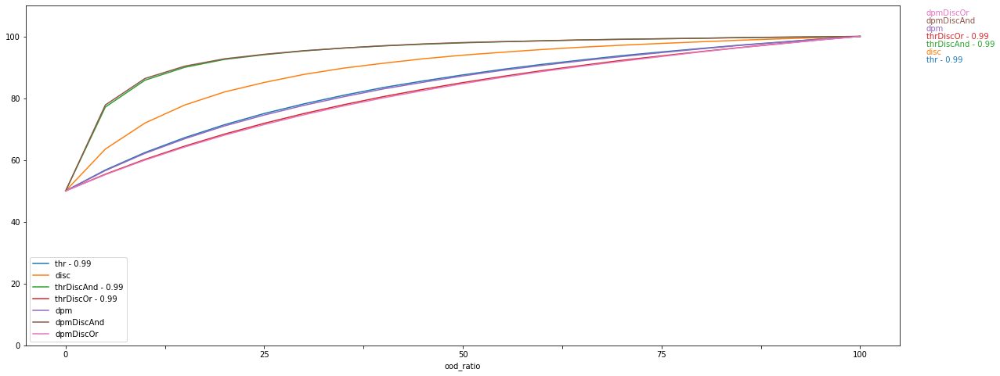

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot weighted Precision vs. ratio (binary)

In [ ]:
y = 'P_weighted_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,83.31,8.10
1,disc,95.50,2.52
2,thrDiscAnd - 0.99,92.37,3.40
3,thrDiscOr - 0.99,90.15,5.25
4,dpm,79.50,10.33
5,dpmDiscAnd,90.01,4.66
6,dpmDiscOr,89.96,5.36


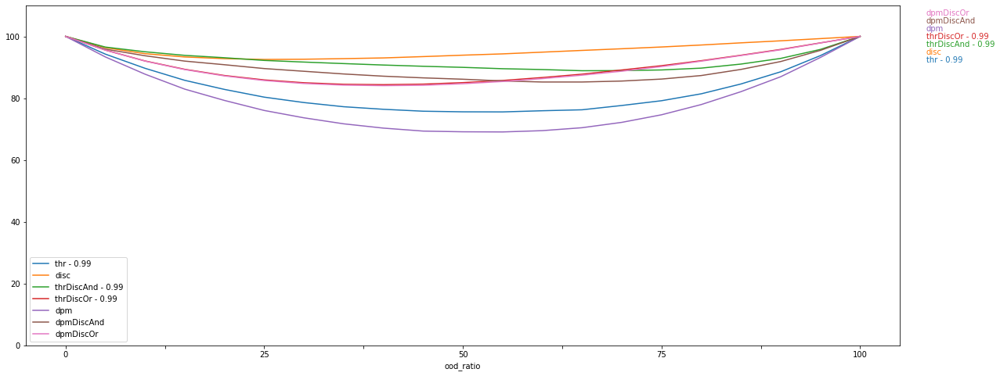

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.10,9.38
1,disc,95.43,2.53
2,thrDiscAnd - 0.99,90.79,4.26
3,thrDiscOr - 0.99,90.13,5.25
4,dpm,77.04,11.75
5,dpmDiscAnd,88.34,5.54
6,dpmDiscOr,89.92,5.36


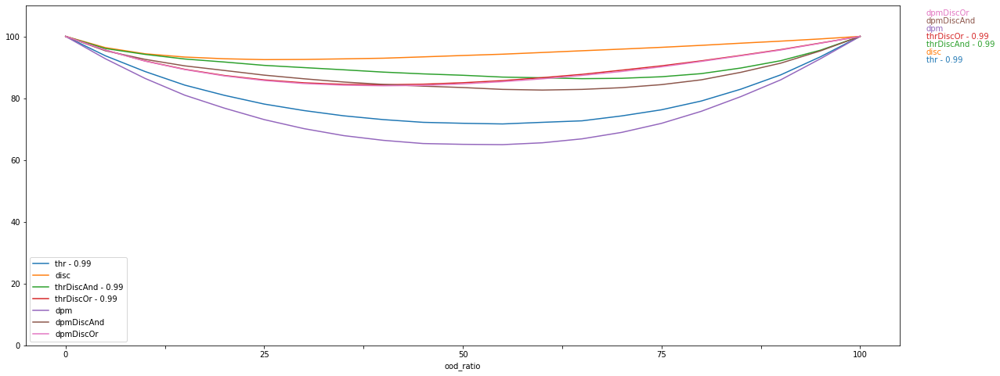

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,90.07,4.78
1,disc,95.49,2.52
2,thrDiscAnd - 0.99,97.20,1.05
3,thrDiscOr - 0.99,90.15,5.25
4,dpm,85.40,7.00
5,dpmDiscAnd,94.15,2.46
6,dpmDiscOr,89.96,5.36


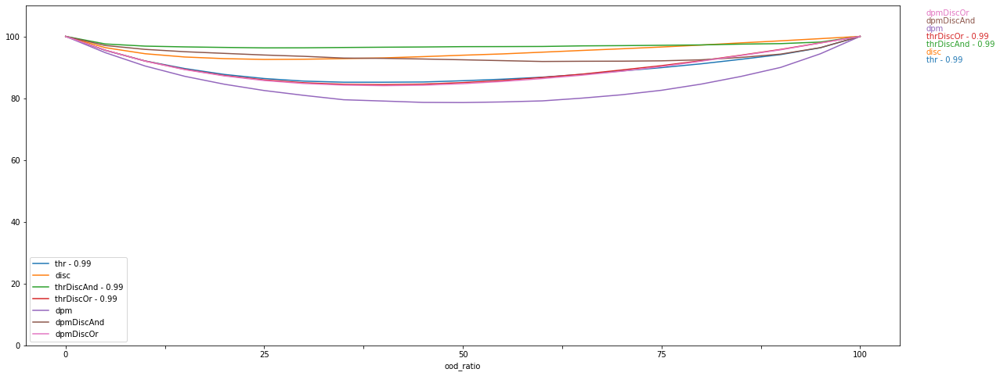

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,89.02,5.15
1,disc,95.42,2.53
2,thrDiscAnd - 0.99,96.42,1.31
3,thrDiscOr - 0.99,90.15,5.25
4,dpm,81.66,9.13
5,dpmDiscAnd,91.49,3.85
6,dpmDiscOr,89.90,5.37


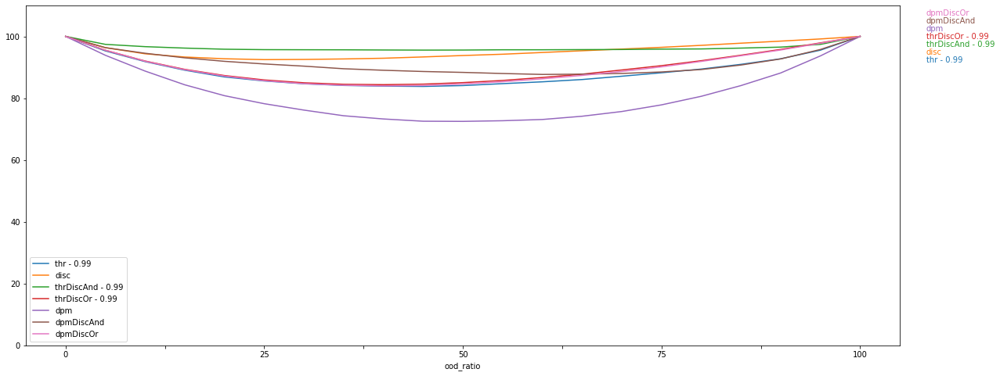

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,91.64,4.50
1,disc,83.91,7.84
2,thrDiscAnd - 0.99,88.31,5.56
3,thrDiscOr - 0.99,90.15,5.25
4,dpm,83.22,8.34
5,dpmDiscAnd,86.24,6.73
6,dpmDiscOr,86.01,6.75


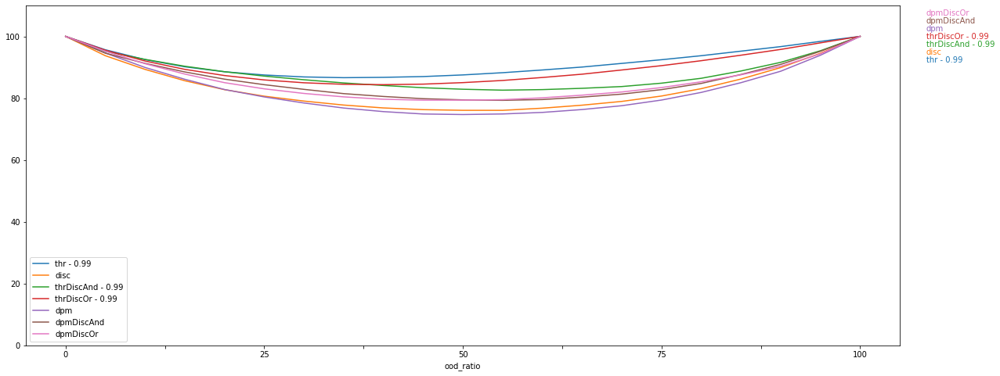

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,91.64,4.50
1,disc,95.50,2.52
2,thrDiscAnd - 0.99,98.28,1.04
3,thrDiscOr - 0.99,90.15,5.25
4,dpm,91.41,4.61
5,dpmDiscAnd,98.30,1.00
6,dpmDiscOr,89.96,5.36


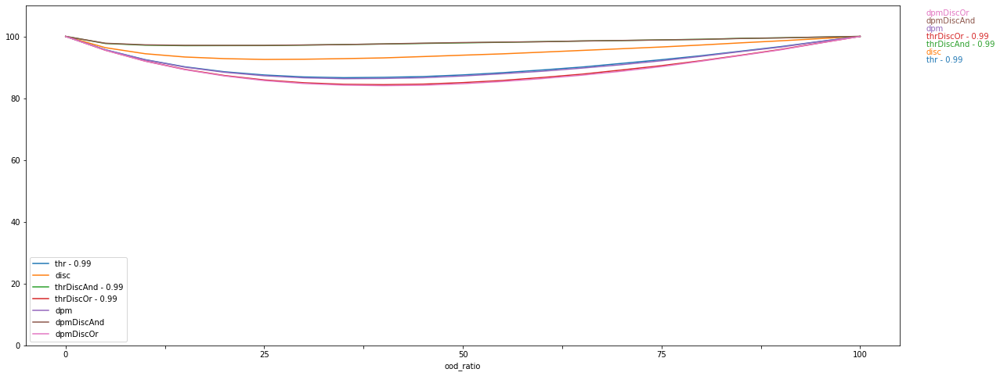

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot macro Recall vs. ratio (binary)

In [ ]:
y = 'R_macro_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,70.54,11.44
1,disc,90.86,11.09
2,thrDiscAnd - 0.99,84.39,13.63
3,thrDiscOr - 0.99,77.01,12.10
4,dpm,64.81,10.53
5,dpmDiscAnd,79.31,12.98
6,dpmDiscOr,76.36,12.18


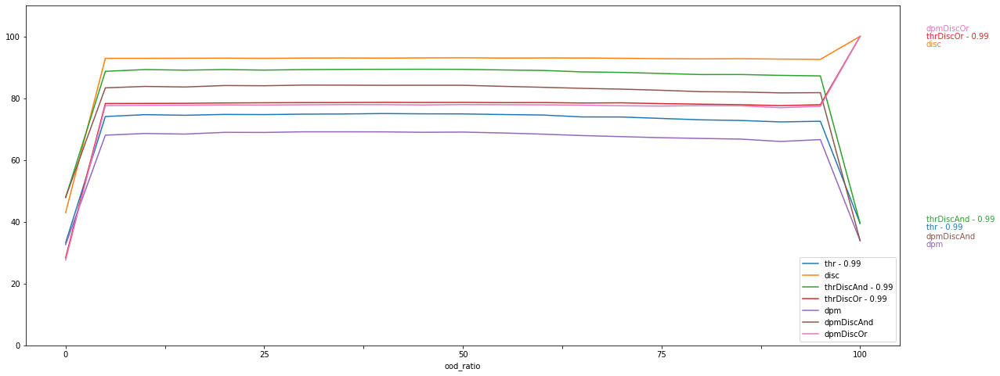

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,67.24,11.02
1,disc,88.41,13.99
2,thrDiscAnd - 0.99,81.05,13.31
3,thrDiscOr - 0.99,74.61,12.27
4,dpm,60.84,9.97
5,dpmDiscAnd,75.29,12.54
6,dpmDiscOr,73.96,12.21


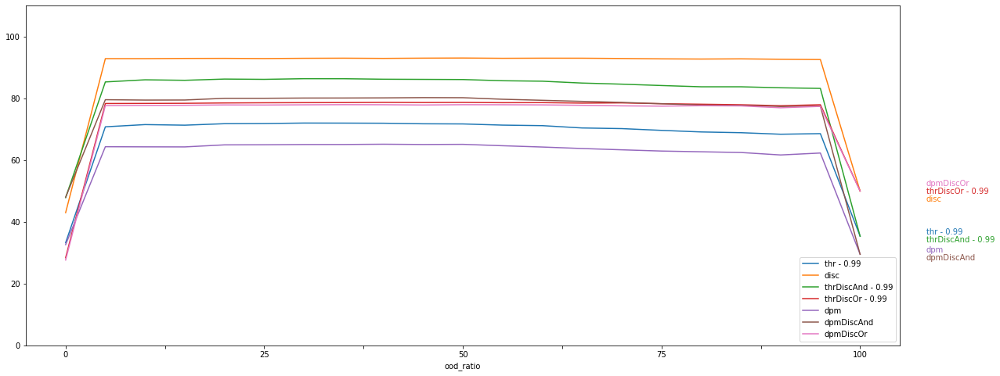

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,78.11,12.58
1,disc,88.48,14.01
2,thrDiscAnd - 0.99,91.96,14.52
3,thrDiscOr - 0.99,77.01,12.10
4,dpm,73.20,11.70
5,dpmDiscAnd,87.70,13.84
6,dpmDiscOr,76.36,12.18


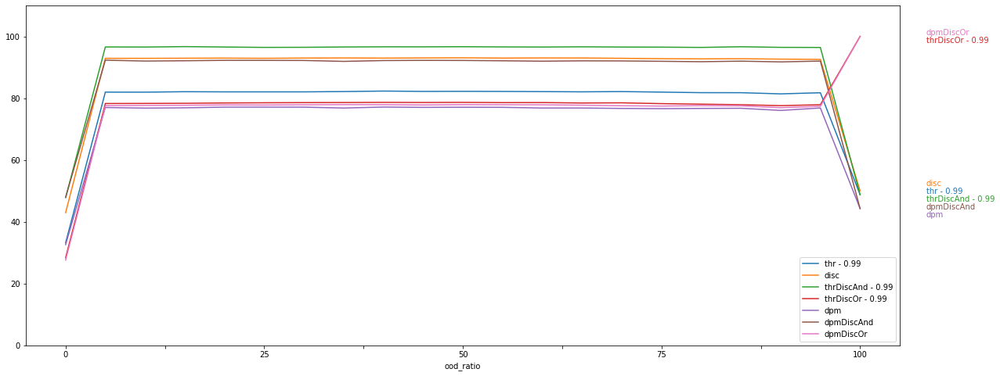

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,77.21,12.42
1,disc,88.42,14.00
2,thrDiscAnd - 0.99,91.01,14.37
3,thrDiscOr - 0.99,77.01,12.10
4,dpm,68.33,10.83
5,dpmDiscAnd,82.79,13.12
6,dpmDiscOr,73.95,12.21


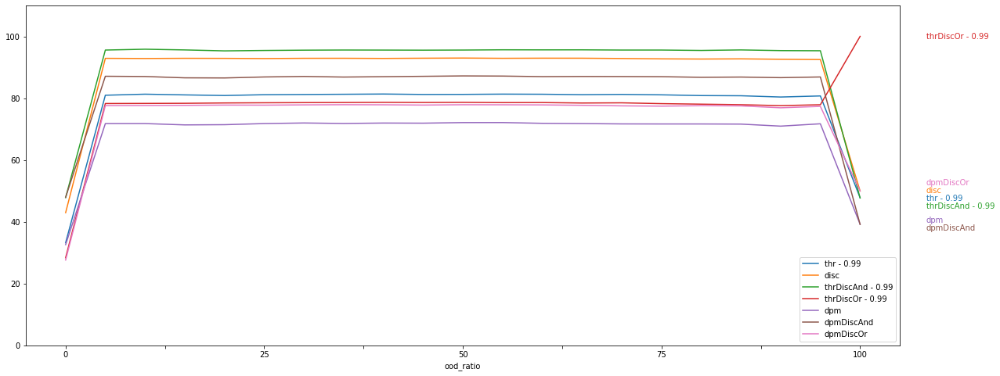

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.64,11.68
1,disc,71.02,11.37
2,thrDiscAnd - 0.99,75.65,12.23
3,thrDiscOr - 0.99,77.01,12.10
4,dpm,70.60,11.34
5,dpmDiscAnd,70.32,11.68
6,dpmDiscOr,71.30,11.74


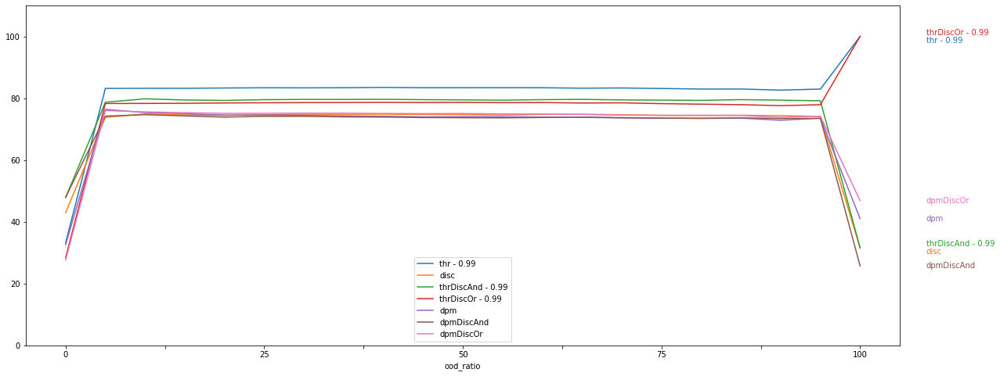

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.64,11.68
1,disc,90.86,11.09
2,thrDiscAnd - 0.99,95.49,10.93
3,thrDiscOr - 0.99,77.01,12.10
4,dpm,81.02,11.73
5,dpmDiscAnd,95.52,10.91
6,dpmDiscOr,76.36,12.18


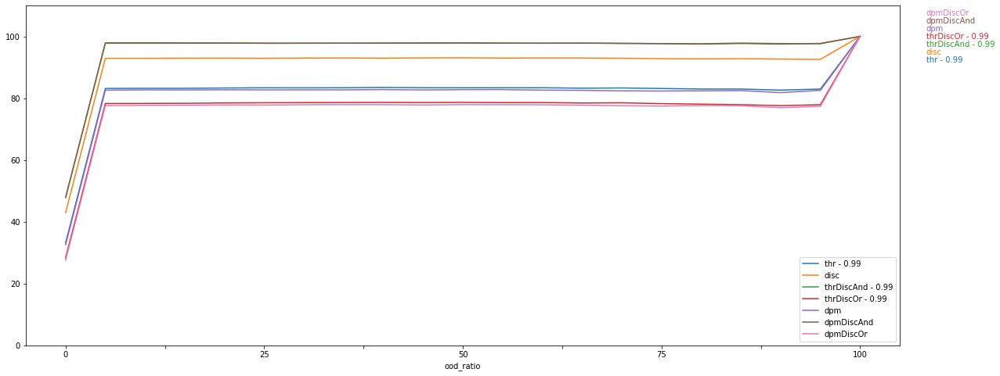

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot weighted Recall vs. ratio (binary)

In [ ]:
y = 'R_weighted_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,73.79,3.98
1,disc,92.96,4.37
2,thrDiscAnd - 0.99,88.29,5.17
3,thrDiscOr - 0.99,78.46,13.40
4,dpm,67.75,1.17
5,dpmDiscAnd,82.94,8.68
6,dpmDiscOr,77.77,13.83


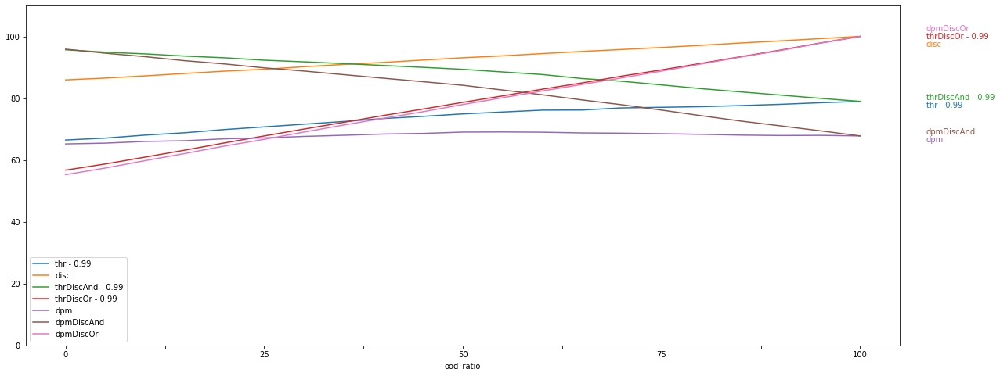

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,70.14,1.72
1,disc,92.89,4.34
2,thrDiscAnd - 0.99,84.59,7.77
3,thrDiscOr - 0.99,78.44,13.39
4,dpm,63.52,2.15
5,dpmDiscAnd,78.67,11.42
6,dpmDiscOr,77.74,13.81


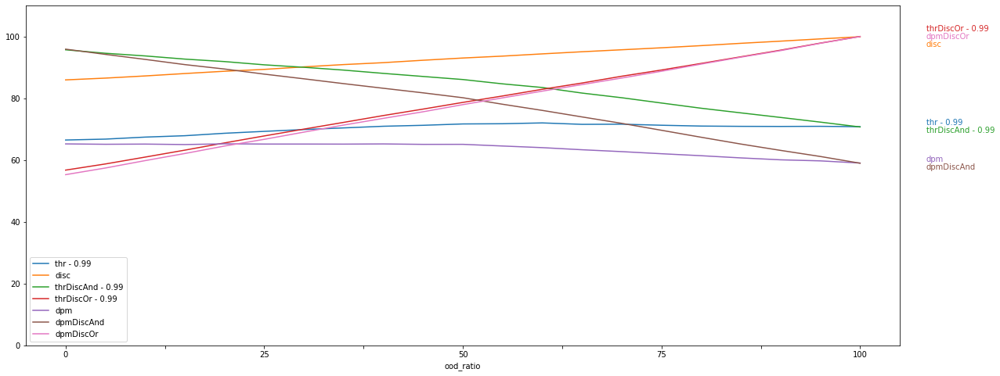

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,82.10,9.65
1,disc,92.95,4.37
2,thrDiscAnd - 0.99,96.59,0.62
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,76.94,7.18
5,dpmDiscAnd,92.12,2.28
6,dpmDiscOr,77.78,13.83


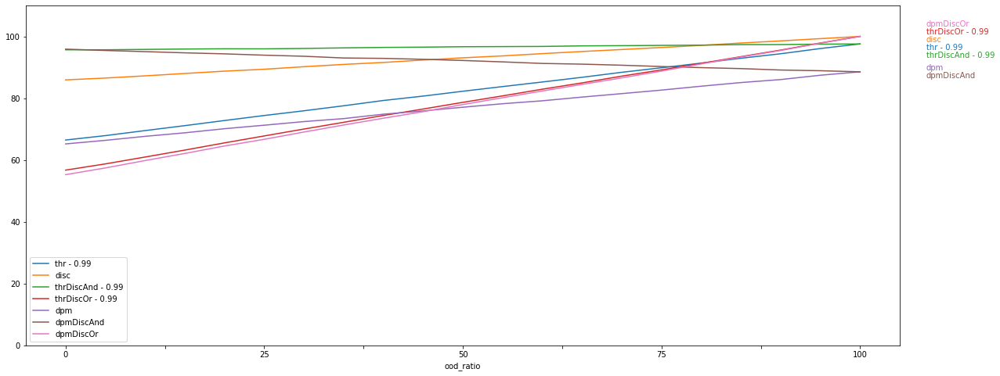

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,81.15,9.04
1,disc,92.89,4.34
2,thrDiscAnd - 0.99,95.57,0.08
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,71.87,4.06
5,dpmDiscAnd,87.01,5.41
6,dpmDiscOr,77.75,13.81


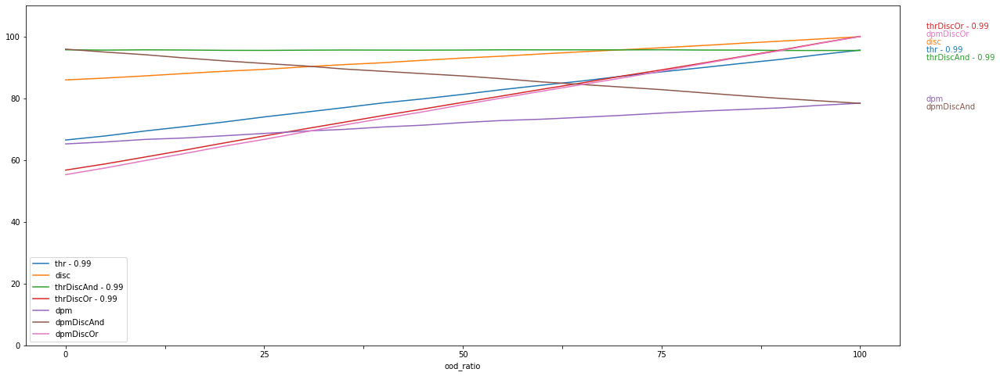

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.30,10.39
1,disc,74.61,7.04
2,thrDiscAnd - 0.99,79.44,10.05
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,73.91,5.09
5,dpmDiscAnd,73.75,13.77
6,dpmDiscOr,74.78,11.81


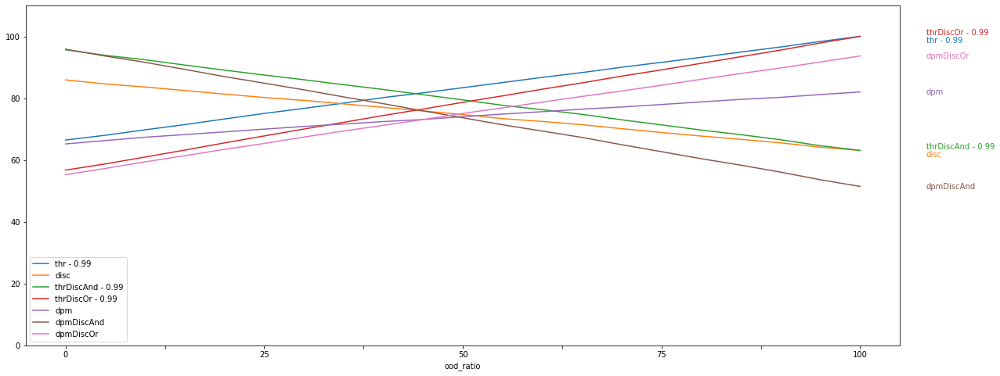

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.30,10.39
1,disc,92.96,4.37
2,thrDiscAnd - 0.99,97.79,1.36
3,thrDiscOr - 0.99,78.47,13.40
4,dpm,82.67,10.74
5,dpmDiscAnd,97.85,1.29
6,dpmDiscOr,77.78,13.83


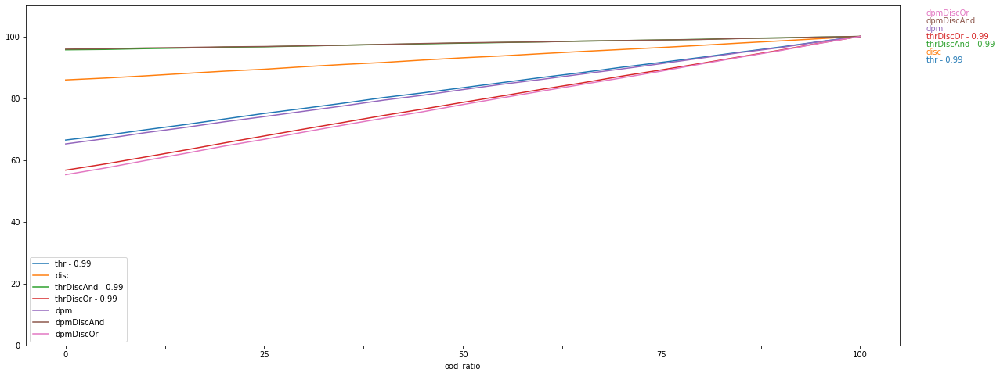

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot macro F1 vs. ratio (binary)

In [ ]:
y = 'F1_macro_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,65.22,10.55
1,disc,88.34,12.21
2,thrDiscAnd - 0.99,80.20,13.69
3,thrDiscOr - 0.99,73.11,14.90
4,dpm,59.85,9.33
5,dpmDiscAnd,74.85,13.65
6,dpmDiscOr,72.39,15.02


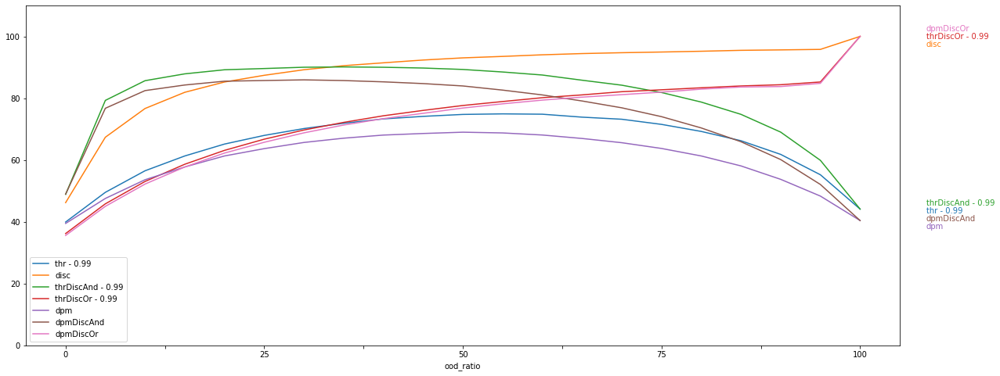

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,62.04,9.92
1,disc,85.86,14.43
2,thrDiscAnd - 0.99,76.56,13.84
3,thrDiscOr - 0.99,70.71,14.36
4,dpm,56.21,8.70
5,dpmDiscAnd,70.62,13.64
6,dpmDiscOr,69.97,14.34


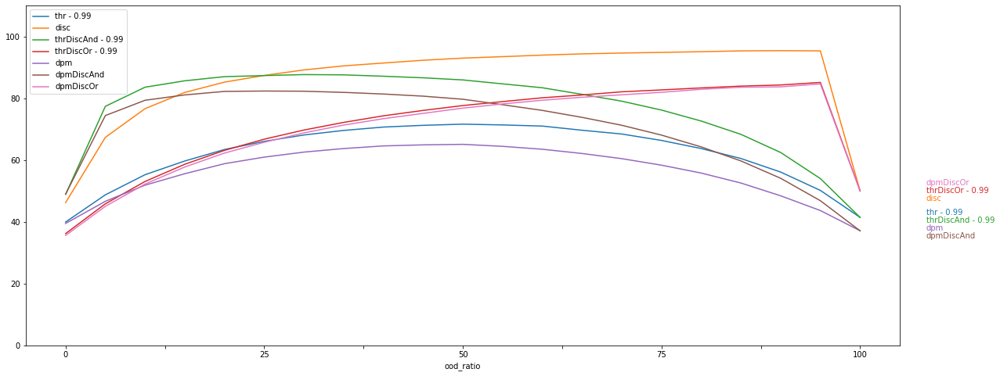

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,74.02,13.42
1,disc,85.96,14.47
2,thrDiscAnd - 0.99,89.95,13.96
3,thrDiscOr - 0.99,73.12,14.89
4,dpm,68.13,11.23
5,dpmDiscAnd,84.24,13.34
6,dpmDiscOr,72.40,15.01


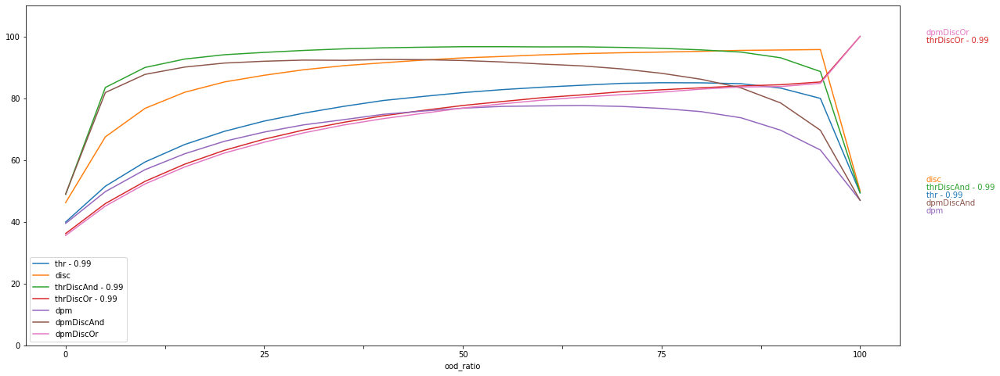

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,72.76,12.83
1,disc,85.87,14.42
2,thrDiscAnd - 0.99,88.49,13.72
3,thrDiscOr - 0.99,73.12,14.89
4,dpm,63.29,9.80
5,dpmDiscAnd,78.72,13.09
6,dpmDiscOr,69.97,14.33


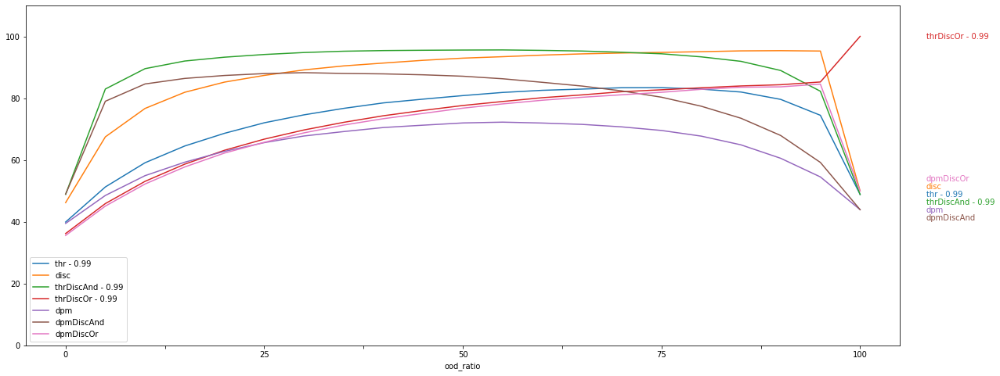

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,78.20,14.11
1,disc,65.88,10.83
2,thrDiscAnd - 0.99,71.06,12.81
3,thrDiscOr - 0.99,73.12,14.89
4,dpm,65.26,10.26
5,dpmDiscAnd,65.28,12.79
6,dpmDiscOr,66.14,12.07


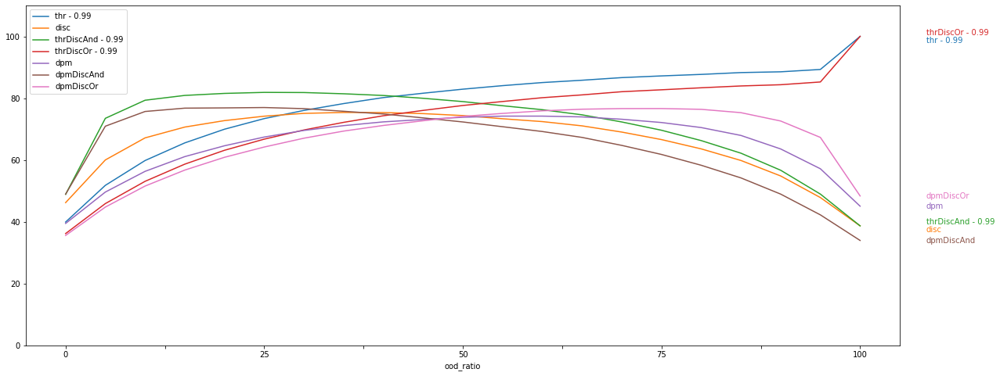

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,78.20,14.11
1,disc,88.35,12.19
2,thrDiscAnd - 0.99,94.25,10.99
3,thrDiscOr - 0.99,73.12,14.89
4,dpm,77.53,14.18
5,dpmDiscAnd,94.34,10.94
6,dpmDiscOr,72.40,15.01


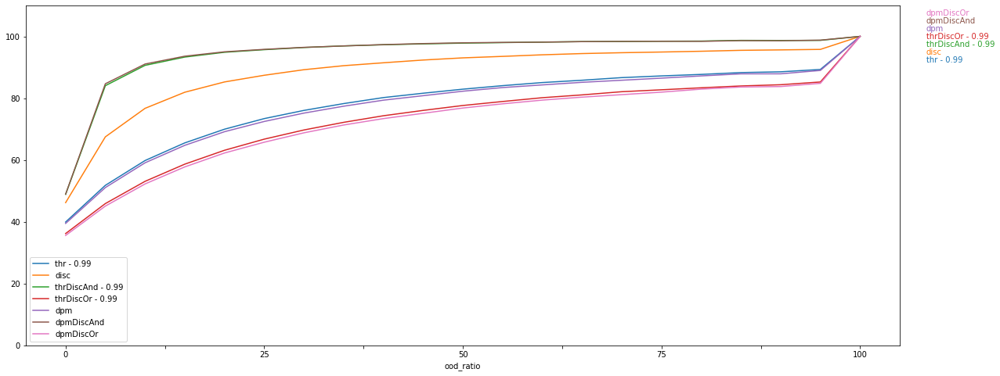

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot weighted F1 vs. ratio (binary)

In [ ]:
y = 'F1_weighted_bin'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,76.83,4.14
1,disc,93.64,3.50
2,thrDiscAnd - 0.99,89.55,3.96
3,thrDiscOr - 0.99,80.10,10.45
4,dpm,71.66,3.61
5,dpmDiscAnd,84.73,6.60
6,dpmDiscOr,79.39,10.81


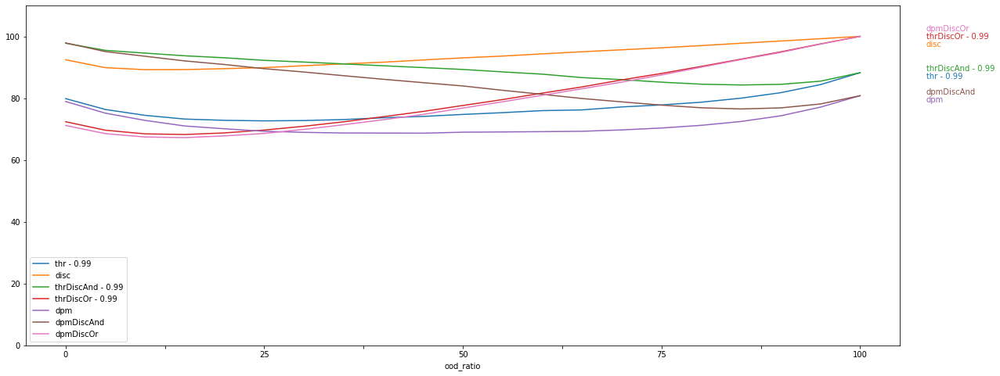

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,73.77,3.33
1,disc,93.58,3.48
2,thrDiscAnd - 0.99,86.28,5.87
3,thrDiscOr - 0.99,80.08,10.44
4,dpm,67.93,4.13
5,dpmDiscAnd,80.70,8.77
6,dpmDiscOr,79.37,10.80


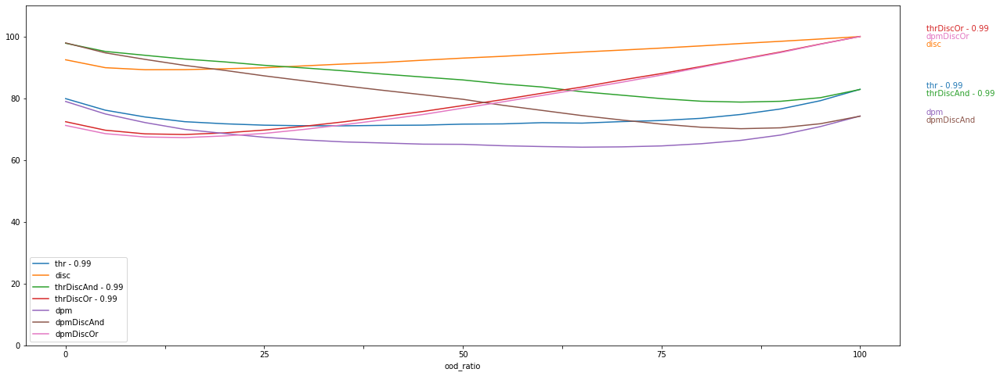

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,83.77,7.46
1,disc,93.64,3.50
2,thrDiscAnd - 0.99,96.82,0.71
3,thrDiscOr - 0.99,80.10,10.45
4,dpm,79.30,6.06
5,dpmDiscAnd,92.82,2.05
6,dpmDiscOr,79.39,10.82


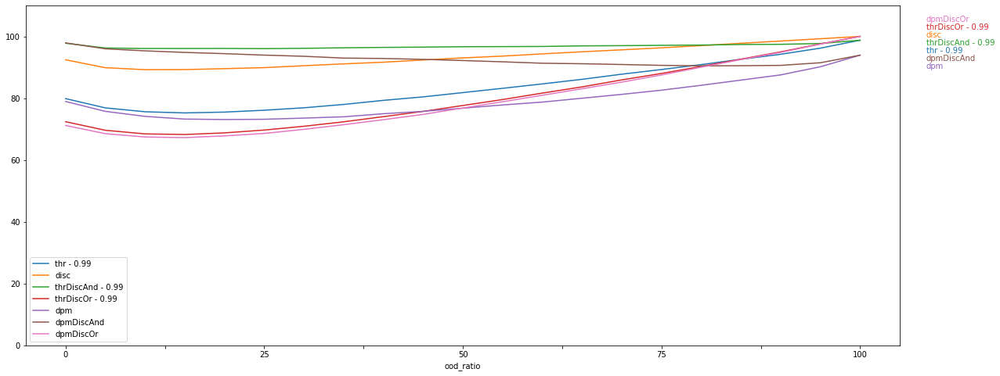

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,82.94,7.05
1,disc,93.58,3.48
2,thrDiscAnd - 0.99,95.90,0.63
3,thrDiscOr - 0.99,80.10,10.45
4,dpm,75.07,4.76
5,dpmDiscAnd,88.30,4.32
6,dpmDiscOr,79.36,10.80


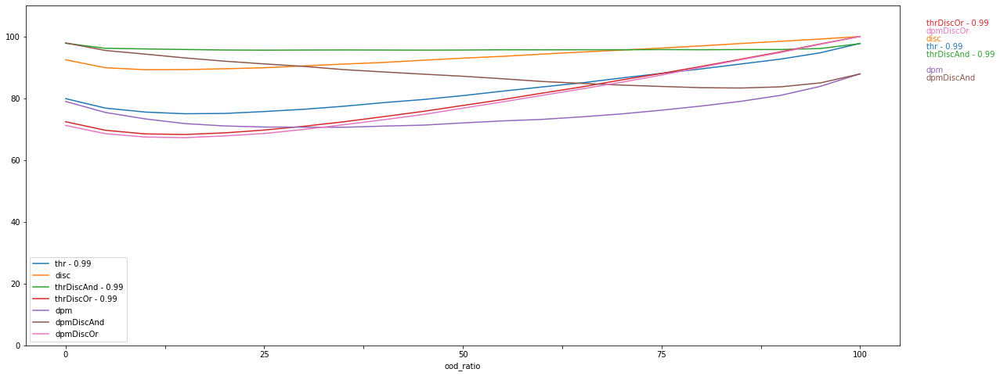

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,84.85,8.01
1,disc,77.28,6.14
2,thrDiscAnd - 0.99,81.33,7.85
3,thrDiscOr - 0.99,80.10,10.45
4,dpm,76.80,5.04
5,dpmDiscAnd,75.62,10.98
6,dpmDiscOr,76.83,9.38


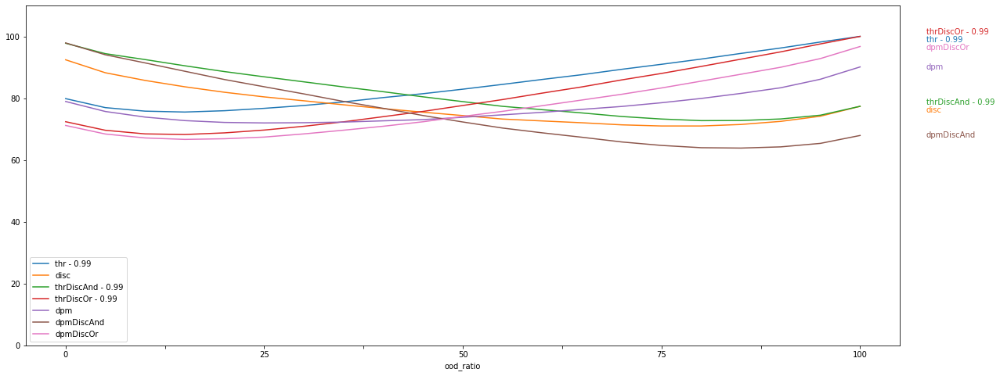

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,84.85,8.01
1,disc,93.64,3.50
2,thrDiscAnd - 0.99,97.95,1.18
3,thrDiscOr - 0.99,80.10,10.45
4,dpm,84.24,8.30
5,dpmDiscAnd,98.00,1.12
6,dpmDiscOr,79.39,10.82


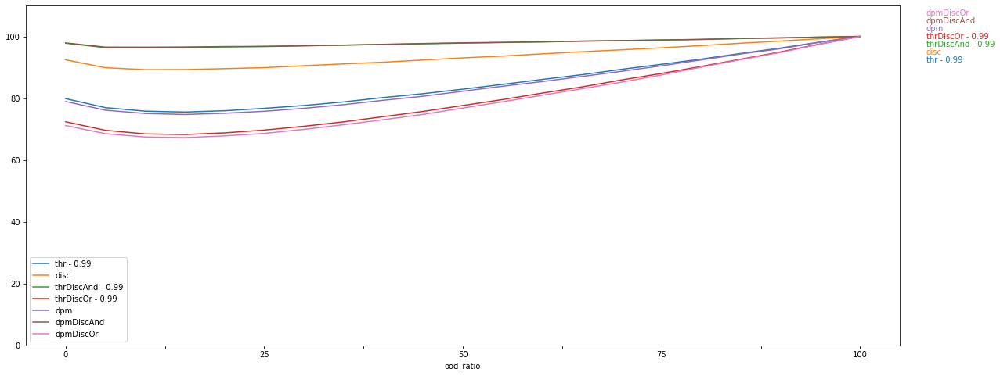

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot Sensitivity vs. ratio (binary)

In [ ]:
y = 'sensitivity'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,66.44,0.42
1,disc,85.81,0.28
2,thrDiscAnd - 0.99,95.53,0.14
3,thrDiscOr - 0.99,56.72,0.59
4,dpm,65.14,0.46
5,dpmDiscAnd,95.59,0.25
6,dpmDiscOr,55.36,0.49


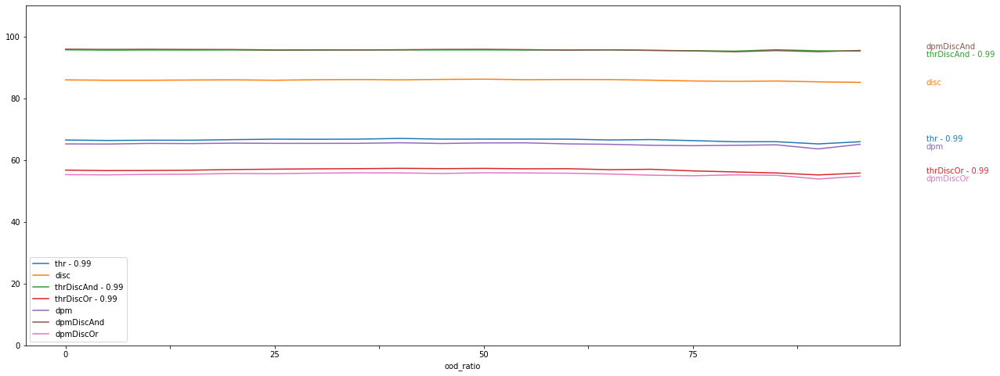

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,66.44,0.42
1,disc,85.81,0.28
2,thrDiscAnd - 0.99,95.53,0.14
3,thrDiscOr - 0.99,56.72,0.59
4,dpm,65.14,0.46
5,dpmDiscAnd,95.59,0.25
6,dpmDiscOr,55.36,0.49


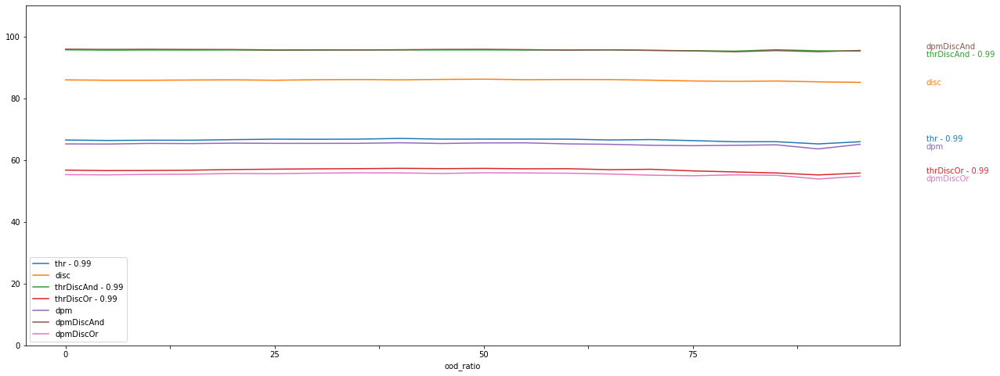

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,66.44,0.42
1,disc,85.81,0.28
2,thrDiscAnd - 0.99,95.53,0.14
3,thrDiscOr - 0.99,56.72,0.59
4,dpm,65.14,0.46
5,dpmDiscAnd,95.59,0.25
6,dpmDiscOr,55.36,0.49


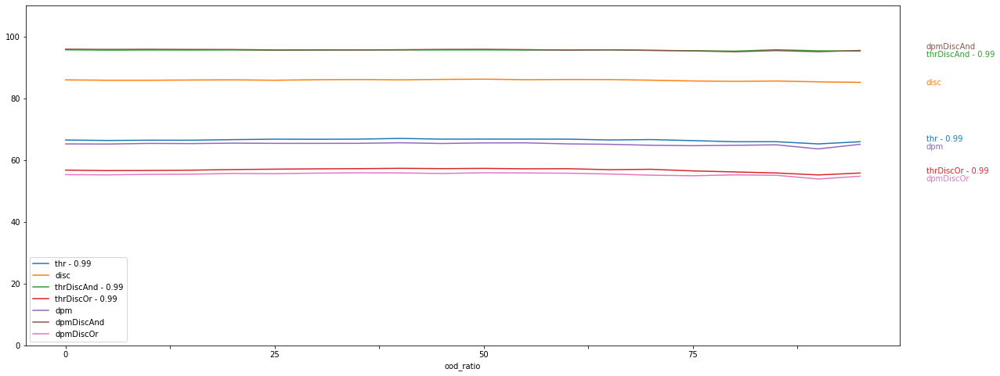

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,66.44,0.42
1,disc,85.81,0.28
2,thrDiscAnd - 0.99,95.53,0.14
3,thrDiscOr - 0.99,56.72,0.59
4,dpm,65.14,0.46
5,dpmDiscAnd,95.59,0.25
6,dpmDiscOr,55.36,0.49


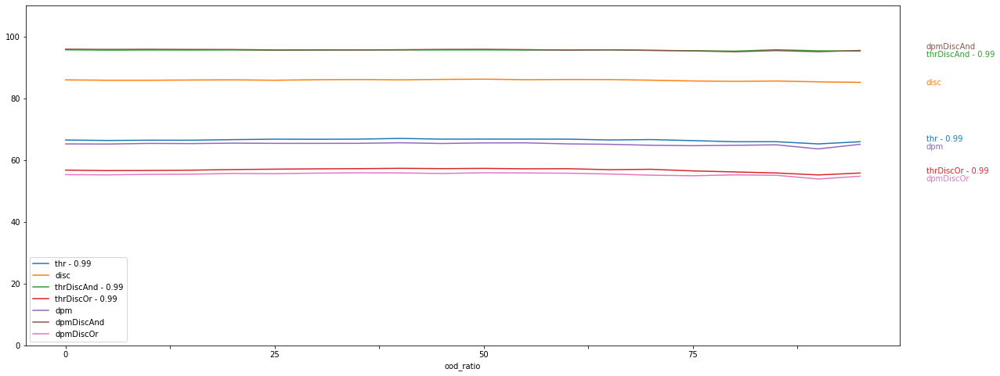

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,66.44,0.42
1,disc,85.81,0.28
2,thrDiscAnd - 0.99,95.53,0.14
3,thrDiscOr - 0.99,56.72,0.59
4,dpm,65.14,0.46
5,dpmDiscAnd,95.59,0.25
6,dpmDiscOr,55.36,0.49


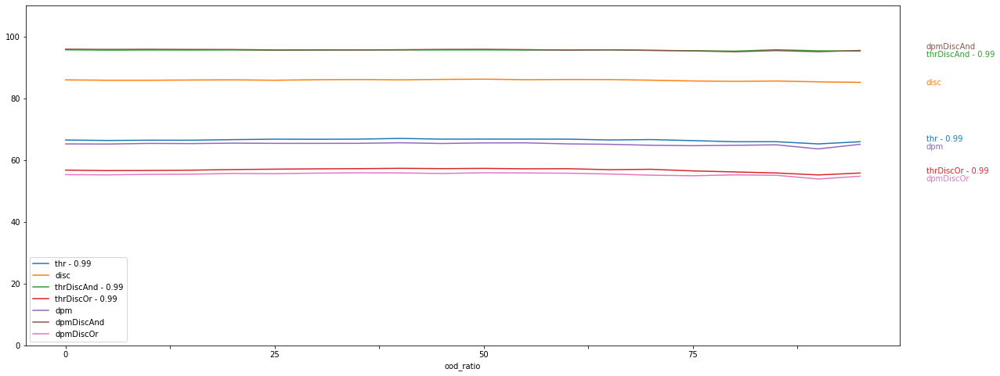

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,66.44,0.42
1,disc,85.81,0.28
2,thrDiscAnd - 0.99,95.53,0.14
3,thrDiscOr - 0.99,56.72,0.59
4,dpm,65.14,0.46
5,dpmDiscAnd,95.59,0.25
6,dpmDiscOr,55.36,0.49


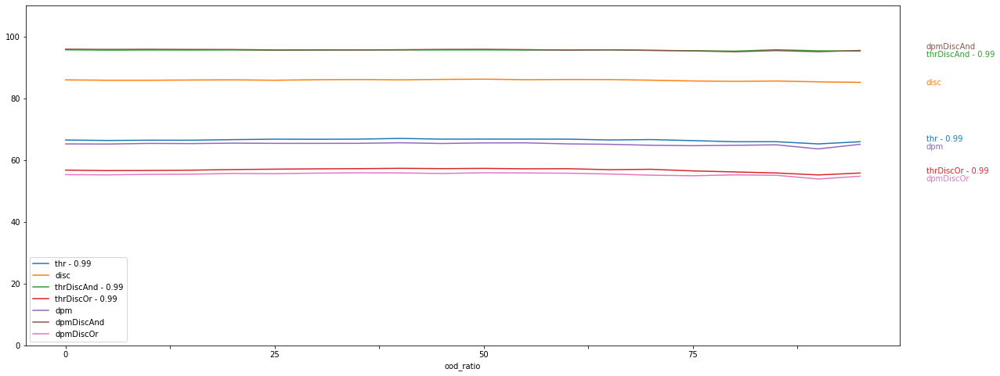

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Plot Specifity vs. ratio (binary)

In [ ]:
y = 'specifity'
exps = algorithms.copy()
target_thrs = ['0.99' ] #, '0.995', '0.999']

,exp,mean,std
0,thr - 0.99,81.69,1.50
1,disc,100.00,0.00
2,thrDiscAnd - 0.99,81.69,1.50
3,thrDiscOr - 0.99,100.00,0.00
4,dpm,70.95,1.73
5,dpmDiscAnd,70.95,1.73
6,dpmDiscOr,100.00,0.00


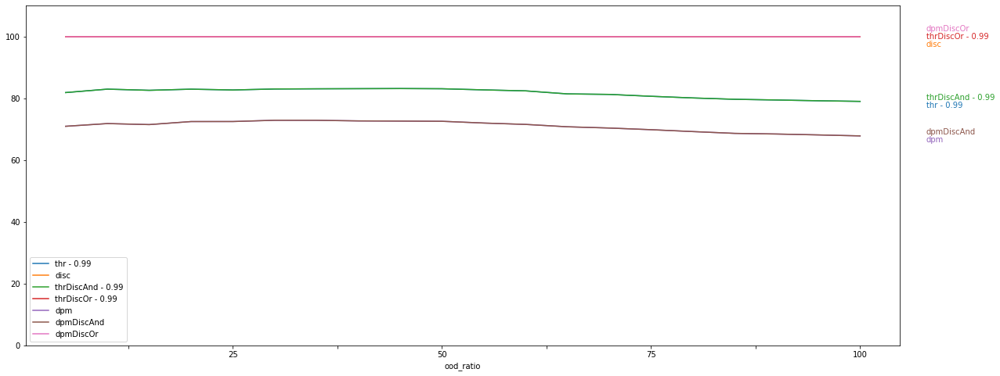

In [ ]:
ds_name = 'mnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,74.78,2.28
1,disc,99.86,0.03
2,thrDiscAnd - 0.99,74.66,2.25
3,thrDiscOr - 0.99,99.97,0.02
4,dpm,62.63,1.99
5,dpmDiscAnd,62.53,1.96
6,dpmDiscOr,99.96,0.02


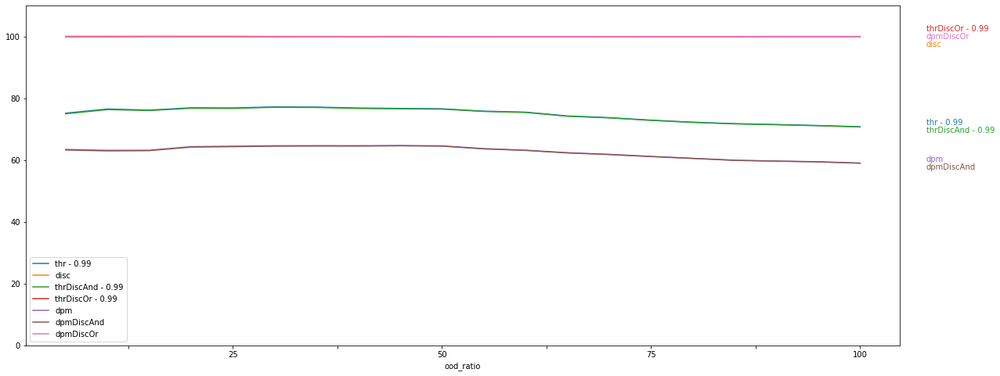

In [ ]:
ds_name = 'bmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,97.59,0.10
1,disc,99.99,0.01
2,thrDiscAnd - 0.99,97.58,0.10
3,thrDiscOr - 0.99,100.00,0.00
4,dpm,88.58,0.17
5,dpmDiscAnd,88.57,0.17
6,dpmDiscOr,100.00,0.00


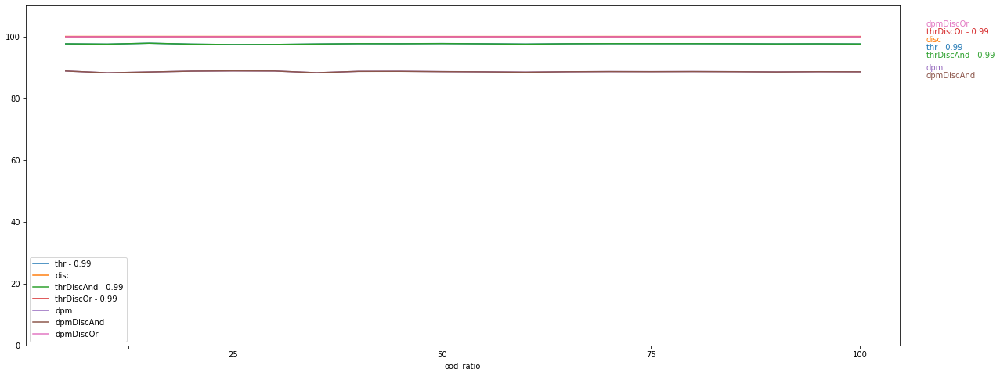

In [ ]:
ds_name = 'kmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,95.71,0.20
1,disc,99.87,0.05
2,thrDiscAnd - 0.99,95.57,0.21
3,thrDiscOr - 0.99,100.00,0.00
4,dpm,78.34,0.36
5,dpmDiscAnd,78.27,0.34
6,dpmDiscOr,99.94,0.02


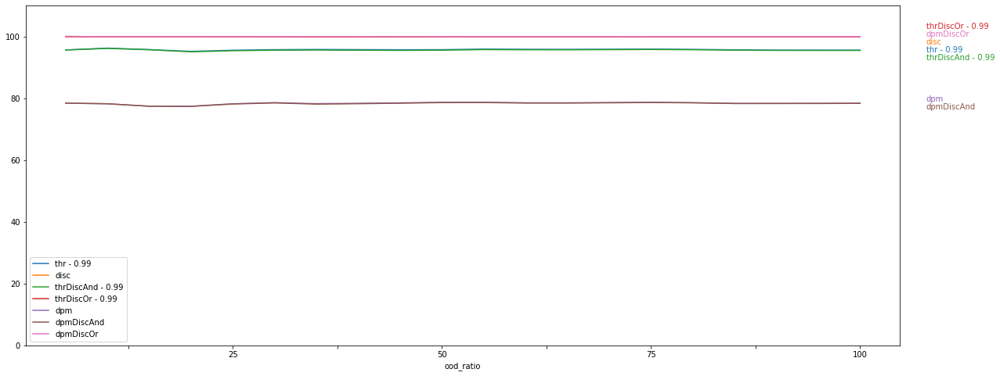

In [ ]:
ds_name = 'fmnist'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,100.00,0.00
1,disc,63.33,0.43
2,thrDiscAnd - 0.99,63.33,0.43
3,thrDiscOr - 0.99,100.00,0.00
4,dpm,83.12,1.38
5,dpmDiscAnd,52.08,0.52
6,dpmDiscOr,94.37,0.79


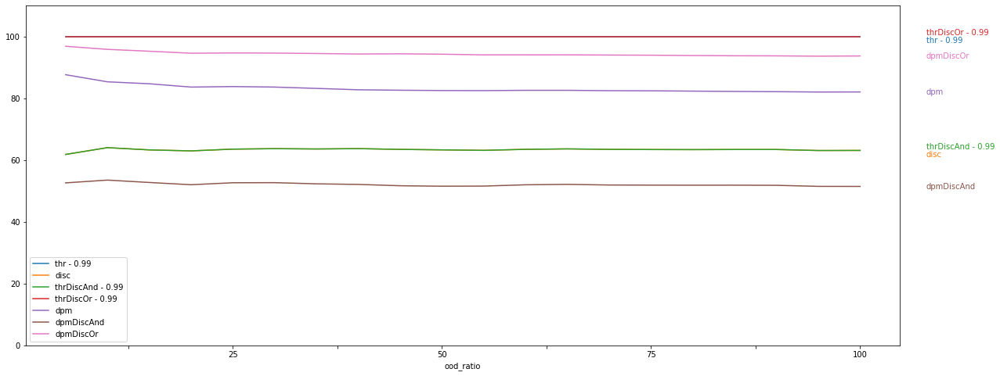

In [ ]:
ds_name = 'num'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

,exp,mean,std
0,thr - 0.99,100.0,0.0
1,disc,100.0,0.0
2,thrDiscAnd - 0.99,100.0,0.0
3,thrDiscOr - 0.99,100.0,0.0
4,dpm,100.0,0.0
5,dpmDiscAnd,100.0,0.0
6,dpmDiscOr,100.0,0.0


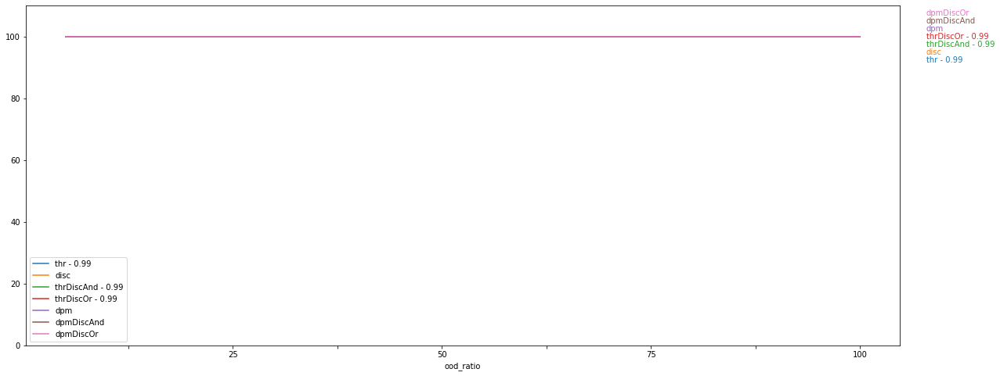

In [ ]:
ds_name = 'rnd'

plotVsRatio(exps=exps, results_df=results_df, ds_name=ds_name, y=y, thrs=target_thrs)

### Seperator


### Seperator


### Plot acc vs. thr

In [ ]:
x='thr'
y='acc'

,exp,mean,std
0,thr - 0,89.54,10.92
1,thr - 25,75.52,5.99
2,thr - 50,61.58,10.35
3,thr - 75,46.46,17.42
4,thr - 100,31.07,24.85
5,thrDiscAnd - 0,93.88,1.50
6,thrDiscAnd - 25,78.72,5.96
7,thrDiscAnd - 50,63.73,12.88
8,thrDiscAnd - 75,47.51,18.96
9,thrDiscAnd - 100,31.07,24.85


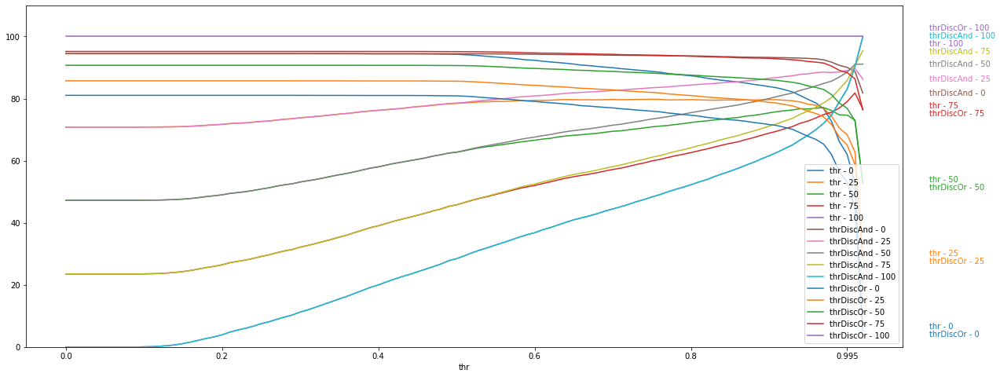

In [ ]:
ds_name = 'mnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,89.54,10.92
1,thr - 25,74.57,5.61
2,thr - 50,59.67,8.94
3,thr - 75,43.48,15.37
4,thr - 100,26.84,22.26
5,thrDiscAnd - 0,93.88,1.50
6,thrDiscAnd - 25,77.75,5.30
7,thrDiscAnd - 50,61.80,11.58
8,thrDiscAnd - 75,44.49,16.98
9,thrDiscAnd - 100,26.81,22.24


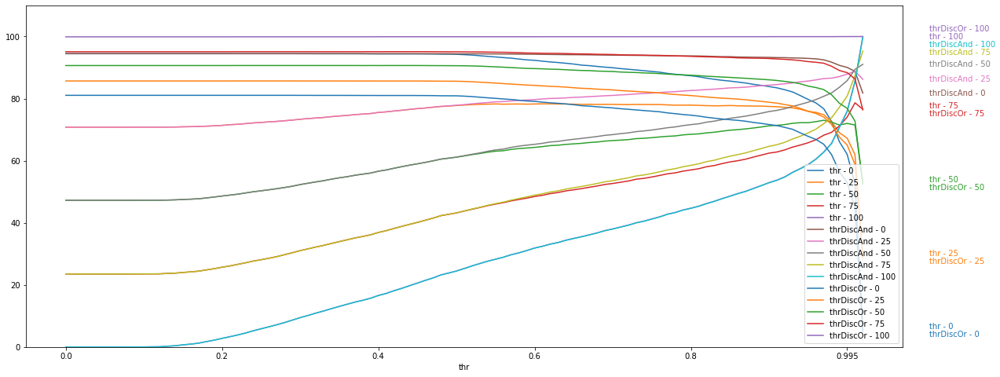

In [ ]:
ds_name = 'bmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,89.54,10.92
1,thr - 25,79.95,7.95
2,thr - 50,70.40,14.56
3,thr - 75,60.42,23.74
4,thr - 100,50.87,33.45
5,thrDiscAnd - 0,93.88,1.50
6,thrDiscAnd - 25,83.15,7.86
7,thrDiscAnd - 50,72.55,16.41
8,thrDiscAnd - 75,61.46,24.90
9,thrDiscAnd - 100,50.86,33.44


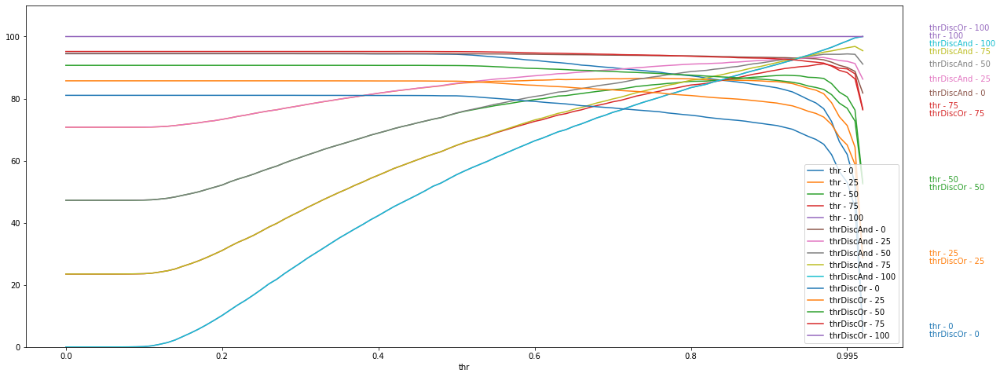

In [ ]:
ds_name = 'kmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,89.54,10.92
1,thr - 25,76.02,6.18
2,thr - 50,62.56,11.35
3,thr - 75,48.76,19.76
4,thr - 100,35.08,28.50
5,thrDiscAnd - 0,93.88,1.50
6,thrDiscAnd - 25,79.21,6.47
7,thrDiscAnd - 50,64.69,13.88
8,thrDiscAnd - 75,49.79,21.24
9,thrDiscAnd - 100,35.05,28.47


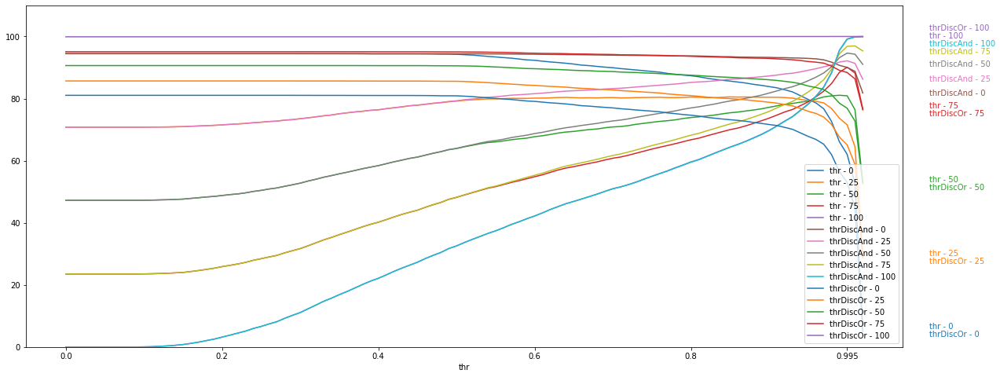

In [ ]:
ds_name = 'fmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,89.54,10.92
1,thr - 25,77.02,8.00
2,thr - 50,64.57,16.46
3,thr - 75,51.99,27.33
4,thr - 100,39.48,38.42
5,thrDiscAnd - 0,93.88,1.50
6,thrDiscAnd - 25,76.70,5.61
7,thrDiscAnd - 50,59.60,11.83
8,thrDiscAnd - 75,42.25,18.14
9,thrDiscAnd - 100,24.93,24.28


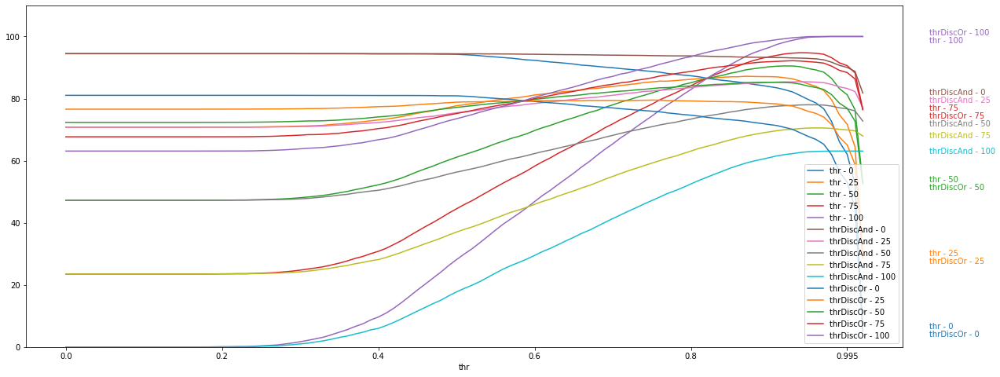

In [ ]:
ds_name = 'num'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,89.54,10.92
1,thr - 25,85.37,10.45
2,thr - 50,81.25,18.30
3,thr - 75,77.06,28.22
4,thr - 100,72.94,38.58
5,thrDiscAnd - 0,93.88,1.50
6,thrDiscAnd - 25,88.57,9.35
7,thrDiscAnd - 50,83.40,19.10
8,thrDiscAnd - 75,78.11,28.84
9,thrDiscAnd - 100,72.94,38.58


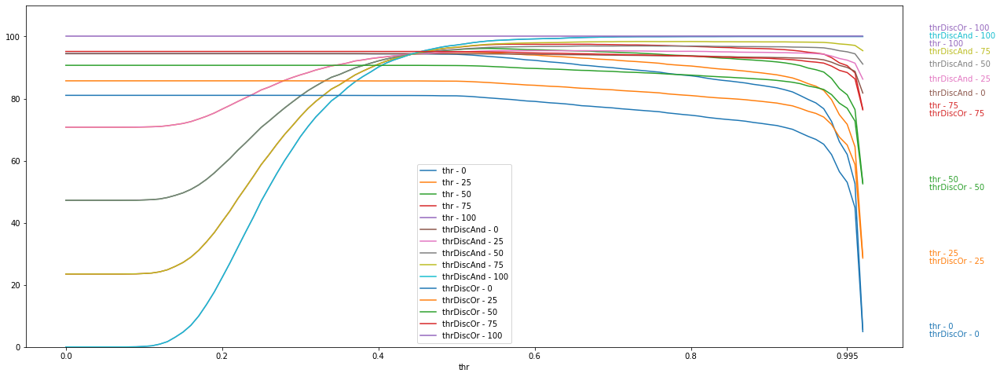

In [ ]:
ds_name = 'rnd'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

### Plot binary acc vs. thr

In [ ]:
x='thr'
y='bin_acc'

,exp,mean,std
0,thr - 0,93.45,12.29
1,thr - 25,78.48,5.99
2,thr - 50,63.50,9.56
3,thr - 75,47.47,16.97
4,thr - 100,31.07,24.85
5,thrDiscAnd - 0,99.23,1.64
6,thrDiscAnd - 25,82.75,5.81
7,thrDiscAnd - 50,66.36,12.78
8,thrDiscAnd - 75,48.88,18.91
9,thrDiscAnd - 100,31.07,24.85


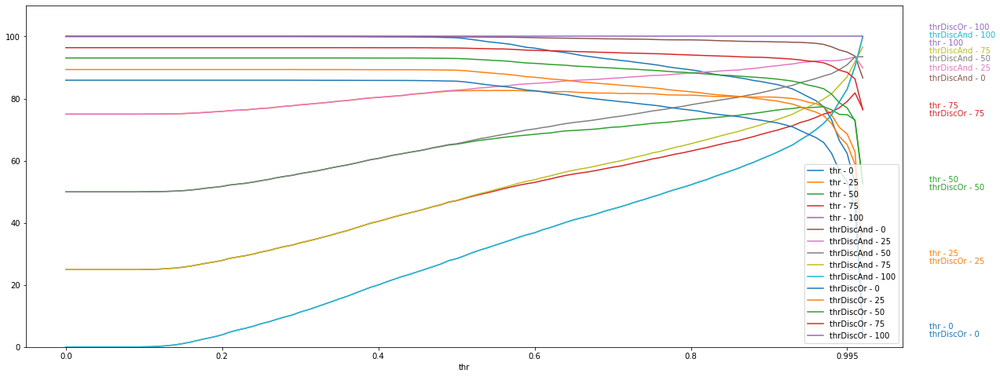

In [ ]:
ds_name = 'mnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thr - 25,77.54,5.77
2,thr - 50,61.59,8.15
3,thr - 75,44.48,14.92
4,thr - 100,26.84,22.26
5,thrDiscAnd - 0,99.23,1.64
6,thrDiscAnd - 25,81.79,5.15
7,thrDiscAnd - 50,64.42,11.48
8,thrDiscAnd - 75,45.86,16.93
9,thrDiscAnd - 100,26.81,22.24


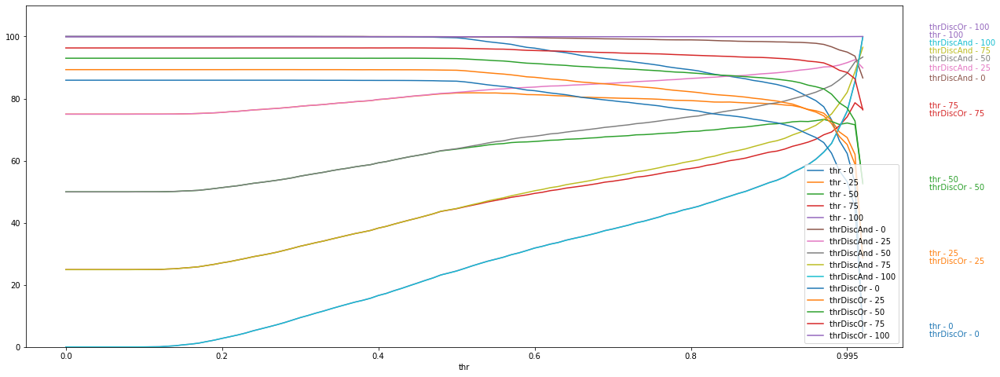

In [ ]:
ds_name = 'bmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thr - 25,82.91,7.76
2,thr - 50,72.32,13.87
3,thr - 75,61.43,23.34
4,thr - 100,50.87,33.45
5,thrDiscAnd - 0,99.23,1.64
6,thrDiscAnd - 25,87.18,7.72
7,thrDiscAnd - 50,75.17,16.32
8,thrDiscAnd - 75,62.84,24.86
9,thrDiscAnd - 100,50.86,33.44


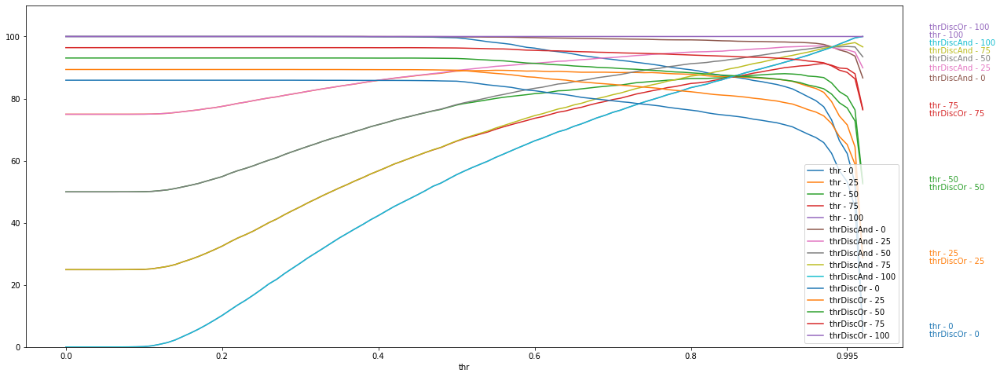

In [ ]:
ds_name = 'kmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thr - 25,78.98,6.08
2,thr - 50,64.47,10.55
3,thr - 75,49.77,19.31
4,thr - 100,35.08,28.50
5,thrDiscAnd - 0,99.23,1.64
6,thrDiscAnd - 25,83.24,6.32
7,thrDiscAnd - 50,67.31,13.78
8,thrDiscAnd - 75,51.16,21.19
9,thrDiscAnd - 100,35.05,28.47


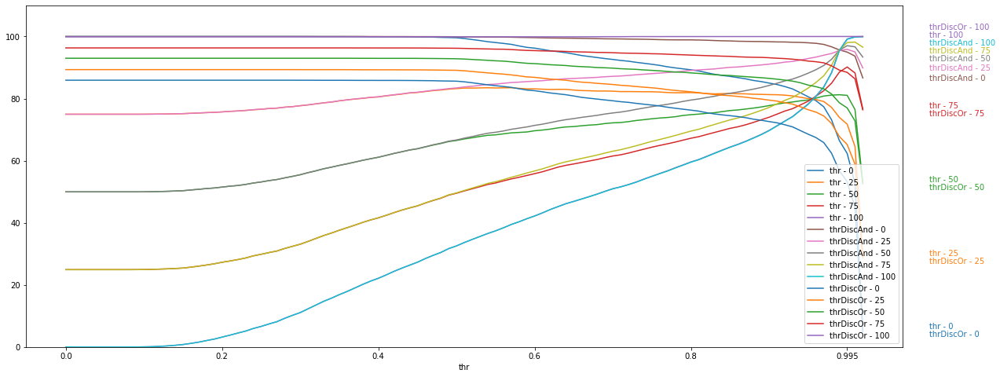

In [ ]:
ds_name = 'fmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thr - 25,79.98,7.42
2,thr - 50,66.49,15.61
3,thr - 75,52.99,26.87
4,thr - 100,39.48,38.42
5,thrDiscAnd - 0,99.23,1.64
6,thrDiscAnd - 25,80.73,5.46
7,thrDiscAnd - 50,62.22,11.73
8,thrDiscAnd - 75,43.62,18.09
9,thrDiscAnd - 100,24.93,24.28


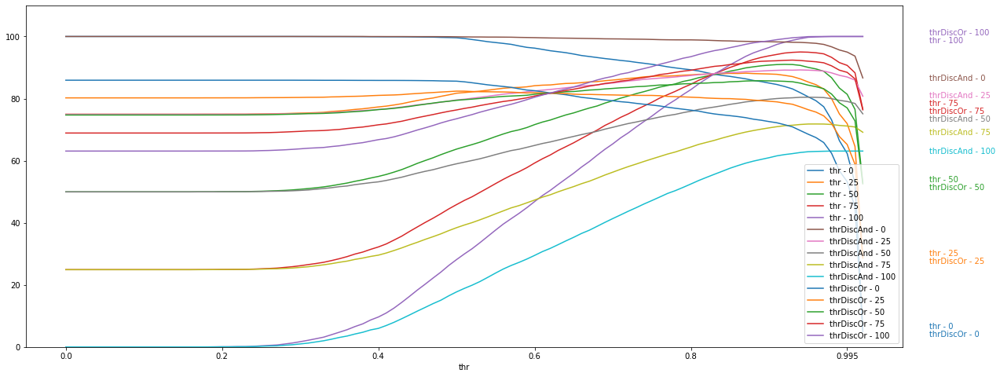

In [ ]:
ds_name = 'num'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thr - 25,88.33,10.52
2,thr - 50,83.16,17.92
3,thr - 75,78.07,27.96
4,thr - 100,72.94,38.58
5,thrDiscAnd - 0,99.23,1.64
6,thrDiscAnd - 25,92.61,9.27
7,thrDiscAnd - 50,86.02,19.04
8,thrDiscAnd - 75,79.48,28.81
9,thrDiscAnd - 100,72.94,38.58


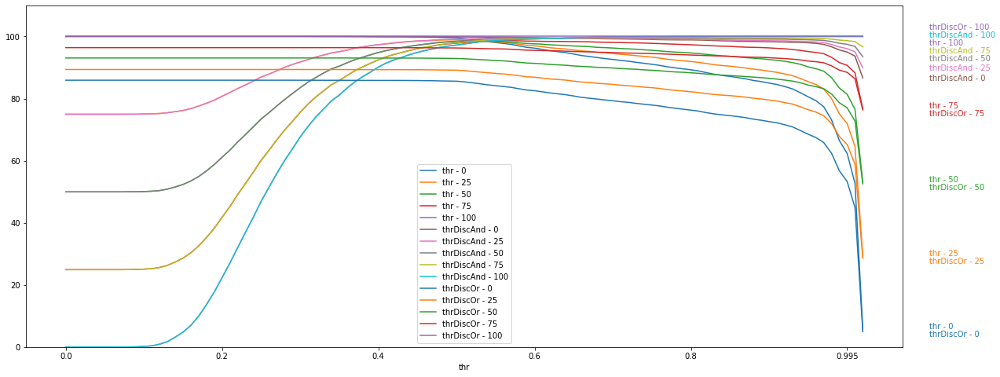

In [ ]:
ds_name = 'rnd'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

### Plot sensitivity vs. thr

In [ ]:
x='thr'
y='sensitivity'

,exp,mean,std
0,thr - 0,93.45,12.29
1,thrDiscAnd - 0,99.23,1.64
2,thrDiscOr - 0,80.14,10.65


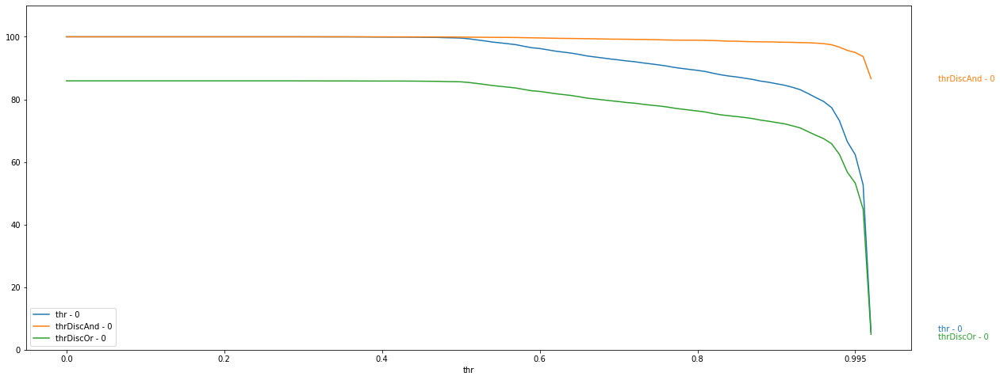

In [ ]:
ds_name = 'mnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thrDiscAnd - 0,99.23,1.64
2,thrDiscOr - 0,80.14,10.65


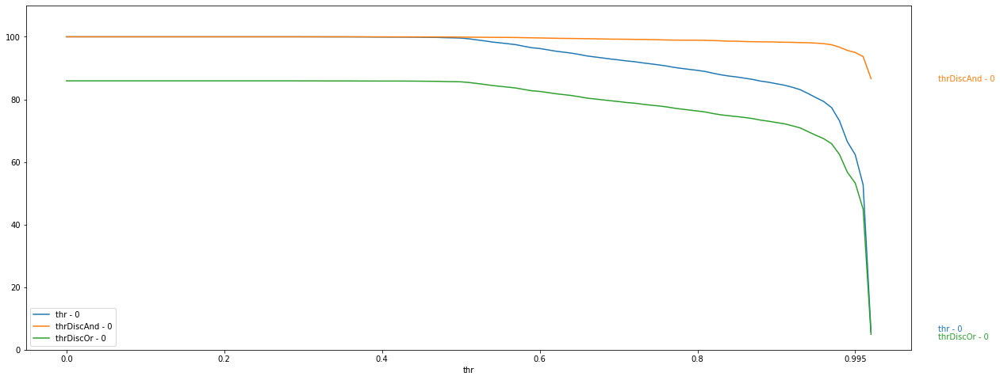

In [ ]:
ds_name = 'bmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thrDiscAnd - 0,99.23,1.64
2,thrDiscOr - 0,80.14,10.65


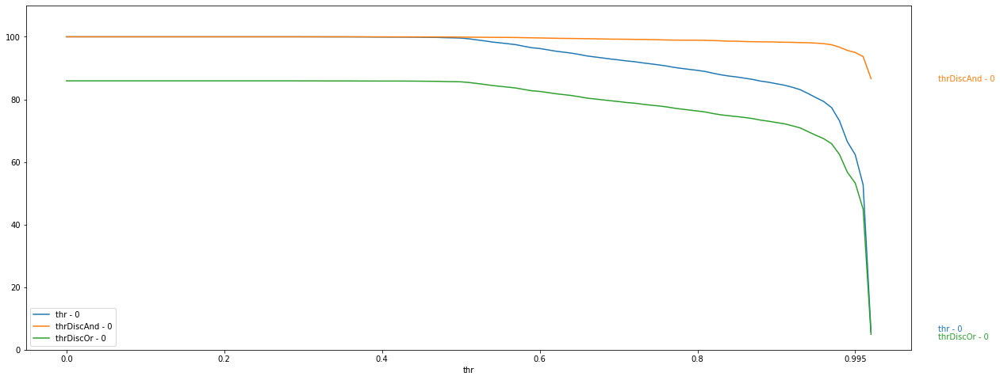

In [ ]:
ds_name = 'kmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thrDiscAnd - 0,99.23,1.64
2,thrDiscOr - 0,80.14,10.65


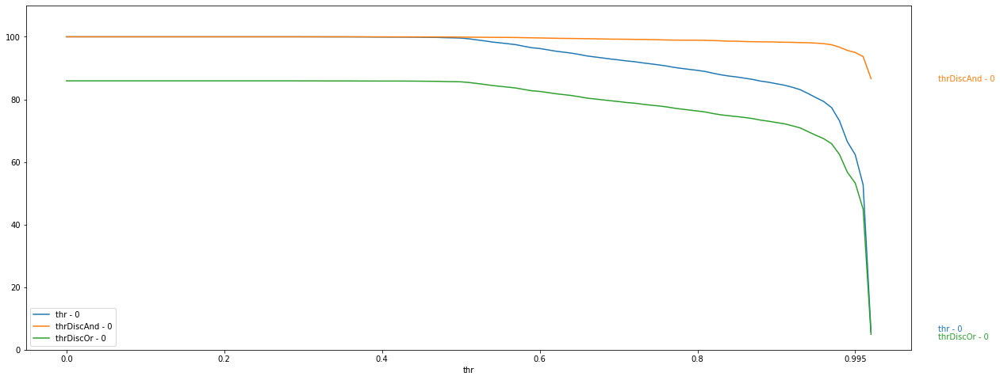

In [ ]:
ds_name = 'fmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thrDiscAnd - 0,99.23,1.64
2,thrDiscOr - 0,80.14,10.65


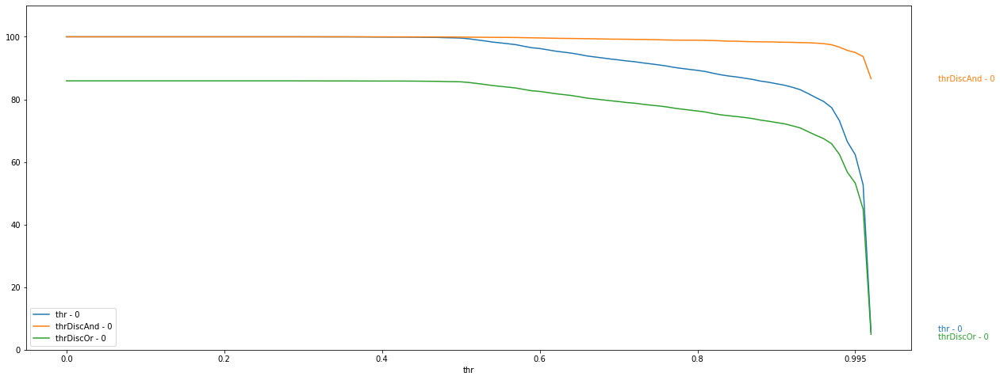

In [ ]:
ds_name = 'num'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 0,93.45,12.29
1,thrDiscAnd - 0,99.23,1.64
2,thrDiscOr - 0,80.14,10.65


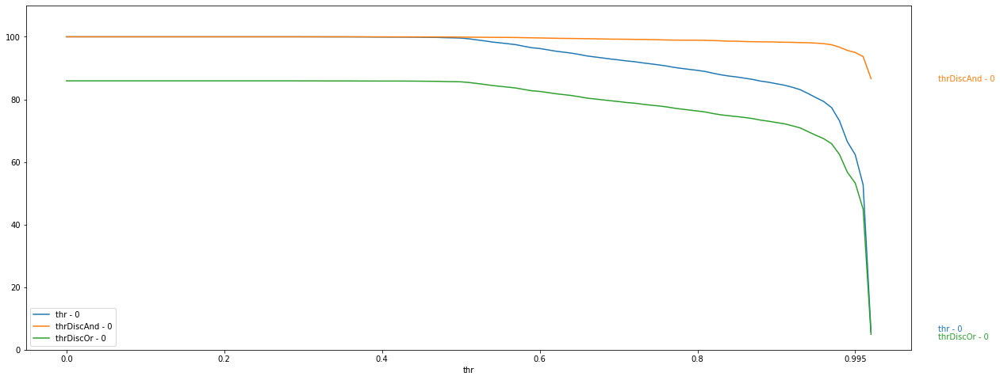

In [ ]:
ds_name = 'rnd'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

### Plot specifity vs. thr

In [ ]:
x='thr'
y='specifity'

,exp,mean,std
0,thr - 100,31.07,24.85
1,thrDiscAnd - 100,31.07,24.85
2,thrDiscOr - 100,100.00,0.00


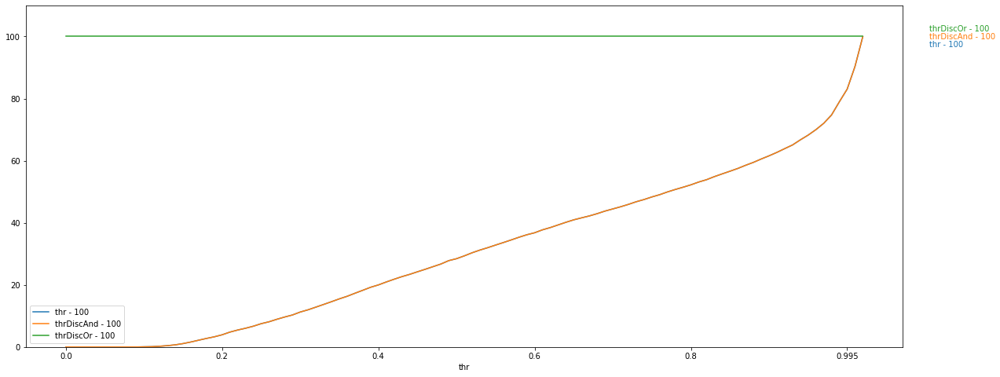

In [ ]:
ds_name = 'mnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 100,26.84,22.26
1,thrDiscAnd - 100,26.81,22.24
2,thrDiscOr - 100,99.92,0.02


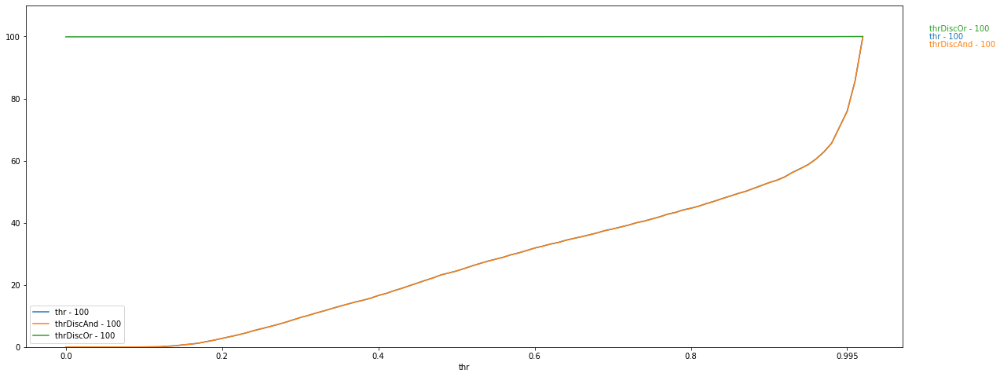

In [ ]:
ds_name = 'bmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 100,50.87,33.45
1,thrDiscAnd - 100,50.86,33.44
2,thrDiscOr - 100,100.00,0.00


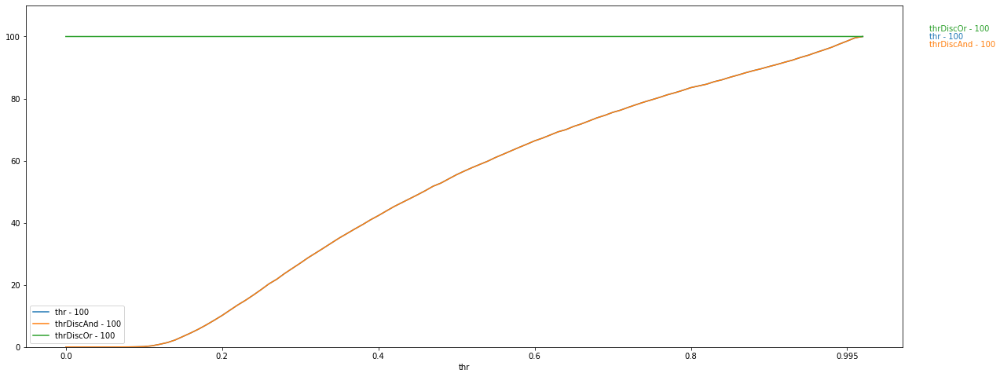

In [ ]:
ds_name = 'kmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 100,35.08,28.50
1,thrDiscAnd - 100,35.05,28.47
2,thrDiscOr - 100,99.93,0.04


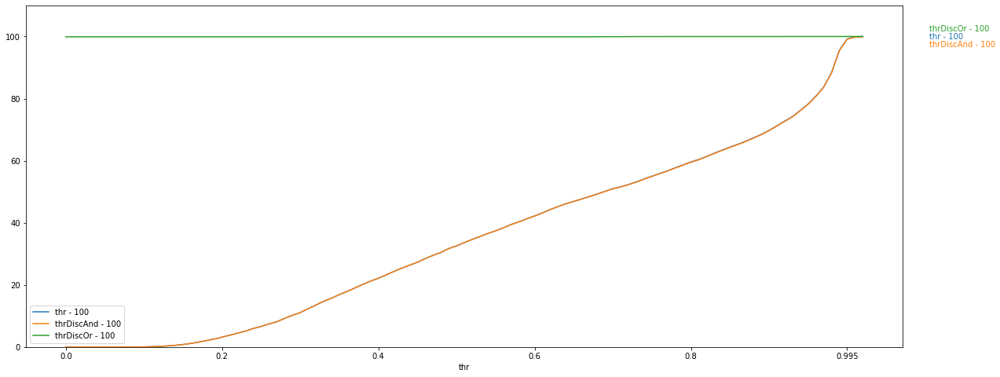

In [ ]:
ds_name = 'fmnist'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 100,39.48,38.42
1,thrDiscAnd - 100,24.93,24.28
2,thrDiscOr - 100,77.64,14.14


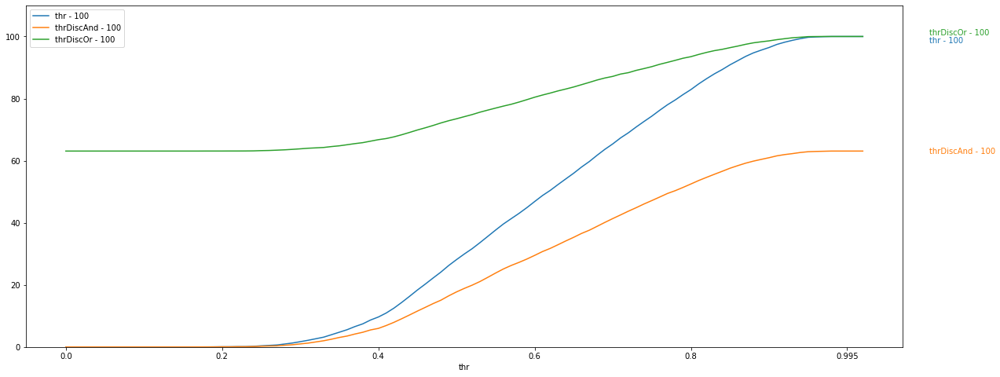

In [ ]:
ds_name = 'num'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

,exp,mean,std
0,thr - 100,72.94,38.58
1,thrDiscAnd - 100,72.94,38.58
2,thrDiscOr - 100,100.00,0.00


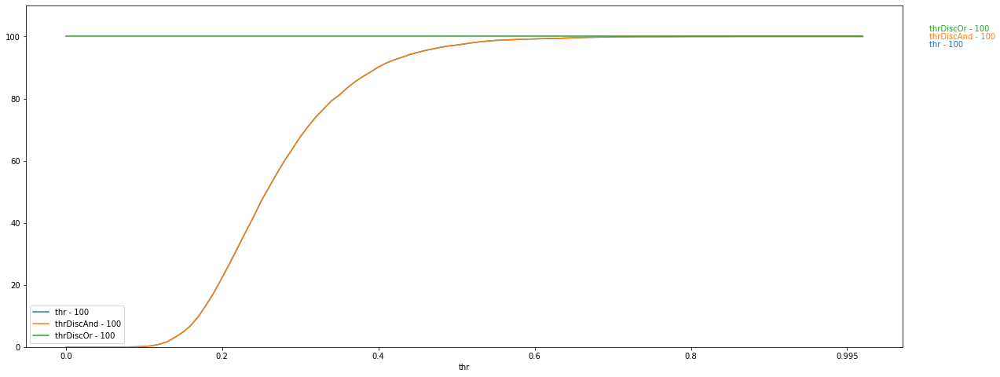

In [ ]:
ds_name = 'rnd'
exps = ['thr', 'thrDiscAnd', 'thrDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

plotVsThr(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

### Table Disc acc

In [ ]:
x='ood_ratio'
y='acc'

In [ ]:
ds_name = 'mnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']
printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

mnist acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  85.72  90.72  95.18  100.0
1         dpm     64.83  66.89  68.87  68.42   67.8
2  dpmDiscAnd     90.95  86.14  81.79  74.93   67.8
3   dpmDiscOr     54.93  66.47  77.80  88.67  100.0

In [ ]:
ds_name = 'bmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

bmnist acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  85.68  90.64  95.09  99.89
1         dpm     64.83  64.90  64.90  61.93  59.02
2  dpmDiscAnd     90.95  84.10  77.77  68.39  58.96
3   dpmDiscOr     54.93  66.47  77.77  88.63  99.95

In [ ]:
ds_name = 'kmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

kmnist acc results


exp ood_ratio                             
                      0     25     50     75     100
0        disc     81.05  85.72  90.71  95.17   99.99
1         dpm     64.83  71.00  76.91  82.52   88.54
2  dpmDiscAnd     90.95  90.24  89.82  89.02   88.53
3   dpmDiscOr     54.93  66.48  77.80  88.68  100.00

In [ ]:
ds_name = 'fmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

fmnist acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  85.68  90.63  95.09  99.90
1         dpm     64.83  68.34  71.95  75.08  78.39
2  dpmDiscAnd     90.95  87.55  84.82  81.54  78.34
3   dpmDiscOr     54.93  66.46  77.76  88.64  99.95

In [ ]:
ds_name = 'num'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

num acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  76.59  72.35  67.69  63.10
1         dpm     64.83  69.73  73.85  77.86  82.02
2  dpmDiscAnd     90.95  81.17  71.28  61.45  51.45
3   dpmDiscOr     54.93  65.14  74.92  84.10  93.67

In [ ]:
ds_name = 'rnd'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

rnd acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  85.72  90.72  95.18  100.0
1         dpm     64.83  73.79  82.62  91.09  100.0
2  dpmDiscAnd     90.95  93.03  95.54  97.60  100.0
3   dpmDiscOr     54.93  66.48  77.80  88.68  100.0

### Table Disc binary acc

In [ ]:
x='ood_ratio'
y='bin_acc'

In [ ]:
ds_name = 'mnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

mnist bin_acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     85.92  89.36  93.08  96.40  100.0
1         dpm     65.21  67.15  69.04  68.52   67.8
2  dpmDiscAnd     95.87  89.82  84.18  76.16   67.8
3   dpmDiscOr     55.26  66.69  77.95  88.76  100.0

In [ ]:
ds_name = 'bmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

bmnist acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  85.68  90.64  95.09  99.89
1         dpm     64.83  64.90  64.90  61.93  59.02
2  dpmDiscAnd     90.95  84.10  77.77  68.39  58.96
3   dpmDiscOr     54.93  66.47  77.77  88.63  99.95

In [ ]:
ds_name = 'kmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

kmnist acc results


exp ood_ratio                             
                      0     25     50     75     100
0        disc     81.05  85.72  90.71  95.17   99.99
1         dpm     64.83  71.00  76.91  82.52   88.54
2  dpmDiscAnd     90.95  90.24  89.82  89.02   88.53
3   dpmDiscOr     54.93  66.48  77.80  88.68  100.00

In [ ]:
ds_name = 'fmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

fmnist acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  85.68  90.63  95.09  99.90
1         dpm     64.83  68.34  71.95  75.08  78.39
2  dpmDiscAnd     90.95  87.55  84.82  81.54  78.34
3   dpmDiscOr     54.93  66.46  77.76  88.64  99.95

In [ ]:
ds_name = 'num'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

num acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  76.59  72.35  67.69  63.10
1         dpm     64.83  69.73  73.85  77.86  82.02
2  dpmDiscAnd     90.95  81.17  71.28  61.45  51.45
3   dpmDiscOr     54.93  65.14  74.92  84.10  93.67

In [ ]:
ds_name = 'rnd'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '25', '50', '75', '100']

printDiscData(exps, results_df, ds_name, x='ood_ratio', y='acc', ratios=target_ratios)

rnd acc results


exp ood_ratio                            
                      0     25     50     75    100
0        disc     81.05  85.72  90.72  95.18  100.0
1         dpm     64.83  73.79  82.62  91.09  100.0
2  dpmDiscAnd     90.95  93.03  95.54  97.60  100.0
3   dpmDiscOr     54.93  66.48  77.80  88.68  100.0

### Table Disc sensitivity

In [ ]:
x='ood_ratio'
y='sensitivity'

In [ ]:
ds_name = 'mnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

mnist sensitivity results


,exp,sensitivity
0,disc,85.92
1,dpm,65.21
2,dpmDiscAnd,95.87
3,dpmDiscOr,55.26


In [ ]:
ds_name = 'bmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

bmnist sensitivity results


,exp,sensitivity
0,disc,85.92
1,dpm,65.21
2,dpmDiscAnd,95.87
3,dpmDiscOr,55.26


In [ ]:
ds_name = 'kmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

kmnist sensitivity results


,exp,sensitivity
0,disc,85.92
1,dpm,65.21
2,dpmDiscAnd,95.87
3,dpmDiscOr,55.26


In [ ]:
ds_name = 'fmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

fmnist sensitivity results


,exp,sensitivity
0,disc,85.92
1,dpm,65.21
2,dpmDiscAnd,95.87
3,dpmDiscOr,55.26


In [ ]:
ds_name = 'num'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

num sensitivity results


,exp,sensitivity
0,disc,85.92
1,dpm,65.21
2,dpmDiscAnd,95.87
3,dpmDiscOr,55.26


In [ ]:
ds_name = 'rnd'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

rnd sensitivity results


,exp,sensitivity
0,disc,85.92
1,dpm,65.21
2,dpmDiscAnd,95.87
3,dpmDiscOr,55.26


### Table Disc specifity

In [ ]:
x='ood_ratio'
y='specifity'

In [ ]:
ds_name = 'mnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

mnist specifity results


,exp,specifity
0,disc,100.0
1,dpm,67.8
2,dpmDiscAnd,67.8
3,dpmDiscOr,100.0


In [ ]:
ds_name = 'bmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

bmnist specifity results


,exp,specifity
0,disc,99.89
1,dpm,59.02
2,dpmDiscAnd,58.96
3,dpmDiscOr,99.95


In [ ]:
ds_name = 'kmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

kmnist specifity results


,exp,specifity
0,disc,99.99
1,dpm,88.54
2,dpmDiscAnd,88.53
3,dpmDiscOr,100.00


In [ ]:
ds_name = 'fmnist'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

fmnist specifity results


,exp,specifity
0,disc,99.90
1,dpm,78.39
2,dpmDiscAnd,78.34
3,dpmDiscOr,99.95


In [ ]:
ds_name = 'num'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

num specifity results


,exp,specifity
0,disc,63.10
1,dpm,82.02
2,dpmDiscAnd,51.45
3,dpmDiscOr,93.67


In [ ]:
ds_name = 'rnd'
exps = ['disc', 'dpm', 'dpmDiscAnd', 'dpmDiscOr']
target_ratios = ['0', '100']

printDiscData(exps, results_df, ds_name, x=x, y=y, ratios=target_ratios)

rnd specifity results


,exp,specifity
0,disc,100.0
1,dpm,100.0
2,dpmDiscAnd,100.0
3,dpmDiscOr,100.0
